<a href="https://colab.research.google.com/github/AndreiAf02/STAT561_Project/blob/main/Credit_Default_Transductive_TL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##STAT 561 Project - Sampling Methodologies in Improving Transfer Learning Efficiency in Diabetes Prediction

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from time import perf_counter



from sklearn.preprocessing import StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
# !pip install pytorch-tabnet

# from pytorch_tabnet.tab_model import TabNetClassifier
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay



## Data taken from the UCI Machine Learning repository [here](https://doi.org/10.24432/C53919):

In [2]:
pip install ucimlrepo

In [3]:
from ucimlrepo import fetch_ucirepo

# # fetch dataset
# cdc_diabetes_health_indicators = fetch_ucirepo(id=891)

# fetch dataset
default_of_credit_card_clients = fetch_ucirepo(id=350)

# data (as pandas dataframes)
X = default_of_credit_card_clients.data.features
y = default_of_credit_card_clients.data.targets

# metadata
print(default_of_credit_card_clients.metadata)

# variable information
print(default_of_credit_card_clients.variables)



{'uci_id': 350, 'name': 'Default of Credit Card Clients', 'repository_url': 'https://archive.ics.uci.edu/dataset/350/default+of+credit+card+clients', 'data_url': 'https://archive.ics.uci.edu/static/public/350/data.csv', 'abstract': "This research aimed at the case of customers' default payments in Taiwan and compares the predictive accuracy of probability of default among six data mining methods.", 'area': 'Business', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 30000, 'num_features': 23, 'feature_types': ['Integer', 'Real'], 'demographics': ['Sex', 'Education Level', 'Marital Status', 'Age'], 'target_col': ['Y'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Fri Mar 29 2024', 'dataset_doi': '10.24432/C55S3H', 'creators': ['I-Cheng Yeh'], 'intro_paper': {'ID': 365, 'type': 'NATIVE', 'title': 'The comparisons of data mining techniques for the predictive accuracy of 

In [4]:
X['X3'].unique()

array([2, 1, 3, 5, 4, 6, 0])

In [5]:
## Cleaning up the 'unknown' education levels:

data_total = pd.concat([X, y], axis=1)
data_total = data_total[(data_total['X3'] != 5) & (data_total['X3'] != 6) & (data_total['X3'] != 0)]
data_total = data_total.reset_index(drop=True)
data_total

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X15,X16,X17,X18,X19,X20,X21,X22,X23,Y
0,20000,2,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
1,120000,2,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,1,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29650,220000,1,3,1,39,0,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29651,150000,1,3,2,43,-1,-1,-1,-1,0,...,8979,5190,0,1837,3526,8998,129,0,0,0
29652,30000,1,2,2,37,4,3,2,-1,0,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29653,80000,1,3,1,41,1,-1,0,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [6]:
X = data_total.iloc[:, :-1]
y = data_total.iloc[:,-1]
y

,Y
0,1
1,1
2,0
3,0
4,0
...,...
29650,0
29651,0
29652,1
29653,1


In [7]:
X['X3'].unique()

array([2, 1, 3, 4])

In [8]:
## Scaling the predictive data

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_scaled = pd.DataFrame(X_scaled)

In [9]:
data2 = pd.concat([X_scaled, y], axis=1)
data2

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,Y
0,0.010101,1.0,0.333333,0.333333,0.051724,0.4,0.4,0.1,0.1,0.0,...,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000,1
1,0.111111,1.0,0.333333,0.666667,0.086207,0.1,0.4,0.2,0.2,0.2,...,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783,1
2,0.080808,1.0,0.333333,0.666667,0.224138,0.2,0.2,0.2,0.2,0.2,...,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458,0
3,0.040404,1.0,0.333333,0.333333,0.275862,0.2,0.2,0.2,0.2,0.2,...,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892,0
4,0.040404,0.0,0.333333,0.333333,0.620690,0.1,0.2,0.1,0.2,0.2,...,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29650,0.212121,0.0,0.666667,0.333333,0.310345,0.2,0.2,0.2,0.2,0.2,...,0.243036,0.111622,0.273259,0.009730,0.011875,0.005583,0.004907,0.011723,0.001892,0
29651,0.141414,0.0,0.666667,0.666667,0.379310,0.1,0.1,0.1,0.1,0.2,...,0.168596,0.085794,0.260979,0.002103,0.002094,0.010042,0.000208,0.000000,0.000000,0
29652,0.020202,0.0,0.333333,0.666667,0.275862,0.6,0.5,0.4,0.1,0.2,...,0.179805,0.101057,0.275854,0.000000,0.000000,0.024552,0.006763,0.004689,0.005864,1
29653,0.070707,0.0,0.666667,0.333333,0.344828,0.3,0.1,0.2,0.2,0.2,...,0.209850,0.092403,0.298591,0.098334,0.002024,0.001315,0.003101,0.124174,0.003412,1


In [10]:
y.value_counts()

,count
Y,
0,23045
1,6610


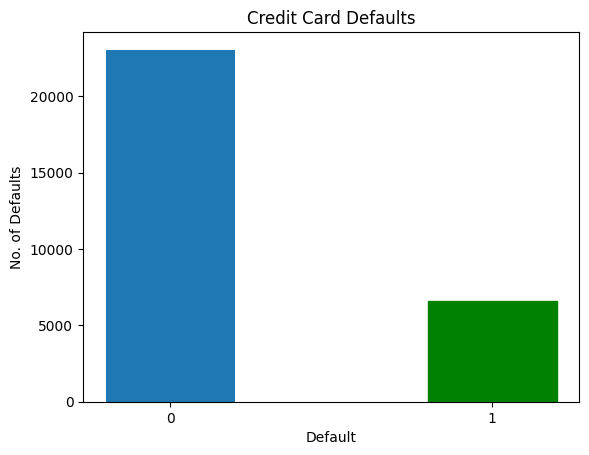

In [11]:
barlist = plt.bar([str(0),str(1)], y.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Default")
plt.ylabel("No. of Defaults")
plt.title("Credit Card Defaults")
plt.show()

In [12]:
data2.iloc[:, 2].value_counts()

,count
2,
0.333333,14030
0.000000,10585
0.666667,4917
1.000000,123


# Splitting for Source and Target Domains:


# Full Dataset:

In [13]:
data_S = data2[data2.iloc[:,2] <= 0.5]  ## Source domain and classification
data_T = data2[data2.iloc[:,2] > 0.5]  ## Target domain and classification

In [14]:
data_S

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,Y
0,0.010101,1.0,0.333333,0.333333,0.051724,0.4,0.4,0.1,0.1,0.0,...,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000,1
1,0.111111,1.0,0.333333,0.666667,0.086207,0.1,0.4,0.2,0.2,0.2,...,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783,1
2,0.080808,1.0,0.333333,0.666667,0.224138,0.2,0.2,0.2,0.2,0.2,...,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458,0
3,0.040404,1.0,0.333333,0.333333,0.275862,0.2,0.2,0.2,0.2,0.2,...,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892,0
4,0.040404,0.0,0.333333,0.333333,0.620690,0.1,0.2,0.1,0.2,0.2,...,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29646,0.202020,0.0,0.333333,0.333333,0.224138,0.5,0.4,0.4,0.4,0.4,...,0.162493,0.083127,0.262900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
29648,0.090909,0.0,0.000000,0.666667,0.293103,0.2,0.1,0.1,0.2,0.2,...,0.226667,0.149535,0.303248,0.002290,0.066370,0.004464,0.004831,0.004689,0.003783,0
29649,0.070707,0.0,0.333333,0.666667,0.224138,0.4,0.4,0.4,0.4,0.4,...,0.233160,0.162558,0.323347,0.008013,0.002078,0.000000,0.011272,0.000000,0.007566,1
29652,0.020202,0.0,0.333333,0.666667,0.275862,0.6,0.5,0.4,0.1,0.2,...,0.179805,0.101057,0.275854,0.000000,0.000000,0.024552,0.006763,0.004689,0.005864,1


In [15]:
data_T

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,Y
8,0.131313,1.0,0.666667,0.333333,0.120690,0.2,0.2,0.4,0.2,0.2,...,0.171640,0.092342,0.263837,0.003811,0.000000,0.000482,0.001610,0.002345,0.001892,0
9,0.010101,0.0,0.666667,0.666667,0.241379,0.0,0.0,0.0,0.0,0.1,...,0.160138,0.093545,0.271670,0.000000,0.000000,0.000000,0.020945,0.002631,0.000000,0
10,0.191919,1.0,0.666667,0.666667,0.224138,0.2,0.2,0.4,0.2,0.2,...,0.162505,0.082461,0.263846,0.002640,0.000007,0.000056,0.000483,0.008764,0.000125,0
15,0.040404,1.0,0.666667,1.000000,0.034483,0.3,0.4,0.2,0.2,0.2,...,0.187240,0.109930,0.284195,0.000000,0.000891,0.001228,0.001932,0.003048,0.002081,0
20,0.121212,1.0,0.666667,0.666667,0.310345,0.2,0.2,0.2,0.2,0.2,...,0.179558,0.092351,0.261693,0.003434,0.000913,0.001116,0.003221,0.002180,0.063866,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29635,0.040404,0.0,0.666667,0.666667,0.362069,0.2,0.2,0.2,0.2,0.2,...,0.207576,0.100451,0.276113,0.011448,0.002375,0.005580,0.004831,0.010550,0.003783,0
29647,0.000000,0.0,0.666667,0.333333,0.379310,0.2,0.2,0.2,0.0,0.0,...,0.160138,0.080648,0.260979,0.002290,0.000000,0.000000,0.000000,0.000000,0.000000,0
29650,0.212121,0.0,0.666667,0.333333,0.310345,0.2,0.2,0.2,0.2,0.2,...,0.243036,0.111622,0.273259,0.009730,0.011875,0.005583,0.004907,0.011723,0.001892,0
29651,0.141414,0.0,0.666667,0.666667,0.379310,0.1,0.1,0.1,0.1,0.2,...,0.168596,0.085794,0.260979,0.002103,0.002094,0.010042,0.000208,0.000000,0.000000,0


## Source domain and task labels:

In [16]:
X_S_full = data_S.iloc[:, :-1]
X_S_full       ## Source domain


y_S_full = data_S.iloc[:, -1]
y_S_full       ## Source classification (response)

,Y
0,1
1,1
2,0
3,0
4,0
...,...
29646,1
29648,0
29649,1
29652,1


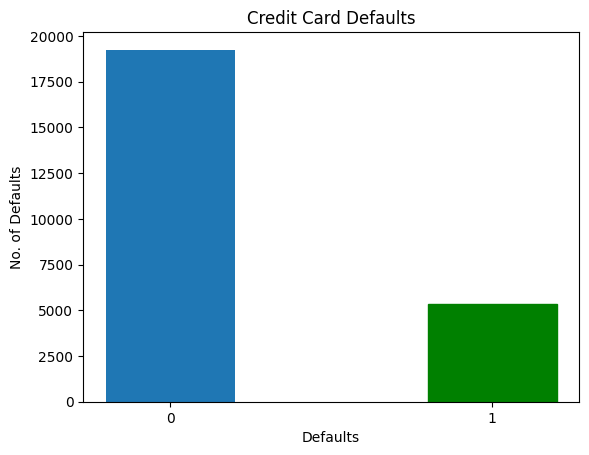

In [17]:
barlist_S = plt.bar([str(0),str(1)], y_S_full.value_counts(), width = 0.4)
barlist_S[1].set_color('g')

plt.xlabel("Defaults")
plt.ylabel("No. of Defaults")
plt.title("Credit Card Defaults")
plt.show()

## Target domain and task labels:

In [18]:
X_T_full = data_T.iloc[:, :-1]
X_T_full       ## Target domain


y_T_full = data_T.iloc[:, -1]
y_T_full       ## Target classification (response)

,Y
8,0
9,0
10,0
15,0
20,0
...,...
29635,0
29647,0
29650,0
29651,0


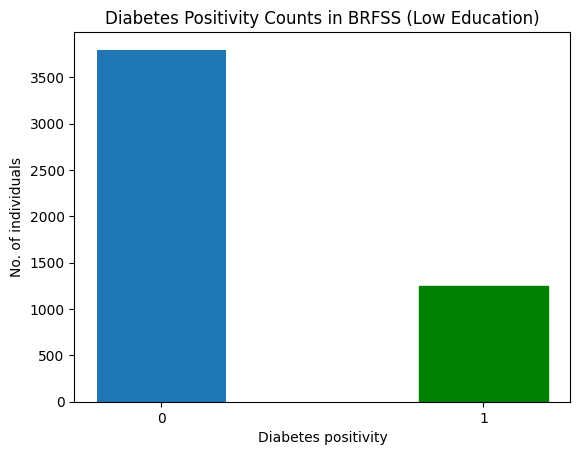

In [19]:
barlist_T = plt.bar([str(0),str(1)], y_T_full.value_counts(), width = 0.4)
barlist_T[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Low Education)")
plt.show()

## Updated Code (Modified from Shreya's code):

In [20]:
def create_dnn_model(input_shape):
  model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
    ])

  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

  return model



def train_and_evaluate(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    # conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    # fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # # ROC Curve
    # ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    # ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    # ax1.set_xlabel('False Positive Rate')
    # ax1.set_ylabel('True Positive Rate')
    # ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    # ax1.legend(loc='lower right')
    # ax1.grid()

    # # Confusion Matrix
    # conf_disp.plot(ax=ax2, cmap='Blues')
    # ax2.set_title('Confusion Matrix')
    # plt.tight_layout()
    # plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")

    time_stop = perf_counter()

    time_elapsed = time_stop-time_start

    print('Time elapsed (performance):', time_elapsed)
    return time_elapsed


In [21]:
def Transductive_TL(model, X_test, y_test, domain):

    time_start = perf_counter()

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    # print('Confusion matrix:', conf_matrix)
    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    tnr = 1-fpr

    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])
    tpr = 1 - fnr
    print('FPR', fpr, 'TPR:', tpr, 'FNR:', fnr, 'TNR:', tnr)
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")
    print('False Negative Rate:', fnr)

    time_stop = perf_counter()

    time_elapsed = time_stop-time_start

    print('Time elapsed (performance):', time_elapsed)

    return fpr, tnr, fnr, tpr, time_elapsed

In [22]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_full, y_S_full, test_size=0.20, random_state=0)

In [23]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (19692, 23)
y_S_train: (19692,)
X_S_test: (4923, 23)
y_S_test: (4923,)


In [24]:
model_source = create_dnn_model(X_S_train.shape[1])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6153 - loss: 0.5202 - val_AUC: 0.7256 - val_loss: 0.4632
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7344 - loss: 0.4456 - val_AUC: 0.7452 - val_loss: 0.4518
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7481 - loss: 0.4447 - val_AUC: 0.7561 - val_loss: 0.4492
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7517 - loss: 0.4380 - val_AUC: 0.7630 - val_loss: 0.4452
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7644 - loss: 0.4349 - val_AUC: 0.7666 - val_loss: 0.4418
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7603 - loss: 0.4420 - val_AUC: 0.7663 - val_loss: 0.4438
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7708 - loss: 0.4295 - val_AUC: 0.7716 - val_loss: 0.4430
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7595 - loss: 0.4355 - val_AUC: 0.7737 - val_loss: 0.4390
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7667 -

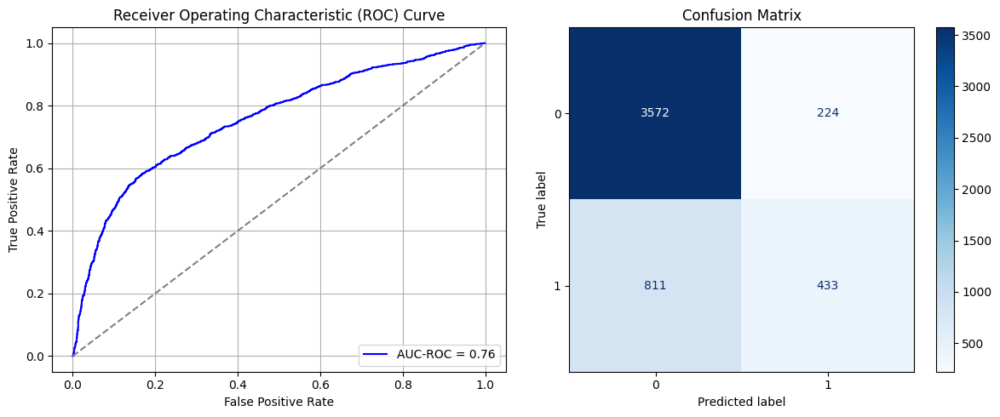

Best threshold based on F1-score: 0.9408056139945984
False Negative Rate: 0.6519292604501608
Time elapsed (performance): 0.7143234939994727
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.5944 - loss: 0.5194 - val_AUC: 0.7312 - val_loss: 0.4643
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7375 - loss: 0.4515 - val_AUC: 0.7543 - val_loss: 0.4490
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7411 - loss: 0.4404 - val_AUC: 0.7612 - val_loss: 0.4456
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7555 - loss: 0.4372 - val_AUC: 0.7630 - val_loss: 0.4470
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7558 - loss: 0.4371 - val_AUC: 0.7641 - val_loss: 0.4437
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7646 - loss: 0.4350 - val_AUC: 0.7497 - val_loss: 0.4563
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7611 - loss: 0.4408 - val_AUC: 0.7682 - val_loss: 0.4410
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7647 - loss: 0.4331 - val_AUC: 0.7703 - val_loss: 0.4454
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7648 -

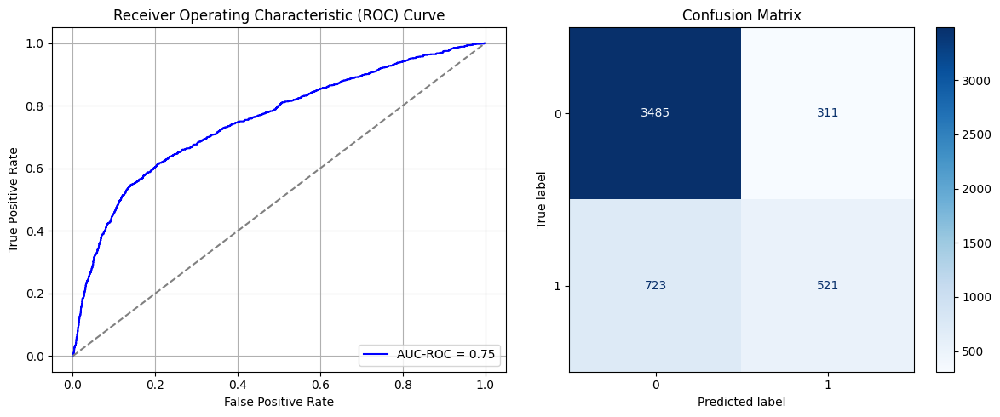

Best threshold based on F1-score: 0.9545816779136658
False Negative Rate: 0.5811897106109325
Time elapsed (performance): 0.7039418160002242
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5908 - loss: 0.5298 - val_AUC: 0.7282 - val_loss: 0.4675
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7318 - loss: 0.4525 - val_AUC: 0.7444 - val_loss: 0.4526
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7345 - loss: 0.4528 - val_AUC: 0.7425 - val_loss: 0.4631
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7484 - loss: 0.4403 - val_AUC: 0.7599 - val_loss: 0.4461
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7397 - loss: 0.4455 - val_AUC: 0.7626 - val_loss: 0.4451
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7615 - loss: 0.4387 - val_AUC: 0.7708 - val_loss: 0.4422
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7605 - loss: 0.4422 - val_AUC: 0.7691 - val_loss: 0.4413
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7673 - loss: 0.4304 - val_AUC: 0.7749 - val_loss: 0.4390
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7727 -

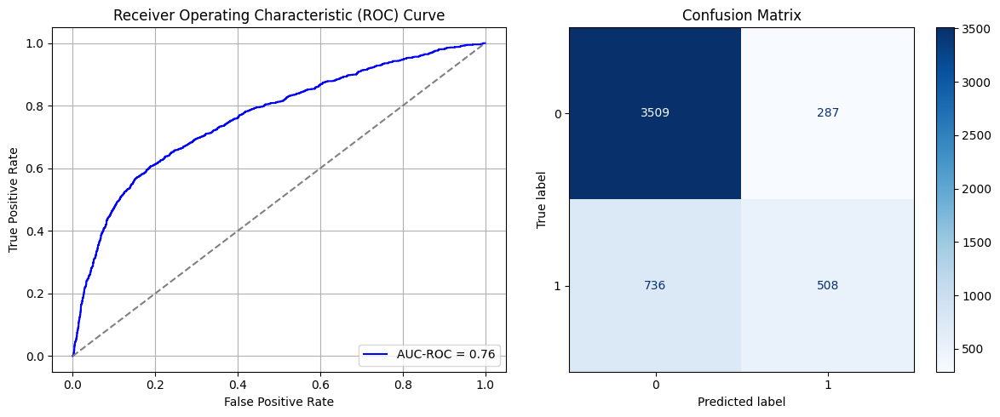

Best threshold based on F1-score: 0.9741784334182739
False Negative Rate: 0.5916398713826366
Time elapsed (performance): 0.7187428409997665
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5979 - loss: 0.5168 - val_AUC: 0.7316 - val_loss: 0.4643
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7278 - loss: 0.4578 - val_AUC: 0.7455 - val_loss: 0.4519
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7575 - loss: 0.4344 - val_AUC: 0.7533 - val_loss: 0.4542
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7504 - loss: 0.4475 - val_AUC: 0.7596 - val_loss: 0.4452
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7638 - loss: 0.4292 - val_AUC: 0.7693 - val_loss: 0.4413
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7620 - loss: 0.4355 - val_AUC: 0.7693 - val_loss: 0.4433
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7658 - loss: 0.4295 - val_AUC: 0.7677 - val_loss: 0.4408
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7698 - loss: 0.4204 - val_AUC: 0.7791 - val_loss: 0.4415
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7833 -

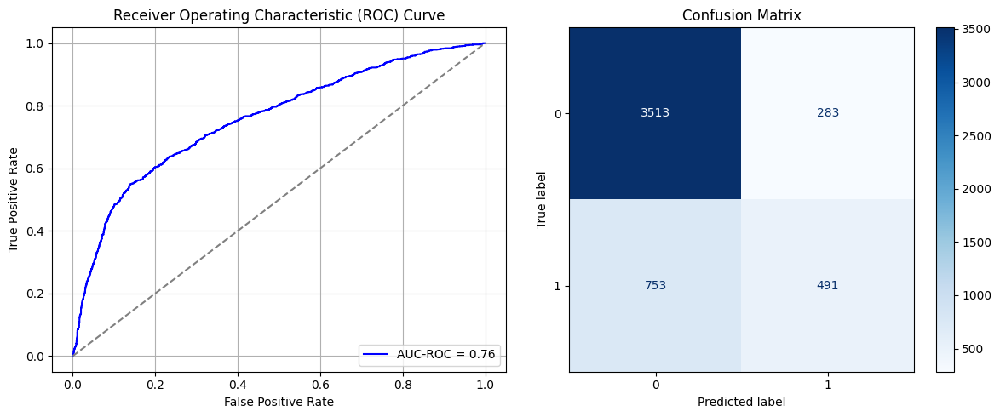

Best threshold based on F1-score: 0.9310383200645447
False Negative Rate: 0.6053054662379421
Time elapsed (performance): 0.6859704849994159
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5844 - loss: 0.5265 - val_AUC: 0.7322 - val_loss: 0.4662
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7357 - loss: 0.4519 - val_AUC: 0.7498 - val_loss: 0.4522
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7372 - loss: 0.4448 - val_AUC: 0.7536 - val_loss: 0.4480
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7474 - loss: 0.4408 - val_AUC: 0.7588 - val_loss: 0.4462
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7615 - loss: 0.4330 - val_AUC: 0.7648 - val_loss: 0.4437
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7647 - loss: 0.4306 - val_AUC: 0.7677 - val_loss: 0.4418
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7616 - loss: 0.4367 - val_AUC: 0.7687 - val_loss: 0.4418
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7691 - loss: 0.4241 - val_AUC: 0.7721 - val_loss: 0.4390
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7650 -

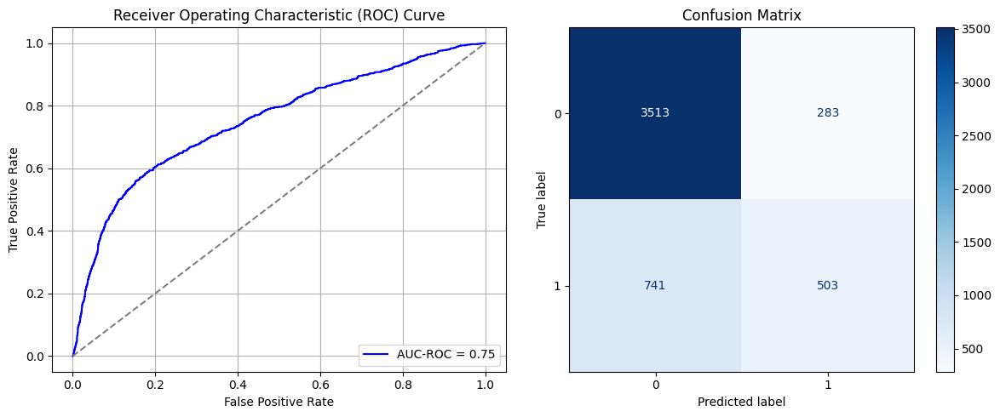

Best threshold based on F1-score: 0.9046976566314697
False Negative Rate: 0.5956591639871383
Time elapsed (performance): 0.7344623720000527
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6282 - loss: 0.5200 - val_AUC: 0.7203 - val_loss: 0.4644
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7209 - loss: 0.4485 - val_AUC: 0.7389 - val_loss: 0.4550
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7357 - loss: 0.4475 - val_AUC: 0.7464 - val_loss: 0.4522
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7389 - loss: 0.4467 - val_AUC: 0.7547 - val_loss: 0.4491
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7514 - loss: 0.4349 - val_AUC: 0.7538 - val_loss: 0.4468
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7491 - loss: 0.4394 - val_AUC: 0.7632 - val_loss: 0.4435
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7505 - loss: 0.4345 - val_AUC: 0.7646 - val_loss: 0.4446
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7497 - loss: 0.4366 - val_AUC: 0.7618 - val_loss: 0.4444
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7763 -

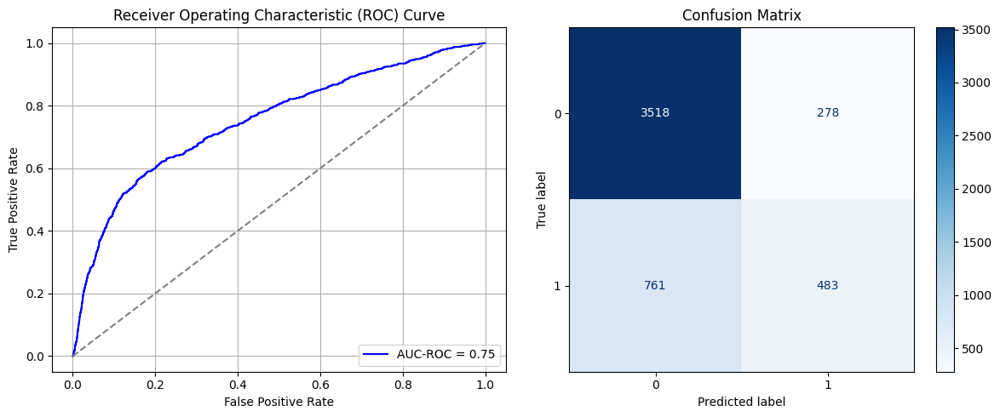

Best threshold based on F1-score: 0.9155663251876831
False Negative Rate: 0.6117363344051447
Time elapsed (performance): 0.8431506139986595
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6062 - loss: 0.5192 - val_AUC: 0.7219 - val_loss: 0.4698
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7273 - loss: 0.4563 - val_AUC: 0.7415 - val_loss: 0.4548
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7456 - loss: 0.4391 - val_AUC: 0.7567 - val_loss: 0.4492
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7397 - loss: 0.4407 - val_AUC: 0.7499 - val_loss: 0.4526
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7604 - loss: 0.4323 - val_AUC: 0.7664 - val_loss: 0.4412
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7665 - loss: 0.4322 - val_AUC: 0.7693 - val_loss: 0.4424
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7564 - loss: 0.4376 - val_AUC: 0.7741 - val_loss: 0.4373
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7687 - loss: 0.4334 - val_AUC: 0.7728 - val_loss: 0.4408
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7623 -

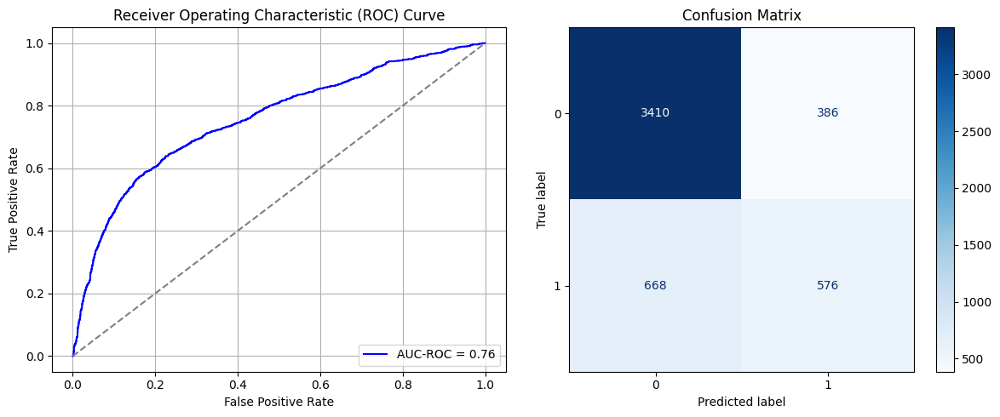

Best threshold based on F1-score: 0.3369061350822449
False Negative Rate: 0.5369774919614148
Time elapsed (performance): 1.235282678000658
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6068 - loss: 0.5287 - val_AUC: 0.7223 - val_loss: 0.4673
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7284 - loss: 0.4575 - val_AUC: 0.7396 - val_loss: 0.4574
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7443 - loss: 0.4459 - val_AUC: 0.7546 - val_loss: 0.4498
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7407 - loss: 0.4373 - val_AUC: 0.7585 - val_loss: 0.4588
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7550 - loss: 0.4428 - val_AUC: 0.7683 - val_loss: 0.4426
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7546 - loss: 0.4375 - val_AUC: 0.7694 - val_loss: 0.4399
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7661 - loss: 0.4256 - val_AUC: 0.7718 - val_loss: 0.4390
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7674 - loss: 0.4303 - val_AUC: 0.7749 - val_loss: 0.4370
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7691 -

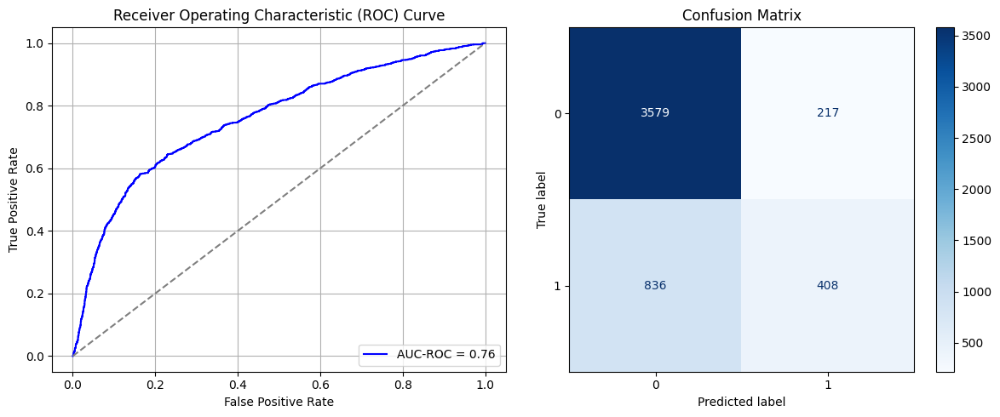

Best threshold based on F1-score: 0.8711498379707336
False Negative Rate: 0.6720257234726688
Time elapsed (performance): 1.1337966549999692
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6284 - loss: 0.5138 - val_AUC: 0.7268 - val_loss: 0.4629
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7251 - loss: 0.4551 - val_AUC: 0.7476 - val_loss: 0.4559
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7377 - loss: 0.4492 - val_AUC: 0.7566 - val_loss: 0.4478
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7440 - loss: 0.4363 - val_AUC: 0.7575 - val_loss: 0.4510
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7507 - loss: 0.4422 - val_AUC: 0.7648 - val_loss: 0.4479
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7651 - loss: 0.4337 - val_AUC: 0.7688 - val_loss: 0.4446
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7560 - loss: 0.4390 - val_AUC: 0.7696 - val_loss: 0.4450
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7649 - loss: 0.4301 - val_AUC: 0.7734 - val_loss: 0.4380
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7653 -

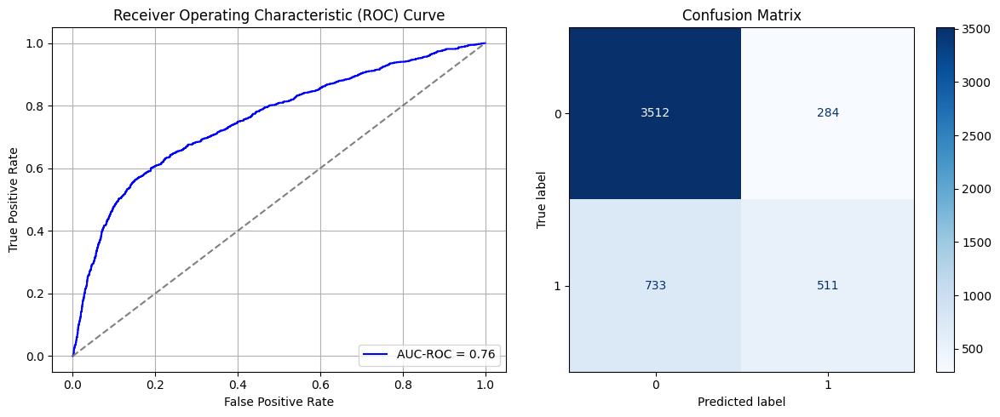

Best threshold based on F1-score: 0.9216389060020447
False Negative Rate: 0.5892282958199357
Time elapsed (performance): 0.714816666999468
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6242 - loss: 0.5245 - val_AUC: 0.7176 - val_loss: 0.4678
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7233 - loss: 0.4554 - val_AUC: 0.7443 - val_loss: 0.4616
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7352 - loss: 0.4398 - val_AUC: 0.7479 - val_loss: 0.4510
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7473 - loss: 0.4412 - val_AUC: 0.7540 - val_loss: 0.4476
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7503 - loss: 0.4356 - val_AUC: 0.7644 - val_loss: 0.4468
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7512 - loss: 0.4435 - val_AUC: 0.7680 - val_loss: 0.4414
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7624 - loss: 0.4364 - val_AUC: 0.7736 - val_loss: 0.4385
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7587 - loss: 0.4404 - val_AUC: 0.7760 - val_loss: 0.4388
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7730 -

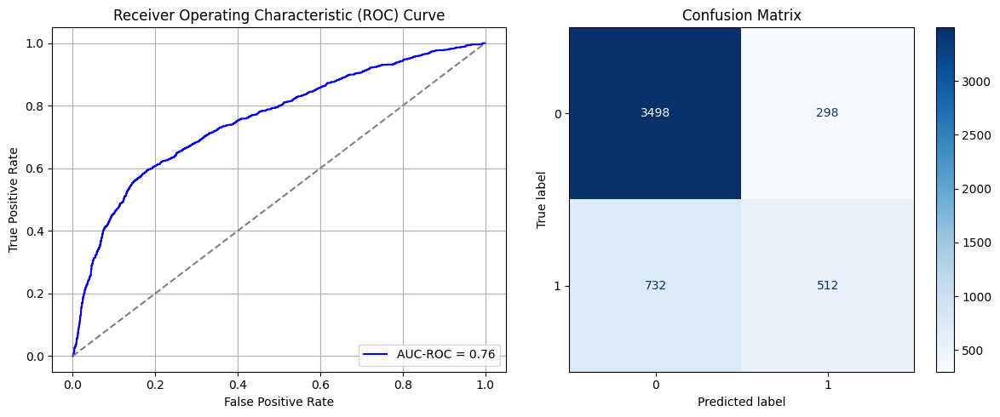

Best threshold based on F1-score: 0.9248278737068176
False Negative Rate: 0.5884244372990354
Time elapsed (performance): 0.691746440001225
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6040 - loss: 0.5239 - val_AUC: 0.7230 - val_loss: 0.4654
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7282 - loss: 0.4614 - val_AUC: 0.7405 - val_loss: 0.4550
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7445 - loss: 0.4434 - val_AUC: 0.7522 - val_loss: 0.4505
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7438 - loss: 0.4461 - val_AUC: 0.7569 - val_loss: 0.4498
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7550 - loss: 0.4374 - val_AUC: 0.7642 - val_loss: 0.4474
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7521 - loss: 0.4331 - val_AUC: 0.7633 - val_loss: 0.4428
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7599 - loss: 0.4336 - val_AUC: 0.7722 - val_loss: 0.4403
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7705 - loss: 0.4286 - val_AUC: 0.7748 - val_loss: 0.4393
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7728 -

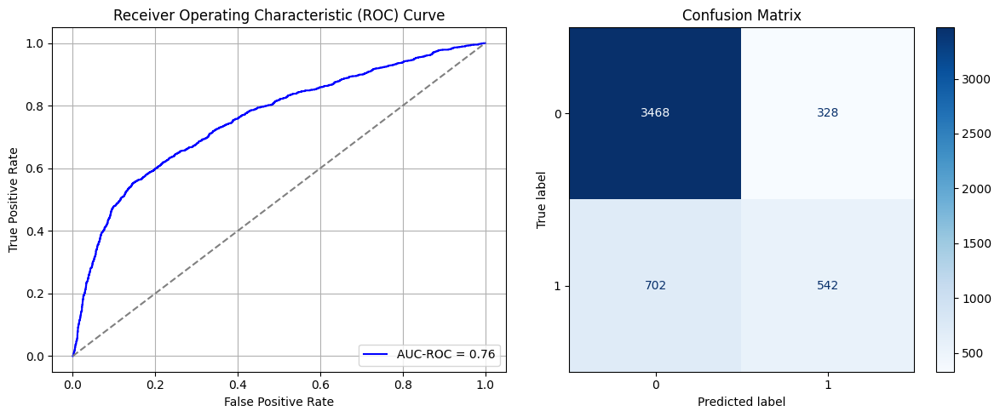

Best threshold based on F1-score: 0.9448038339614868
False Negative Rate: 0.5643086816720257
Time elapsed (performance): 0.7171070110016444
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.5948 - loss: 0.5204 - val_AUC: 0.7293 - val_loss: 0.4610
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7239 - loss: 0.4599 - val_AUC: 0.7496 - val_loss: 0.4514
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7487 - loss: 0.4425 - val_AUC: 0.7523 - val_loss: 0.4507
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7396 - loss: 0.4479 - val_AUC: 0.7592 - val_loss: 0.4462
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7533 - loss: 0.4413 - val_AUC: 0.7642 - val_loss: 0.4443
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7525 - loss: 0.4397 - val_AUC: 0.7697 - val_loss: 0.4423
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7648 - loss: 0.4340 - val_AUC: 0.7702 - val_loss: 0.4435
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7731 - loss: 0.4288 - val_AUC: 0.7739 - val_loss: 0.4447
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7670 -

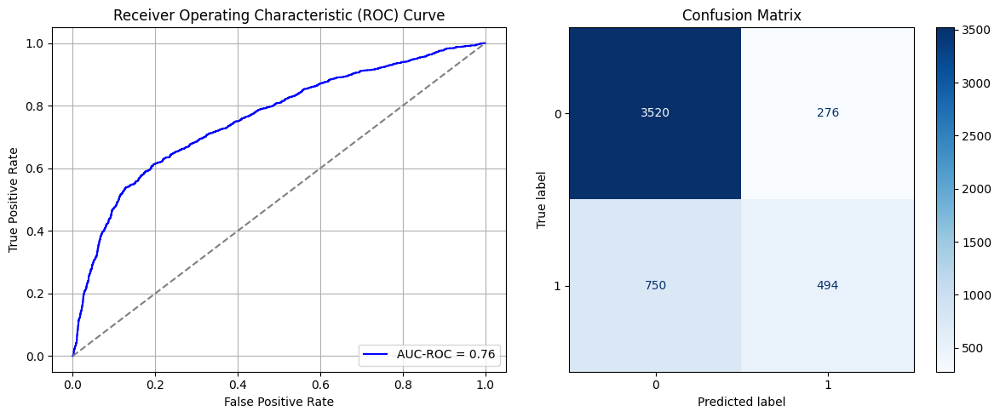

Best threshold based on F1-score: 0.964005708694458
False Negative Rate: 0.6028938906752411
Time elapsed (performance): 0.7453759180007182
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6151 - loss: 0.5219 - val_AUC: 0.7366 - val_loss: 0.4627
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7320 - loss: 0.4552 - val_AUC: 0.7511 - val_loss: 0.4559
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7411 - loss: 0.4490 - val_AUC: 0.7608 - val_loss: 0.4499
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7509 - loss: 0.4385 - val_AUC: 0.7660 - val_loss: 0.4471
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7589 - loss: 0.4322 - val_AUC: 0.7722 - val_loss: 0.4441
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7570 - loss: 0.4318 - val_AUC: 0.7732 - val_loss: 0.4409
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7700 - loss: 0.4233 - val_AUC: 0.7664 - val_loss: 0.4418
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7668 - loss: 0.4351 - val_AUC: 0.7793 - val_loss: 0.4348
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7734 -

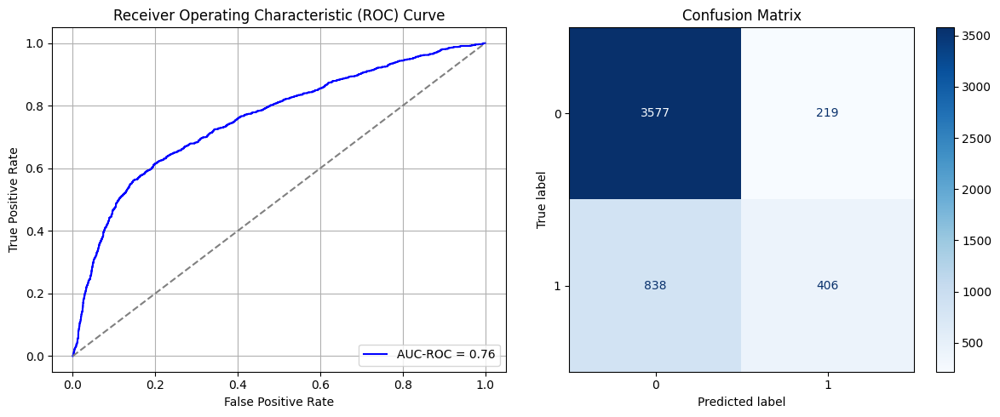

Best threshold based on F1-score: 0.8613739013671875
False Negative Rate: 0.6736334405144695
Time elapsed (performance): 0.6970010719996935
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6114 - loss: 0.5255 - val_AUC: 0.7318 - val_loss: 0.4628
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7531 - loss: 0.4423 - val_AUC: 0.7497 - val_loss: 0.4516
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7374 - loss: 0.4428 - val_AUC: 0.7550 - val_loss: 0.4474
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7507 - loss: 0.4364 - val_AUC: 0.7595 - val_loss: 0.4451
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7547 - loss: 0.4379 - val_AUC: 0.7657 - val_loss: 0.4429
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7585 - loss: 0.4375 - val_AUC: 0.7728 - val_loss: 0.4457
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7641 - loss: 0.4315 - val_AUC: 0.7757 - val_loss: 0.4377
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7550 - loss: 0.4369 - val_AUC: 0.7763 - val_loss: 0.4371
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7672 -

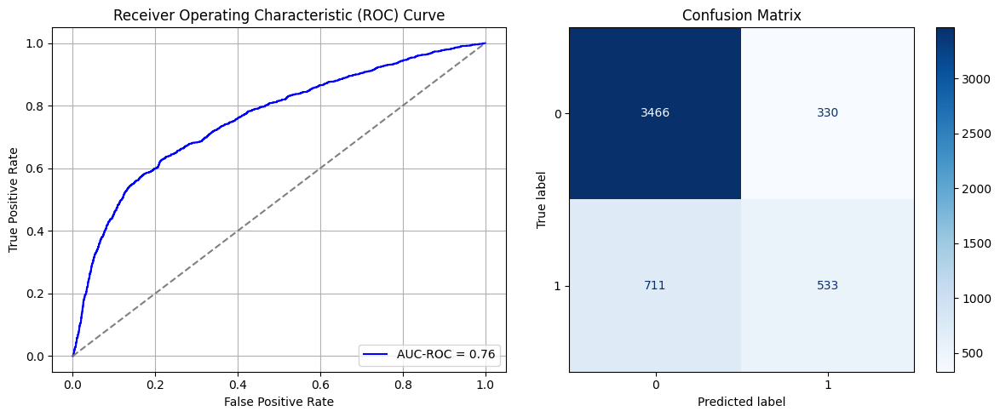

Best threshold based on F1-score: 0.9158825874328613
False Negative Rate: 0.5715434083601286
Time elapsed (performance): 0.7107125669990637
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6221 - loss: 0.5186 - val_AUC: 0.7214 - val_loss: 0.4659
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7275 - loss: 0.4569 - val_AUC: 0.7416 - val_loss: 0.4584
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7457 - loss: 0.4445 - val_AUC: 0.7512 - val_loss: 0.4491
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7541 - loss: 0.4327 - val_AUC: 0.7581 - val_loss: 0.4482
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7555 - loss: 0.4362 - val_AUC: 0.7635 - val_loss: 0.4466
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7595 - loss: 0.4394 - val_AUC: 0.7684 - val_loss: 0.4443
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7543 - loss: 0.4371 - val_AUC: 0.7695 - val_loss: 0.4408
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7608 - loss: 0.4378 - val_AUC: 0.7703 - val_loss: 0.4425
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7673 -

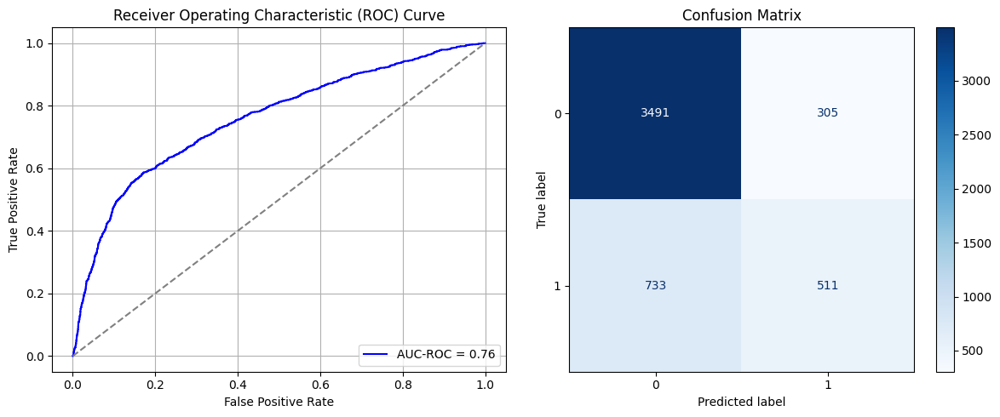

Best threshold based on F1-score: 0.9163907766342163
False Negative Rate: 0.5892282958199357
Time elapsed (performance): 0.7313095030003751
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6205 - loss: 0.5243 - val_AUC: 0.7302 - val_loss: 0.4603
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7349 - loss: 0.4385 - val_AUC: 0.7532 - val_loss: 0.4496
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7384 - loss: 0.4494 - val_AUC: 0.7619 - val_loss: 0.4480
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7478 - loss: 0.4386 - val_AUC: 0.7657 - val_loss: 0.4439
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7559 - loss: 0.4387 - val_AUC: 0.7650 - val_loss: 0.4473
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7511 - loss: 0.4388 - val_AUC: 0.7677 - val_loss: 0.4551
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7631 - loss: 0.4347 - val_AUC: 0.7737 - val_loss: 0.4544
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7701 - loss: 0.4339 - val_AUC: 0.7731 - val_loss: 0.4394
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7678 -

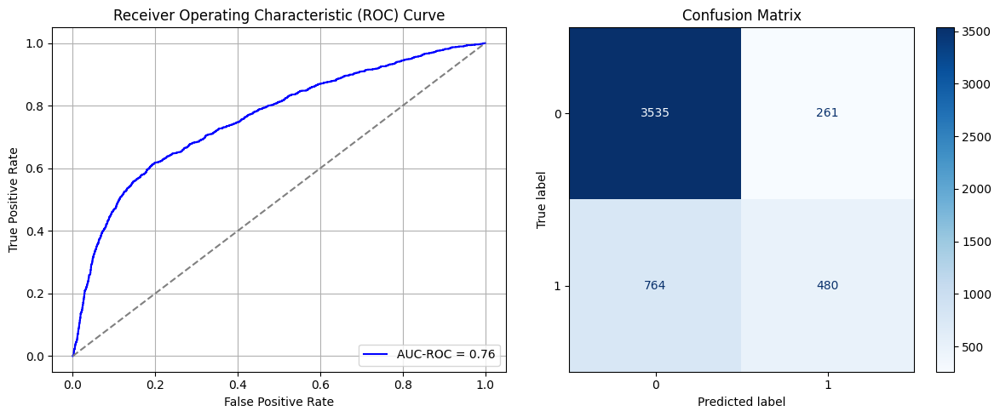

Best threshold based on F1-score: 0.9384245276451111
False Negative Rate: 0.6141479099678456
Time elapsed (performance): 0.7223195699989446
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6171 - loss: 0.5042 - val_AUC: 0.7303 - val_loss: 0.4618
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7340 - loss: 0.4481 - val_AUC: 0.7470 - val_loss: 0.4593
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7393 - loss: 0.4460 - val_AUC: 0.7520 - val_loss: 0.4495
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7530 - loss: 0.4394 - val_AUC: 0.7630 - val_loss: 0.4518
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7506 - loss: 0.4453 - val_AUC: 0.7630 - val_loss: 0.4427
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7543 - loss: 0.4356 - val_AUC: 0.7665 - val_loss: 0.4425
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7653 - loss: 0.4344 - val_AUC: 0.7704 - val_loss: 0.4394
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7638 - loss: 0.4430 - val_AUC: 0.7751 - val_loss: 0.4413
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7648 -

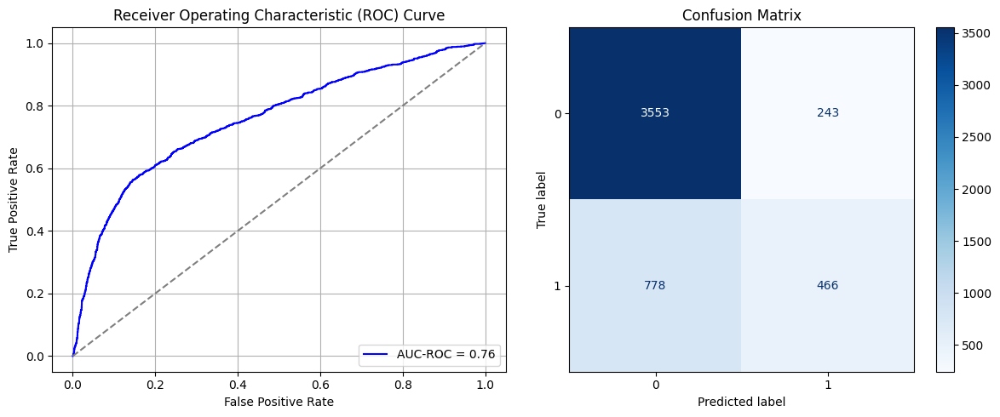

Best threshold based on F1-score: 0.9138487577438354
False Negative Rate: 0.6254019292604501
Time elapsed (performance): 0.7285180849994504
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6068 - loss: 0.5217 - val_AUC: 0.7277 - val_loss: 0.4614
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7277 - loss: 0.4466 - val_AUC: 0.7472 - val_loss: 0.4527
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7447 - loss: 0.4397 - val_AUC: 0.7538 - val_loss: 0.4483
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7519 - loss: 0.4395 - val_AUC: 0.7602 - val_loss: 0.4467
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7642 - loss: 0.4297 - val_AUC: 0.7620 - val_loss: 0.4433
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7632 - loss: 0.4311 - val_AUC: 0.7677 - val_loss: 0.4477
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7541 - loss: 0.4422 - val_AUC: 0.7679 - val_loss: 0.4451
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7697 - loss: 0.4297 - val_AUC: 0.7719 - val_loss: 0.4385
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7681 -

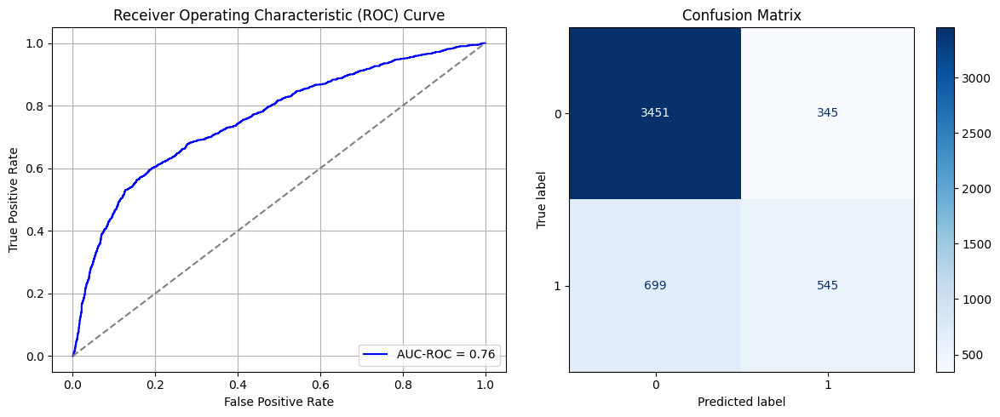

Best threshold based on F1-score: 0.9549059271812439
False Negative Rate: 0.5618971061093248
Time elapsed (performance): 0.7291366400004335
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6098 - loss: 0.5194 - val_AUC: 0.7243 - val_loss: 0.4641
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7265 - loss: 0.4577 - val_AUC: 0.7474 - val_loss: 0.4544
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7411 - loss: 0.4432 - val_AUC: 0.7534 - val_loss: 0.4483
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7478 - loss: 0.4429 - val_AUC: 0.7634 - val_loss: 0.4450
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7510 - loss: 0.4370 - val_AUC: 0.7642 - val_loss: 0.4499
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7675 - loss: 0.4298 - val_AUC: 0.7710 - val_loss: 0.4406
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7783 - loss: 0.4208 - val_AUC: 0.7717 - val_loss: 0.4409
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7717 - loss: 0.4209 - val_AUC: 0.7732 - val_loss: 0.4440
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7720 -

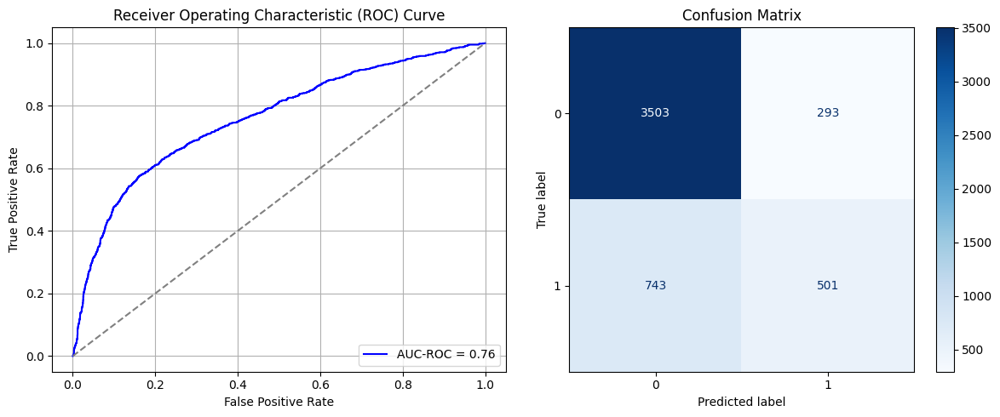

Best threshold based on F1-score: 0.9071275591850281
False Negative Rate: 0.5972668810289389
Time elapsed (performance): 0.7419069229999877
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6182 - loss: 0.5164 - val_AUC: 0.7249 - val_loss: 0.4638
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7237 - loss: 0.4566 - val_AUC: 0.7493 - val_loss: 0.4601
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7375 - loss: 0.4441 - val_AUC: 0.7575 - val_loss: 0.4478
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7515 - loss: 0.4379 - val_AUC: 0.7581 - val_loss: 0.4460
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7493 - loss: 0.4486 - val_AUC: 0.7636 - val_loss: 0.4442
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7630 - loss: 0.4312 - val_AUC: 0.7683 - val_loss: 0.4412
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7639 - loss: 0.4363 - val_AUC: 0.7734 - val_loss: 0.4385
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7670 - loss: 0.4285 - val_AUC: 0.7678 - val_loss: 0.4452
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7705 -

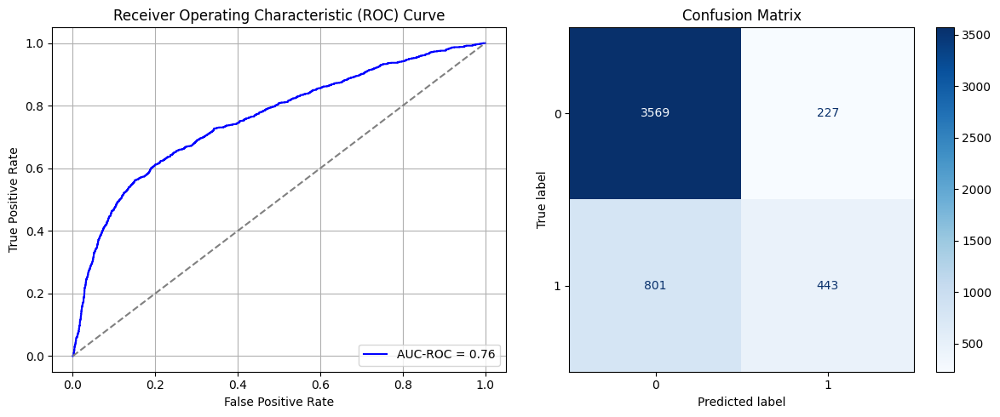

Best threshold based on F1-score: 0.9130634069442749
False Negative Rate: 0.6438906752411575
Time elapsed (performance): 0.9908801259989559
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6008 - loss: 0.5266 - val_AUC: 0.7228 - val_loss: 0.4645
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7318 - loss: 0.4465 - val_AUC: 0.7518 - val_loss: 0.4510
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7475 - loss: 0.4434 - val_AUC: 0.7589 - val_loss: 0.4486
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7539 - loss: 0.4365 - val_AUC: 0.7495 - val_loss: 0.4501
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7608 - loss: 0.4401 - val_AUC: 0.7637 - val_loss: 0.4444
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7603 - loss: 0.4385 - val_AUC: 0.7652 - val_loss: 0.4450
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7691 - loss: 0.4243 - val_AUC: 0.7720 - val_loss: 0.4396
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7697 - loss: 0.4364 - val_AUC: 0.7741 - val_loss: 0.4448
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7687 -

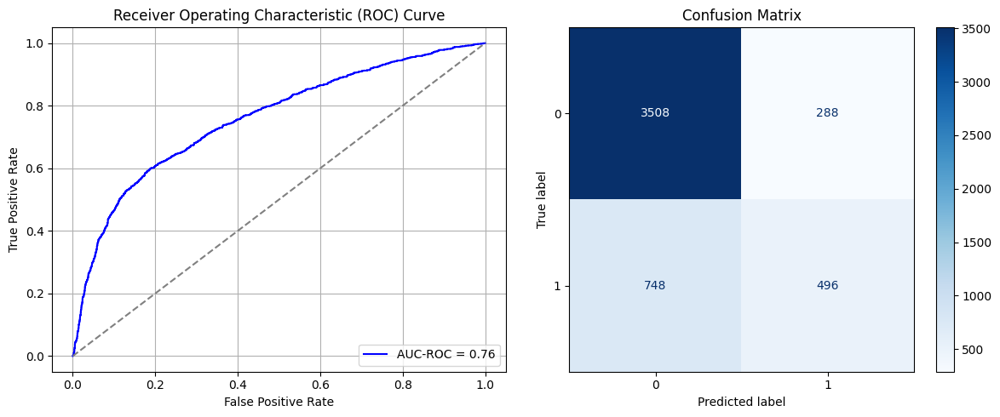

Best threshold based on F1-score: 0.9734215140342712
False Negative Rate: 0.6012861736334405
Time elapsed (performance): 0.9885401209994598
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6370 - loss: 0.5137 - val_AUC: 0.7223 - val_loss: 0.4679
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7252 - loss: 0.4488 - val_AUC: 0.7463 - val_loss: 0.4521
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7403 - loss: 0.4389 - val_AUC: 0.7501 - val_loss: 0.4509
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7397 - loss: 0.4485 - val_AUC: 0.7589 - val_loss: 0.4477
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7531 - loss: 0.4329 - val_AUC: 0.7623 - val_loss: 0.4462
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7548 - loss: 0.4379 - val_AUC: 0.7643 - val_loss: 0.4443
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7585 - loss: 0.4332 - val_AUC: 0.7708 - val_loss: 0.4440
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7703 - loss: 0.4264 - val_AUC: 0.7726 - val_loss: 0.4440
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7675 -

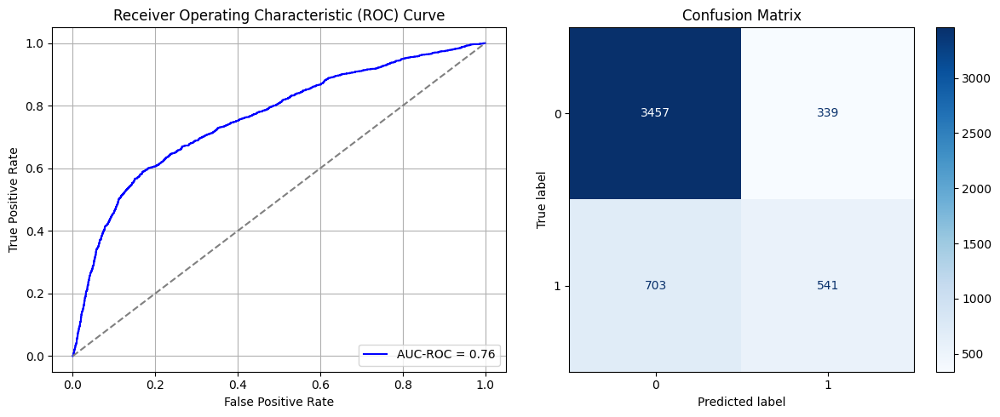

Best threshold based on F1-score: 0.9276614189147949
False Negative Rate: 0.565112540192926
Time elapsed (performance): 0.7395965609994164
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5951 - loss: 0.5406 - val_AUC: 0.7218 - val_loss: 0.4680
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7238 - loss: 0.4592 - val_AUC: 0.7428 - val_loss: 0.4551
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7321 - loss: 0.4487 - val_AUC: 0.7525 - val_loss: 0.4550
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7472 - loss: 0.4384 - val_AUC: 0.7578 - val_loss: 0.4474
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7592 - loss: 0.4326 - val_AUC: 0.7611 - val_loss: 0.4473
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7520 - loss: 0.4385 - val_AUC: 0.7546 - val_loss: 0.4466
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7622 - loss: 0.4350 - val_AUC: 0.7659 - val_loss: 0.4434
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7660 - loss: 0.4316 - val_AUC: 0.7671 - val_loss: 0.4417
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7734 -

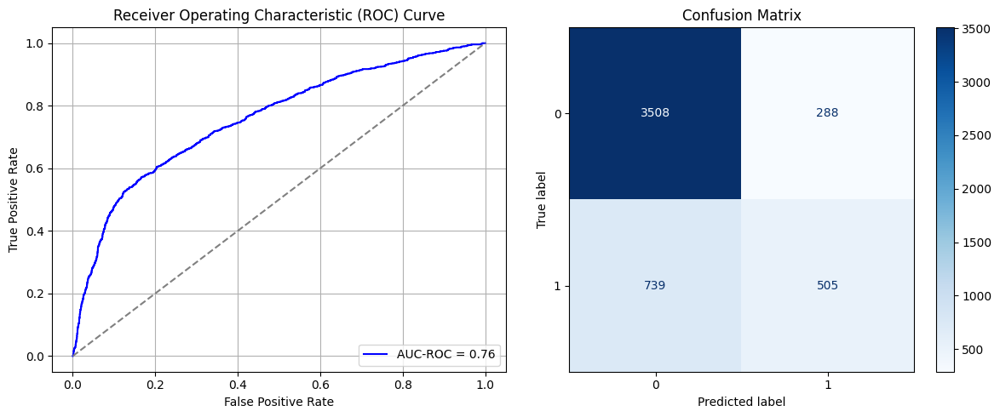

Best threshold based on F1-score: 0.931113064289093
False Negative Rate: 0.5940514469453376
Time elapsed (performance): 0.7603751990009187
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6262 - loss: 0.5097 - val_AUC: 0.7257 - val_loss: 0.4679
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7372 - loss: 0.4545 - val_AUC: 0.7466 - val_loss: 0.4519
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7470 - loss: 0.4426 - val_AUC: 0.7480 - val_loss: 0.4530
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7458 - loss: 0.4392 - val_AUC: 0.7623 - val_loss: 0.4457
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7574 - loss: 0.4383 - val_AUC: 0.7629 - val_loss: 0.4439
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7486 - loss: 0.4364 - val_AUC: 0.7693 - val_loss: 0.4426
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7493 - loss: 0.4469 - val_AUC: 0.7687 - val_loss: 0.4425
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7642 - loss: 0.4308 - val_AUC: 0.7741 - val_loss: 0.4377
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7691 -

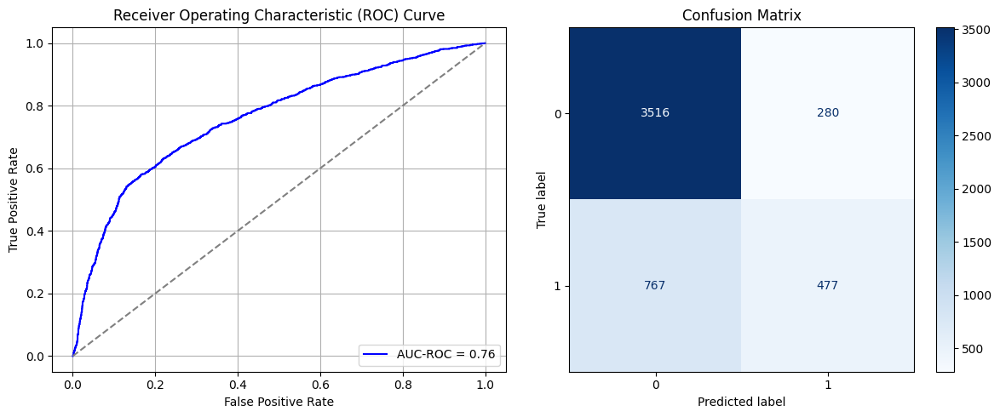

Best threshold based on F1-score: 0.9056222438812256
False Negative Rate: 0.6165594855305466
Time elapsed (performance): 0.7378941980005038
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6044 - loss: 0.5204 - val_AUC: 0.7236 - val_loss: 0.4637
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7311 - loss: 0.4508 - val_AUC: 0.7454 - val_loss: 0.4529
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7410 - loss: 0.4406 - val_AUC: 0.7519 - val_loss: 0.4547
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7503 - loss: 0.4529 - val_AUC: 0.7568 - val_loss: 0.4485
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7499 - loss: 0.4387 - val_AUC: 0.7575 - val_loss: 0.4537
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7523 - loss: 0.4443 - val_AUC: 0.7711 - val_loss: 0.4421
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7629 - loss: 0.4329 - val_AUC: 0.7649 - val_loss: 0.4477
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7663 - loss: 0.4264 - val_AUC: 0.7739 - val_loss: 0.4390
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7619 -

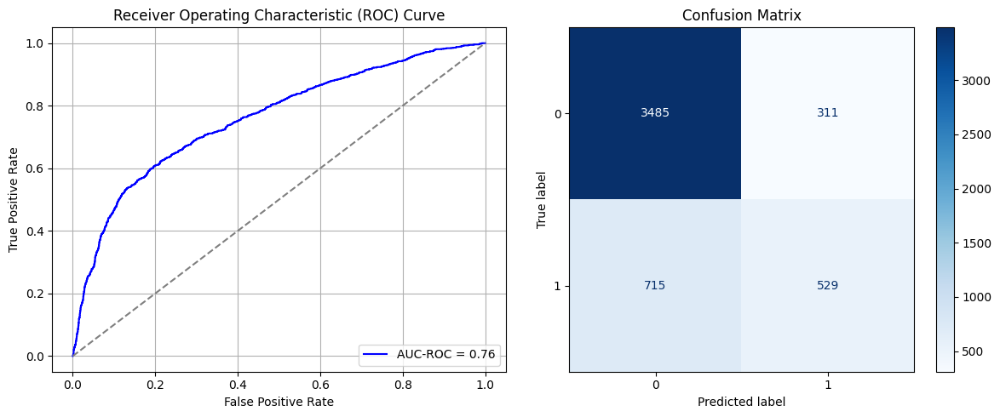

Best threshold based on F1-score: 0.9364454746246338
False Negative Rate: 0.5747588424437299
Time elapsed (performance): 0.7279389739996986
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5974 - loss: 0.5338 - val_AUC: 0.7244 - val_loss: 0.4633
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7300 - loss: 0.4524 - val_AUC: 0.7458 - val_loss: 0.4568
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7353 - loss: 0.4478 - val_AUC: 0.7546 - val_loss: 0.4538
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7520 - loss: 0.4378 - val_AUC: 0.7614 - val_loss: 0.4482
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7520 - loss: 0.4362 - val_AUC: 0.7652 - val_loss: 0.4462
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7643 - loss: 0.4352 - val_AUC: 0.7557 - val_loss: 0.4465
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7562 - loss: 0.4341 - val_AUC: 0.7684 - val_loss: 0.4424
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7667 - loss: 0.4313 - val_AUC: 0.7714 - val_loss: 0.4408
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7682 -

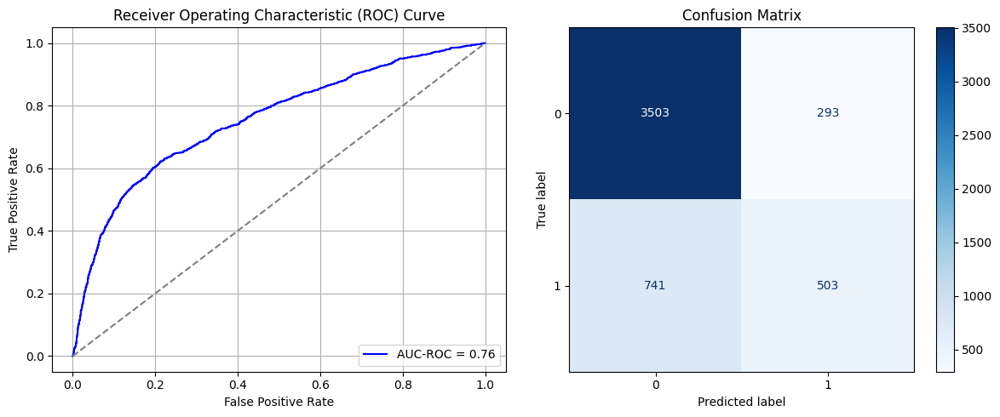

Best threshold based on F1-score: 0.9349678754806519
False Negative Rate: 0.5956591639871383
Time elapsed (performance): 0.7355583680000564
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5948 - loss: 0.5214 - val_AUC: 0.7260 - val_loss: 0.4640
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7322 - loss: 0.4511 - val_AUC: 0.7453 - val_loss: 0.4528
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7428 - loss: 0.4444 - val_AUC: 0.7557 - val_loss: 0.4498
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7433 - loss: 0.4483 - val_AUC: 0.7618 - val_loss: 0.4444
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7533 - loss: 0.4432 - val_AUC: 0.7645 - val_loss: 0.4428
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7509 - loss: 0.4380 - val_AUC: 0.7648 - val_loss: 0.4457
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7598 - loss: 0.4378 - val_AUC: 0.7688 - val_loss: 0.4442
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7688 - loss: 0.4282 - val_AUC: 0.7689 - val_loss: 0.4405
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7697 -

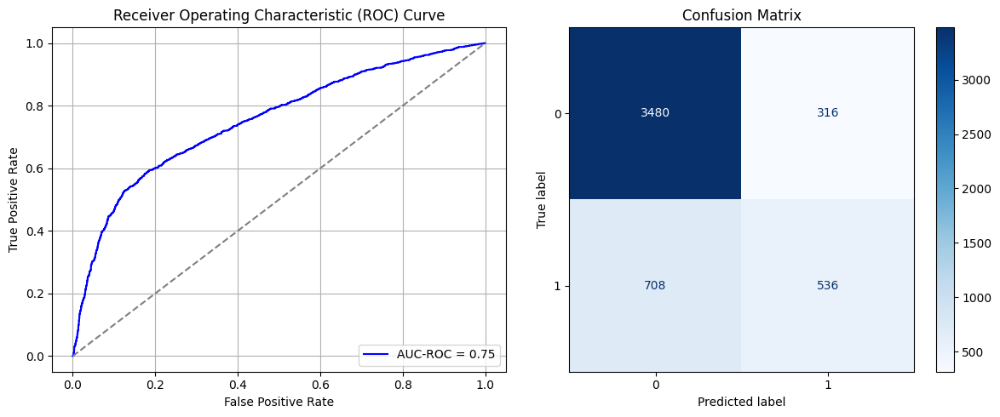

Best threshold based on F1-score: 0.9704257249832153
False Negative Rate: 0.5691318327974276
Time elapsed (performance): 0.7452599429998372
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6171 - loss: 0.5132 - val_AUC: 0.7287 - val_loss: 0.4631
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7353 - loss: 0.4493 - val_AUC: 0.7511 - val_loss: 0.4512
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7373 - loss: 0.4465 - val_AUC: 0.7505 - val_loss: 0.4504
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7542 - loss: 0.4354 - val_AUC: 0.7575 - val_loss: 0.4458
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7481 - loss: 0.4473 - val_AUC: 0.7514 - val_loss: 0.4525
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7538 - loss: 0.4418 - val_AUC: 0.7662 - val_loss: 0.4423
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7642 - loss: 0.4307 - val_AUC: 0.7737 - val_loss: 0.4407
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7663 - loss: 0.4363 - val_AUC: 0.7750 - val_loss: 0.4377
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7693 -

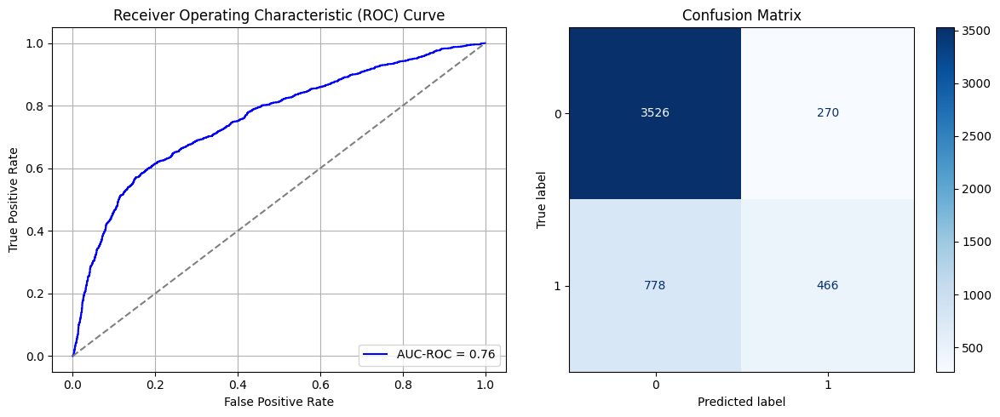

Best threshold based on F1-score: 0.9344684481620789
False Negative Rate: 0.6254019292604501
Time elapsed (performance): 0.7471953200001735
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5966 - loss: 0.5268 - val_AUC: 0.7229 - val_loss: 0.4757
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7286 - loss: 0.4524 - val_AUC: 0.7376 - val_loss: 0.4585
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7395 - loss: 0.4494 - val_AUC: 0.7554 - val_loss: 0.4487
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7371 - loss: 0.4481 - val_AUC: 0.7562 - val_loss: 0.4465
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7432 - loss: 0.4456 - val_AUC: 0.7632 - val_loss: 0.4446
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7589 - loss: 0.4309 - val_AUC: 0.7682 - val_loss: 0.4430
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7629 - loss: 0.4339 - val_AUC: 0.7688 - val_loss: 0.4414
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7638 - loss: 0.4345 - val_AUC: 0.7721 - val_loss: 0.4435
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7702 -

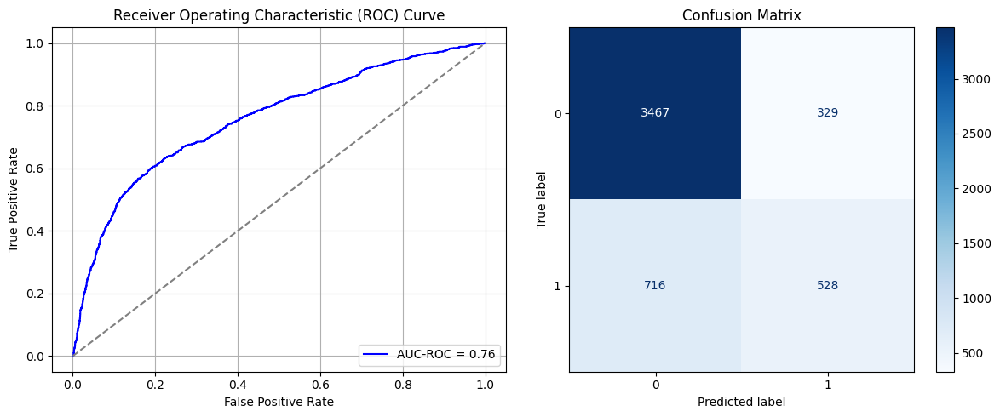

Best threshold based on F1-score: 0.9428377747535706
False Negative Rate: 0.5755627009646302
Time elapsed (performance): 1.484244844999921
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.5982 - loss: 0.5305 - val_AUC: 0.7280 - val_loss: 0.4618
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7224 - loss: 0.4531 - val_AUC: 0.7522 - val_loss: 0.4511
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7482 - loss: 0.4422 - val_AUC: 0.7597 - val_loss: 0.4469
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7517 - loss: 0.4339 - val_AUC: 0.7640 - val_loss: 0.4439
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7606 - loss: 0.4320 - val_AUC: 0.7653 - val_loss: 0.4471
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7633 - loss: 0.4309 - val_AUC: 0.7701 - val_loss: 0.4440
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7597 - loss: 0.4258 - val_AUC: 0.7723 - val_loss: 0.4404
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7685 - loss: 0.4273 - val_AUC: 0.7727 - val_loss: 0.4438
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7673 -

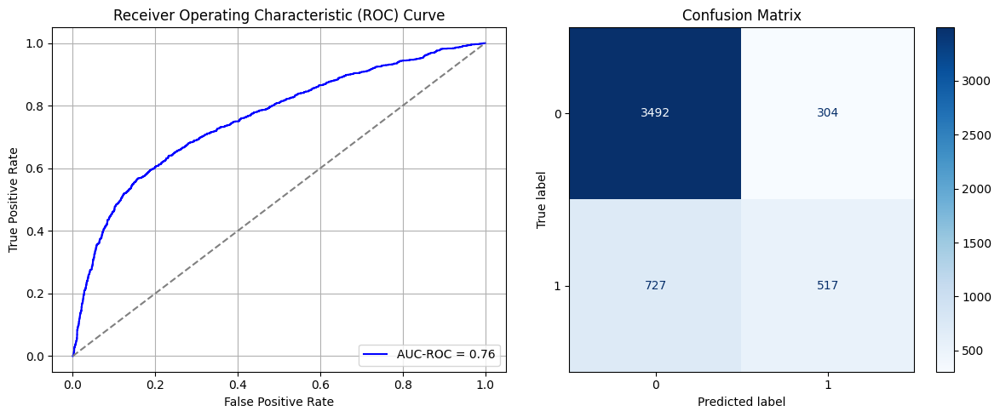

Best threshold based on F1-score: 0.9732993245124817
False Negative Rate: 0.5844051446945338
Time elapsed (performance): 0.7458935210015625
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6202 - loss: 0.5133 - val_AUC: 0.7333 - val_loss: 0.4631
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7333 - loss: 0.4607 - val_AUC: 0.7511 - val_loss: 0.4516
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7319 - loss: 0.4550 - val_AUC: 0.7591 - val_loss: 0.4557
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7418 - loss: 0.4479 - val_AUC: 0.7561 - val_loss: 0.4461
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7588 - loss: 0.4340 - val_AUC: 0.7669 - val_loss: 0.4521
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7498 - loss: 0.4362 - val_AUC: 0.7729 - val_loss: 0.4405
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7598 - loss: 0.4324 - val_AUC: 0.7770 - val_loss: 0.4364
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7713 - loss: 0.4276 - val_AUC: 0.7748 - val_loss: 0.4379
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7771 -

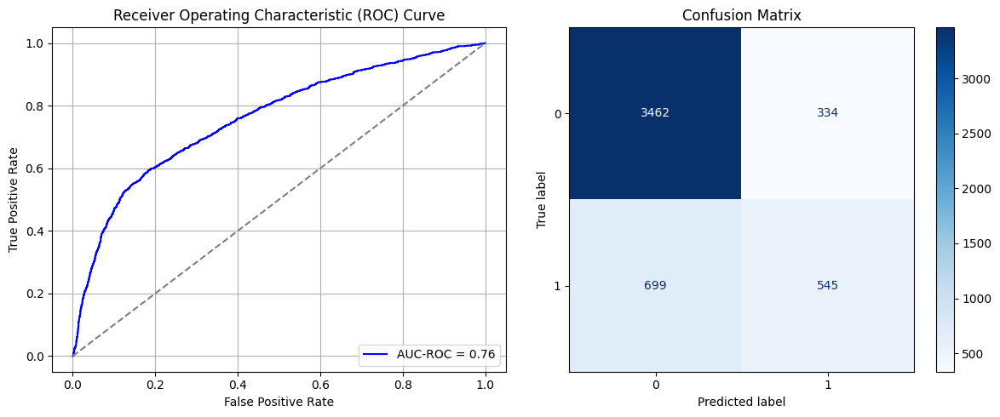

Best threshold based on F1-score: 0.879939615726471
False Negative Rate: 0.5618971061093248
Time elapsed (performance): 1.0728451719987788
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6049 - loss: 0.5100 - val_AUC: 0.7259 - val_loss: 0.4620
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7341 - loss: 0.4448 - val_AUC: 0.7476 - val_loss: 0.4531
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7461 - loss: 0.4394 - val_AUC: 0.7593 - val_loss: 0.4477
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7402 - loss: 0.4432 - val_AUC: 0.7632 - val_loss: 0.4458
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7511 - loss: 0.4400 - val_AUC: 0.7688 - val_loss: 0.4405
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7487 - loss: 0.4389 - val_AUC: 0.7647 - val_loss: 0.4451
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7613 - loss: 0.4294 - val_AUC: 0.7677 - val_loss: 0.4410
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7635 - loss: 0.4334 - val_AUC: 0.7718 - val_loss: 0.4378
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7690 -

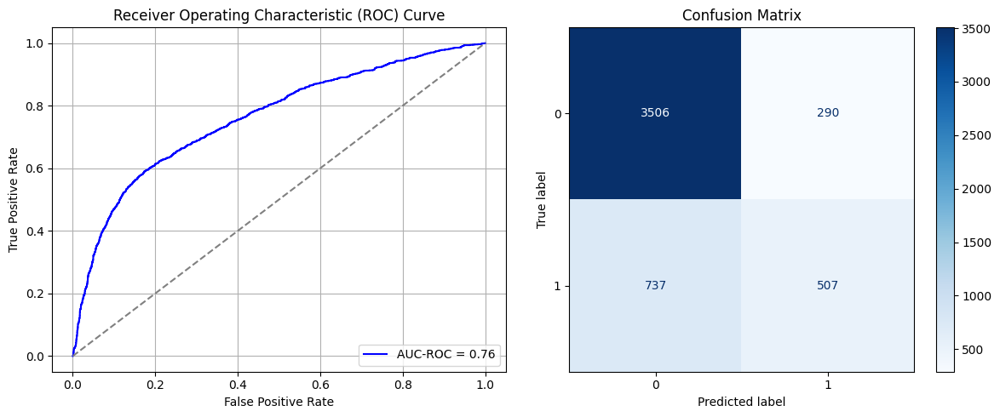

Best threshold based on F1-score: 0.9159736633300781
False Negative Rate: 0.592443729903537
Time elapsed (performance): 1.0921320819979883
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5994 - loss: 0.5218 - val_AUC: 0.7295 - val_loss: 0.4643
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7305 - loss: 0.4614 - val_AUC: 0.7566 - val_loss: 0.4494
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7505 - loss: 0.4370 - val_AUC: 0.7565 - val_loss: 0.4496
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7437 - loss: 0.4419 - val_AUC: 0.7682 - val_loss: 0.4425
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7530 - loss: 0.4407 - val_AUC: 0.7698 - val_loss: 0.4520
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7615 - loss: 0.4363 - val_AUC: 0.7702 - val_loss: 0.4444
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7676 - loss: 0.4330 - val_AUC: 0.7761 - val_loss: 0.4364
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7779 - loss: 0.4236 - val_AUC: 0.7779 - val_loss: 0.4353
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7684 -

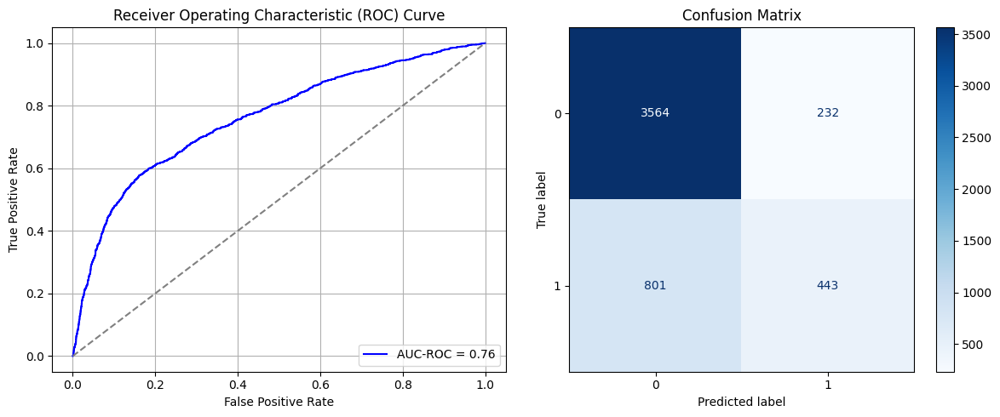

Best threshold based on F1-score: 0.8725496530532837
False Negative Rate: 0.6438906752411575
Time elapsed (performance): 1.3004425580002135
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6209 - loss: 0.5140 - val_AUC: 0.7300 - val_loss: 0.4602
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7275 - loss: 0.4512 - val_AUC: 0.7528 - val_loss: 0.4549
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7373 - loss: 0.4491 - val_AUC: 0.7619 - val_loss: 0.4505
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7604 - loss: 0.4343 - val_AUC: 0.7631 - val_loss: 0.4473
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7606 - loss: 0.4293 - val_AUC: 0.7714 - val_loss: 0.4456
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7593 - loss: 0.4419 - val_AUC: 0.7719 - val_loss: 0.4426
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7606 - loss: 0.4353 - val_AUC: 0.7727 - val_loss: 0.4411
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7731 - loss: 0.4214 - val_AUC: 0.7789 - val_loss: 0.4413
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7682 -

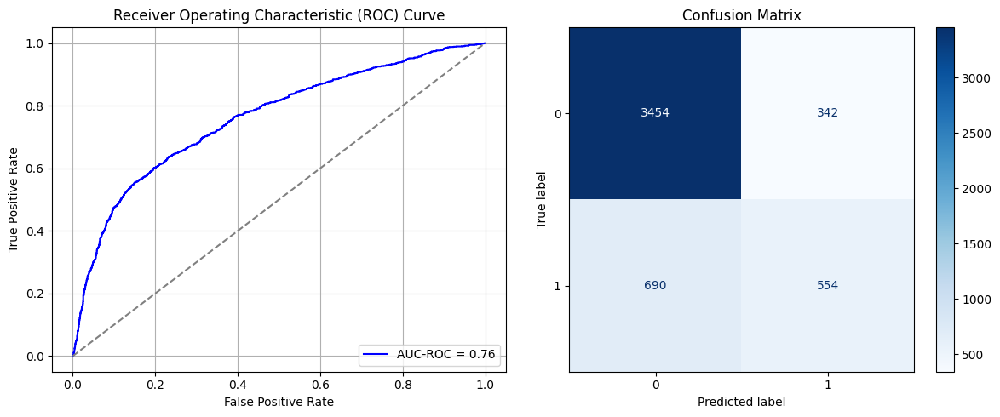

Best threshold based on F1-score: 0.9453949332237244
False Negative Rate: 0.5546623794212219
Time elapsed (performance): 1.2181990569988557
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6309 - loss: 0.5189 - val_AUC: 0.7308 - val_loss: 0.4608
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7316 - loss: 0.4535 - val_AUC: 0.7515 - val_loss: 0.4518
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7395 - loss: 0.4448 - val_AUC: 0.7529 - val_loss: 0.4504
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7455 - loss: 0.4445 - val_AUC: 0.7631 - val_loss: 0.4479
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7604 - loss: 0.4329 - val_AUC: 0.7617 - val_loss: 0.4457
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7523 - loss: 0.4450 - val_AUC: 0.7675 - val_loss: 0.4416
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7641 - loss: 0.4326 - val_AUC: 0.7680 - val_loss: 0.4447
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7593 - loss: 0.4304 - val_AUC: 0.7734 - val_loss: 0.4384
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7712 -

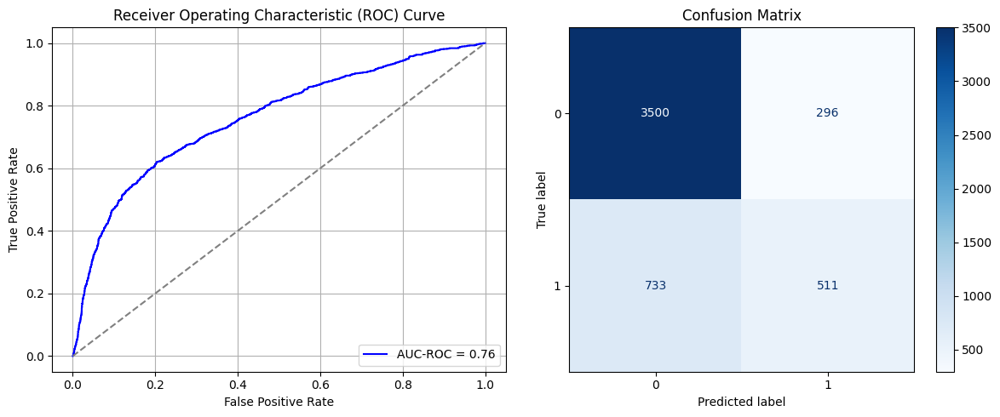

Best threshold based on F1-score: 0.9382857084274292
False Negative Rate: 0.5892282958199357
Time elapsed (performance): 0.7748186440003337
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6068 - loss: 0.5201 - val_AUC: 0.7190 - val_loss: 0.4665
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7290 - loss: 0.4488 - val_AUC: 0.7455 - val_loss: 0.4536
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7378 - loss: 0.4459 - val_AUC: 0.7541 - val_loss: 0.4517
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7365 - loss: 0.4436 - val_AUC: 0.7594 - val_loss: 0.4471
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7441 - loss: 0.4443 - val_AUC: 0.7573 - val_loss: 0.4476
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7549 - loss: 0.4383 - val_AUC: 0.7664 - val_loss: 0.4438
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7729 - loss: 0.4218 - val_AUC: 0.7710 - val_loss: 0.4396
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7564 - loss: 0.4382 - val_AUC: 0.7729 - val_loss: 0.4381
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7670 -

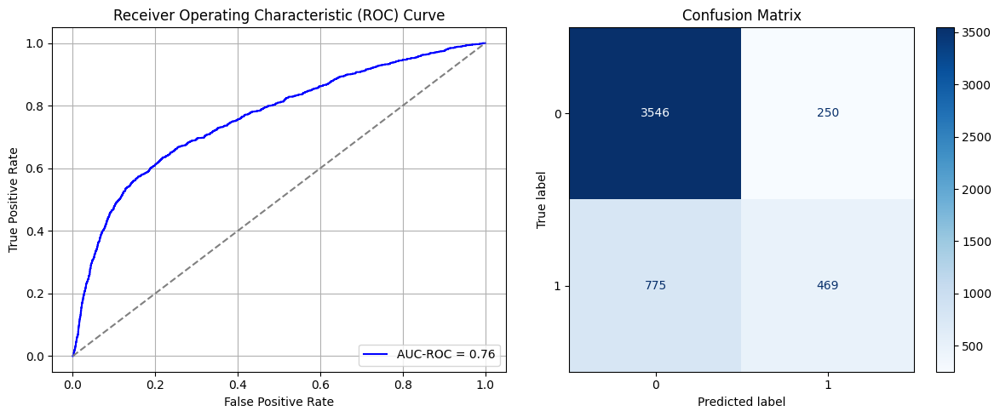

Best threshold based on F1-score: 0.9223699569702148
False Negative Rate: 0.6229903536977492
Time elapsed (performance): 0.75397355899986
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.5916 - loss: 0.5258 - val_AUC: 0.7334 - val_loss: 0.4700
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7348 - loss: 0.4553 - val_AUC: 0.7509 - val_loss: 0.4549
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7501 - loss: 0.4458 - val_AUC: 0.7553 - val_loss: 0.4464
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7483 - loss: 0.4451 - val_AUC: 0.7596 - val_loss: 0.4443
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7557 - loss: 0.4315 - val_AUC: 0.7671 - val_loss: 0.4413
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7628 - loss: 0.4314 - val_AUC: 0.7727 - val_loss: 0.4401
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7677 - loss: 0.4274 - val_AUC: 0.7717 - val_loss: 0.4423
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7669 - loss: 0.4270 - val_AUC: 0.7801 - val_loss: 0.4363
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7668 -

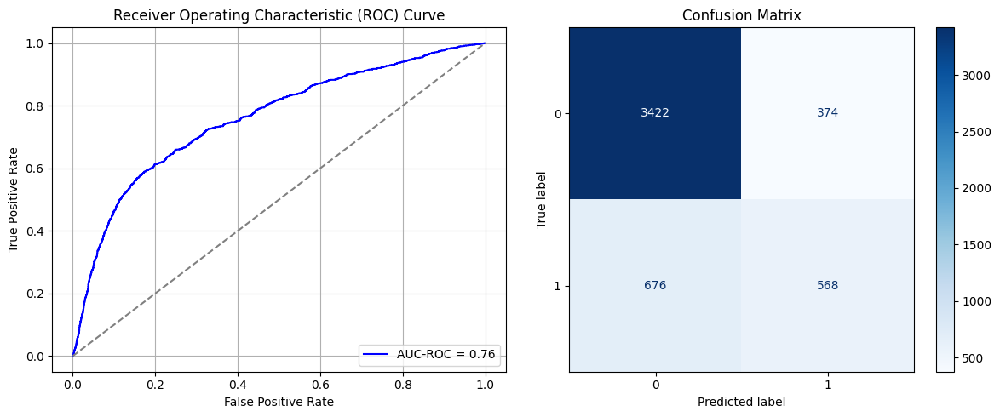

Best threshold based on F1-score: 0.9319813847541809
False Negative Rate: 0.5434083601286174
Time elapsed (performance): 1.04401410599894
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.5928 - loss: 0.5307 - val_AUC: 0.7222 - val_loss: 0.4644
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7353 - loss: 0.4500 - val_AUC: 0.7389 - val_loss: 0.4553
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7386 - loss: 0.4501 - val_AUC: 0.7509 - val_loss: 0.4508
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7403 - loss: 0.4472 - val_AUC: 0.7552 - val_loss: 0.4494
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7505 - loss: 0.4388 - val_AUC: 0.7618 - val_loss: 0.4480
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7555 - loss: 0.4390 - val_AUC: 0.7661 - val_loss: 0.4430
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7693 - loss: 0.4318 - val_AUC: 0.7685 - val_loss: 0.4417
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7694 - loss: 0.4316 - val_AUC: 0.7708 - val_loss: 0.4432
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7710 -

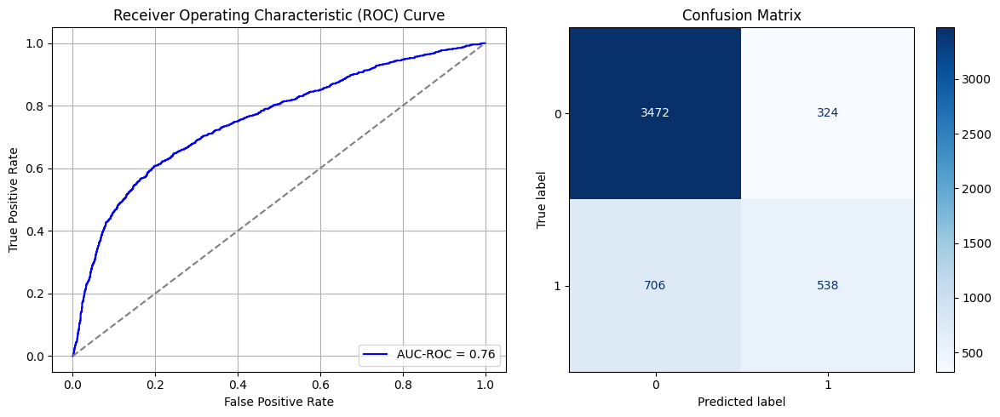

Best threshold based on F1-score: 0.9598889350891113
False Negative Rate: 0.567524115755627
Time elapsed (performance): 1.2641908959994907
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6060 - loss: 0.5359 - val_AUC: 0.7220 - val_loss: 0.4638
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7289 - loss: 0.4542 - val_AUC: 0.7412 - val_loss: 0.4534
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7506 - loss: 0.4379 - val_AUC: 0.7501 - val_loss: 0.4504
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7484 - loss: 0.4444 - val_AUC: 0.7637 - val_loss: 0.4448
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7601 - loss: 0.4329 - val_AUC: 0.7639 - val_loss: 0.4449
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7529 - loss: 0.4439 - val_AUC: 0.7694 - val_loss: 0.4428
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7611 - loss: 0.4316 - val_AUC: 0.7695 - val_loss: 0.4398
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7628 - loss: 0.4280 - val_AUC: 0.7683 - val_loss: 0.4405
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7684 -

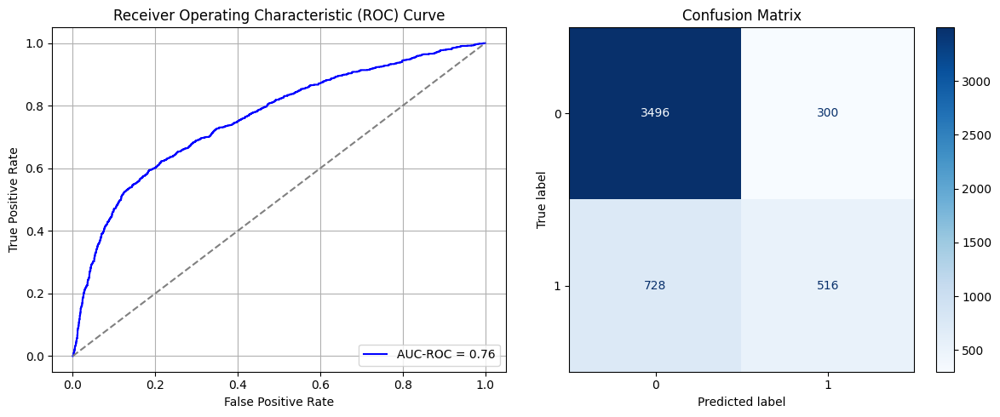

Best threshold based on F1-score: 0.9625322818756104
False Negative Rate: 0.5852090032154341
Time elapsed (performance): 1.0822360220008704
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6337 - loss: 0.5235 - val_AUC: 0.7328 - val_loss: 0.4639
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7340 - loss: 0.4485 - val_AUC: 0.7483 - val_loss: 0.4535
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7364 - loss: 0.4494 - val_AUC: 0.7585 - val_loss: 0.4491
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7519 - loss: 0.4376 - val_AUC: 0.7500 - val_loss: 0.4513
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7529 - loss: 0.4399 - val_AUC: 0.7663 - val_loss: 0.4443
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7532 - loss: 0.4408 - val_AUC: 0.7656 - val_loss: 0.4425
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7554 - loss: 0.4367 - val_AUC: 0.7621 - val_loss: 0.4478
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7652 - loss: 0.4333 - val_AUC: 0.7759 - val_loss: 0.4383
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7652 -

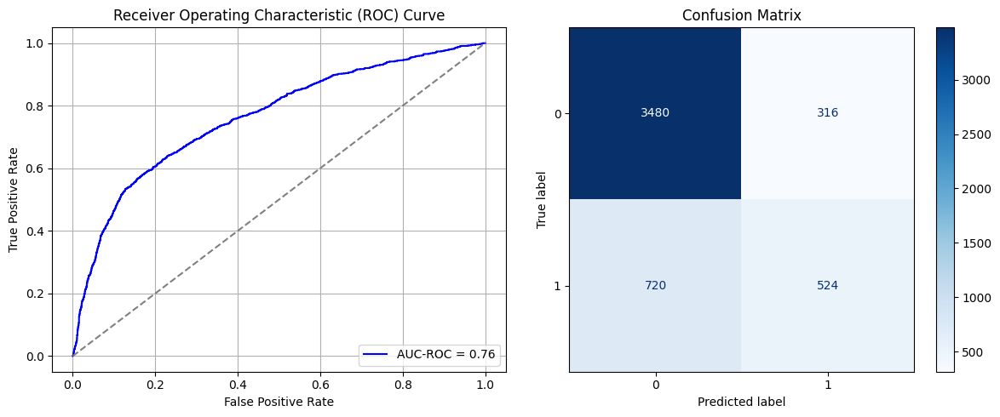

Best threshold based on F1-score: 0.9375137090682983
False Negative Rate: 0.5787781350482315
Time elapsed (performance): 1.0539347349986201
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5878 - loss: 0.5263 - val_AUC: 0.7236 - val_loss: 0.4659
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7281 - loss: 0.4578 - val_AUC: 0.7377 - val_loss: 0.4647
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7399 - loss: 0.4404 - val_AUC: 0.7521 - val_loss: 0.4492
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7428 - loss: 0.4409 - val_AUC: 0.7614 - val_loss: 0.4480
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7534 - loss: 0.4344 - val_AUC: 0.7669 - val_loss: 0.4435
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7558 - loss: 0.4358 - val_AUC: 0.7578 - val_loss: 0.4461
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7610 - loss: 0.4350 - val_AUC: 0.7695 - val_loss: 0.4415
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7660 - loss: 0.4340 - val_AUC: 0.7741 - val_loss: 0.4394
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7616 -

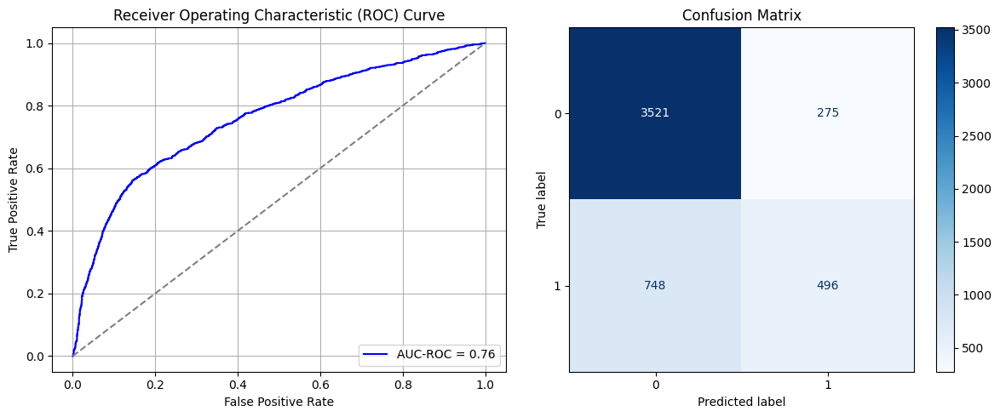

Best threshold based on F1-score: 0.8934841156005859
False Negative Rate: 0.6012861736334405
Time elapsed (performance): 0.7982933780003805
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5824 - loss: 0.5323 - val_AUC: 0.7147 - val_loss: 0.4750
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7307 - loss: 0.4533 - val_AUC: 0.7423 - val_loss: 0.4590
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7349 - loss: 0.4447 - val_AUC: 0.7552 - val_loss: 0.4540
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7535 - loss: 0.4402 - val_AUC: 0.7570 - val_loss: 0.4455
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7441 - loss: 0.4470 - val_AUC: 0.7630 - val_loss: 0.4452
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7465 - loss: 0.4410 - val_AUC: 0.7387 - val_loss: 0.4666
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7541 - loss: 0.4430 - val_AUC: 0.7692 - val_loss: 0.4421
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7485 - loss: 0.4336 - val_AUC: 0.7713 - val_loss: 0.4394
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7637 -

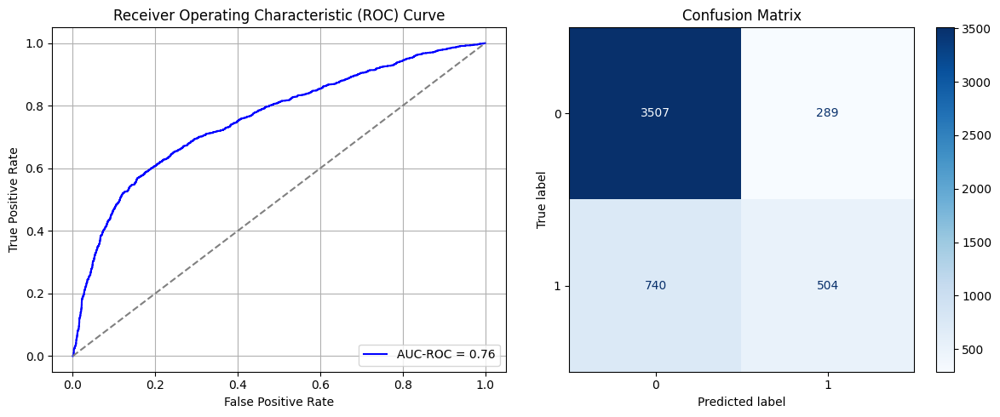

Best threshold based on F1-score: 0.9316604137420654
False Negative Rate: 0.594855305466238
Time elapsed (performance): 0.7854914640010975
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6126 - loss: 0.5226 - val_AUC: 0.7262 - val_loss: 0.4627
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7396 - loss: 0.4455 - val_AUC: 0.7500 - val_loss: 0.4532
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7420 - loss: 0.4449 - val_AUC: 0.7542 - val_loss: 0.4492
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7462 - loss: 0.4447 - val_AUC: 0.7607 - val_loss: 0.4524
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7554 - loss: 0.4371 - val_AUC: 0.7698 - val_loss: 0.4434
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7667 - loss: 0.4325 - val_AUC: 0.7734 - val_loss: 0.4434
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7546 - loss: 0.4360 - val_AUC: 0.7706 - val_loss: 0.4548
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7686 - loss: 0.4297 - val_AUC: 0.7772 - val_loss: 0.4366
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7742 -

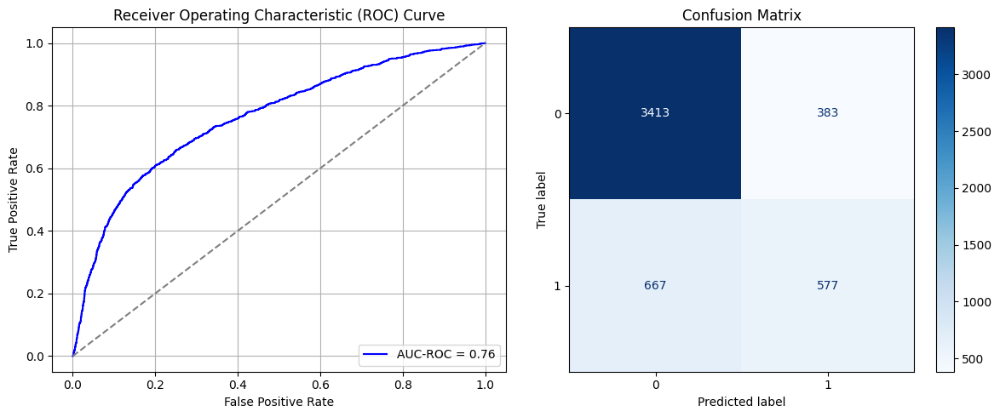

Best threshold based on F1-score: 0.9197127819061279
False Negative Rate: 0.5361736334405145
Time elapsed (performance): 1.0516433239972685
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5926 - loss: 0.5327 - val_AUC: 0.7185 - val_loss: 0.4667
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7310 - loss: 0.4526 - val_AUC: 0.7393 - val_loss: 0.4566
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7352 - loss: 0.4468 - val_AUC: 0.7463 - val_loss: 0.4507
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7428 - loss: 0.4401 - val_AUC: 0.7537 - val_loss: 0.4483
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7468 - loss: 0.4429 - val_AUC: 0.7564 - val_loss: 0.4474
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7527 - loss: 0.4350 - val_AUC: 0.7617 - val_loss: 0.4449
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7652 - loss: 0.4268 - val_AUC: 0.7650 - val_loss: 0.4433
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7574 - loss: 0.4415 - val_AUC: 0.7678 - val_loss: 0.4414
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7689 -

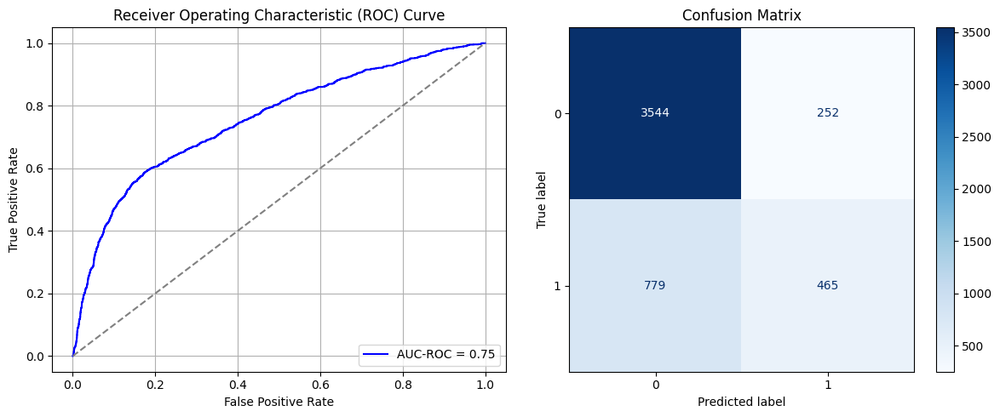

Best threshold based on F1-score: 0.8958433270454407
False Negative Rate: 0.6262057877813505
Time elapsed (performance): 0.778671760999714
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6374 - loss: 0.5200 - val_AUC: 0.7274 - val_loss: 0.4629
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7347 - loss: 0.4539 - val_AUC: 0.7474 - val_loss: 0.4531
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7459 - loss: 0.4444 - val_AUC: 0.7536 - val_loss: 0.4515
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7476 - loss: 0.4392 - val_AUC: 0.7536 - val_loss: 0.4481
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7585 - loss: 0.4345 - val_AUC: 0.7618 - val_loss: 0.4445
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7557 - loss: 0.4331 - val_AUC: 0.7682 - val_loss: 0.4450
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7683 - loss: 0.4264 - val_AUC: 0.7703 - val_loss: 0.4398
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7582 - loss: 0.4268 - val_AUC: 0.7750 - val_loss: 0.4379
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7731 -

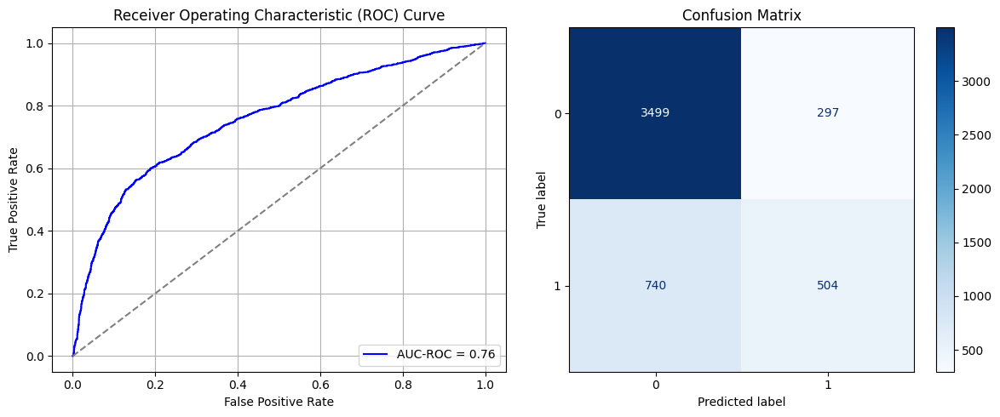

Best threshold based on F1-score: 0.9666868448257446
False Negative Rate: 0.594855305466238
Time elapsed (performance): 1.046484613998473
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6337 - loss: 0.5150 - val_AUC: 0.7230 - val_loss: 0.4778
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7260 - loss: 0.4632 - val_AUC: 0.7509 - val_loss: 0.4531
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7466 - loss: 0.4437 - val_AUC: 0.7536 - val_loss: 0.4500
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7478 - loss: 0.4354 - val_AUC: 0.7573 - val_loss: 0.4489
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7592 - loss: 0.4405 - val_AUC: 0.7579 - val_loss: 0.4489
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7504 - loss: 0.4401 - val_AUC: 0.7626 - val_loss: 0.4440
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7604 - loss: 0.4353 - val_AUC: 0.7671 - val_loss: 0.4417
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7544 - loss: 0.4392 - val_AUC: 0.7677 - val_loss: 0.4438
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7704 -

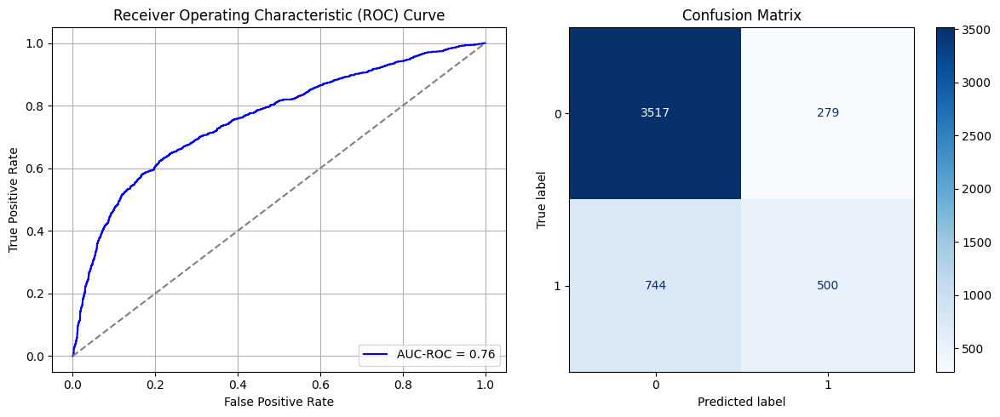

Best threshold based on F1-score: 0.9349059462547302
False Negative Rate: 0.5980707395498392
Time elapsed (performance): 1.3550733609990857
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6099 - loss: 0.5269 - val_AUC: 0.7255 - val_loss: 0.4638
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7275 - loss: 0.4563 - val_AUC: 0.7457 - val_loss: 0.4525
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7519 - loss: 0.4339 - val_AUC: 0.7577 - val_loss: 0.4476
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7466 - loss: 0.4469 - val_AUC: 0.7607 - val_loss: 0.4464
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7557 - loss: 0.4397 - val_AUC: 0.7644 - val_loss: 0.4442
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7576 - loss: 0.4361 - val_AUC: 0.7700 - val_loss: 0.4413
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7634 - loss: 0.4283 - val_AUC: 0.7675 - val_loss: 0.4417
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7653 - loss: 0.4351 - val_AUC: 0.7732 - val_loss: 0.4386
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7666 -

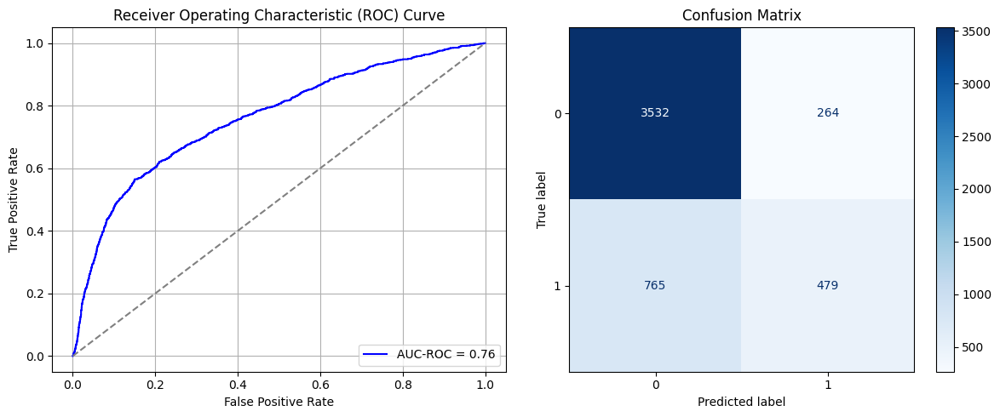

Best threshold based on F1-score: 0.9451702833175659
False Negative Rate: 0.614951768488746
Time elapsed (performance): 1.1802365379990079
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.5645 - loss: 0.5617 - val_AUC: 0.7150 - val_loss: 0.4679
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7310 - loss: 0.4570 - val_AUC: 0.7430 - val_loss: 0.4600
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7386 - loss: 0.4576 - val_AUC: 0.7525 - val_loss: 0.4515
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7527 - loss: 0.4410 - val_AUC: 0.7557 - val_loss: 0.4518
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7517 - loss: 0.4447 - val_AUC: 0.7583 - val_loss: 0.4459
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7627 - loss: 0.4286 - val_AUC: 0.7638 - val_loss: 0.4457
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7545 - loss: 0.4348 - val_AUC: 0.7657 - val_loss: 0.4422
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7637 - loss: 0.4323 - val_AUC: 0.7673 - val_loss: 0.4452
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7667 -

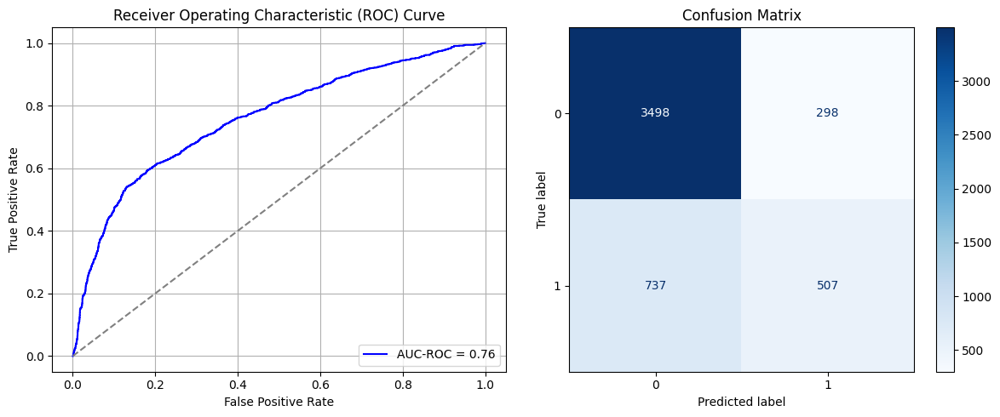

Best threshold based on F1-score: 0.3303524851799011
False Negative Rate: 0.592443729903537
Time elapsed (performance): 0.8581848079993506
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6355 - loss: 0.5166 - val_AUC: 0.7231 - val_loss: 0.4645
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7292 - loss: 0.4511 - val_AUC: 0.7415 - val_loss: 0.4551
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7515 - loss: 0.4374 - val_AUC: 0.7452 - val_loss: 0.4507
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7440 - loss: 0.4416 - val_AUC: 0.7583 - val_loss: 0.4593
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7556 - loss: 0.4376 - val_AUC: 0.7640 - val_loss: 0.4459
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7675 - loss: 0.4332 - val_AUC: 0.7654 - val_loss: 0.4427
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7572 - loss: 0.4422 - val_AUC: 0.7701 - val_loss: 0.4465
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7686 - loss: 0.4237 - val_AUC: 0.7749 - val_loss: 0.4397
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7730 -

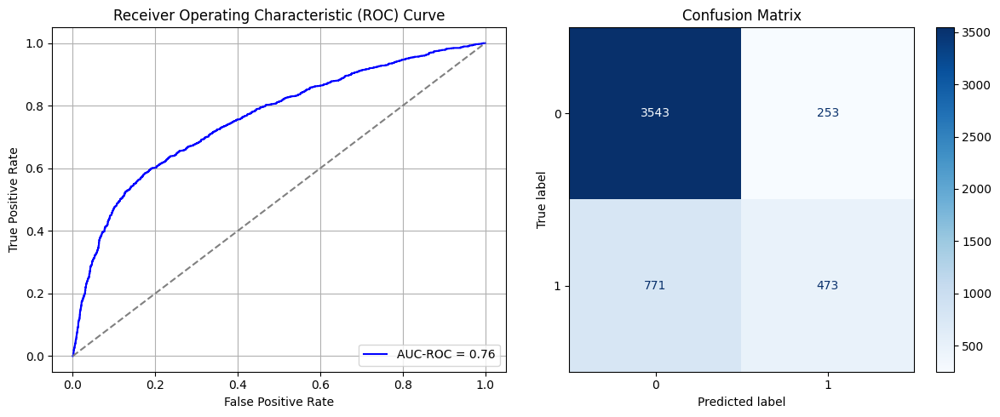

Best threshold based on F1-score: 0.9392611980438232
False Negative Rate: 0.6197749196141479
Time elapsed (performance): 1.0664215169999807
Epoch 1/10


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


493/493 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6196 - loss: 0.5222 - val_AUC: 0.7276 - val_loss: 0.4626
Epoch 2/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7236 - loss: 0.4533 - val_AUC: 0.7485 - val_loss: 0.4505
Epoch 3/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7398 - loss: 0.4480 - val_AUC: 0.7411 - val_loss: 0.4625
Epoch 4/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7430 - loss: 0.4386 - val_AUC: 0.7571 - val_loss: 0.4460
Epoch 5/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7531 - loss: 0.4377 - val_AUC: 0.7653 - val_loss: 0.4426
Epoch 6/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7515 - loss: 0.4339 - val_AUC: 0.7693 - val_loss: 0.4403
Epoch 7/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7507 - loss: 0.4379 - val_AUC: 0.7720 - val_loss: 0.4393
Epoch 8/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7676 - loss: 0.4258 - val_AUC: 0.7709 - val_loss: 0.4428
Epoch 9/10
493/493 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7673 -

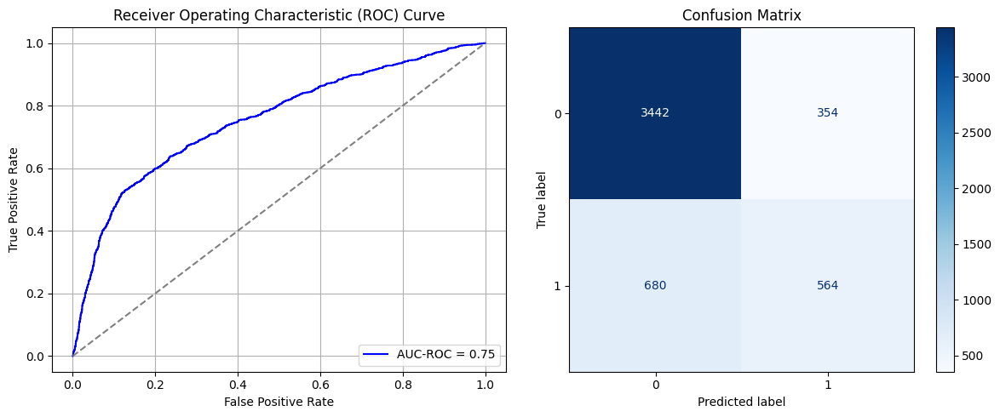

Best threshold based on F1-score: 0.9164995551109314
False Negative Rate: 0.5466237942122186
Time elapsed (performance): 1.068975132999185


<ipython-input-21-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


In [25]:
times = 50

Training_time = []
FPR = []
TPR = []
FNR = []
TNR = []
TL_time = []


for i in range(times):
    X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_full, y_S_full, test_size=0.20, random_state=0)
    model_source = create_dnn_model(X_S_train.shape[1])
    result_imbalanced = train_and_evaluate(model_source, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
    result_TL_imbalanced = Transductive_TL(model_source, X_T_full, y_T_full, "Target")

    Training_time.append(result_imbalanced)
    FPR.append(result_TL_imbalanced[0])
    TPR.append(result_TL_imbalanced[1])
    FNR.append(result_TL_imbalanced[2])
    TNR.append(result_TL_imbalanced[3])
    TL_time.append(result_TL_imbalanced[4])

ParamFit = pd.DataFrame([Training_time, FPR, TPR, FNR, TNR, TL_time]).T
ParamFit.columns=['Source time', 'FPR', 'TPR', 'FNR', 'TNR', 'Target time']
# print(ParamFit)

In [26]:
print(ParamFit)
ParamFit.to_csv('Imbalanced.csv')

    Source time       FPR       TPR       FNR       TNR  Target time
0     25.066273  0.059009  0.940991  0.651929  0.348071     0.714323
1     20.063383  0.081928  0.918072  0.581190  0.418810     0.703942
2     22.914742  0.075606  0.924394  0.591640  0.408360     0.718743
3     22.121803  0.074552  0.925448  0.605305  0.394695     0.685970
4     23.958191  0.074552  0.925448  0.595659  0.404341     0.734462
5     20.378450  0.073235  0.926765  0.611736  0.388264     0.843151
6     24.302009  0.101686  0.898314  0.536977  0.463023     1.235283
7     22.448763  0.057165  0.942835  0.672026  0.327974     1.133797
8     23.956984  0.074816  0.925184  0.589228  0.410772     0.714817
9     24.219348  0.078504  0.921496  0.588424  0.411576     0.691746
10    25.505616  0.086407  0.913593  0.564309  0.435691     0.717107
11    23.187402  0.072708  0.927292  0.602894  0.397106     0.745376
12    23.582536  0.057692  0.942308  0.673633  0.326367     0.697001
13    22.303443  0.086934  0.91306

# Random Undersampling (RUS) to balance Dataset:

## SRS Sample without Replacement:

In [60]:
data_S

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,Y
0,0.010101,1.0,0.333333,0.333333,0.051724,0.4,0.4,0.1,0.1,0.0,...,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000,1
1,0.111111,1.0,0.333333,0.666667,0.086207,0.1,0.4,0.2,0.2,0.2,...,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783,1
2,0.080808,1.0,0.333333,0.666667,0.224138,0.2,0.2,0.2,0.2,0.2,...,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458,0
3,0.040404,1.0,0.333333,0.333333,0.275862,0.2,0.2,0.2,0.2,0.2,...,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892,0
4,0.040404,0.0,0.333333,0.333333,0.620690,0.1,0.2,0.1,0.2,0.2,...,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29646,0.202020,0.0,0.333333,0.333333,0.224138,0.5,0.4,0.4,0.4,0.4,...,0.162493,0.083127,0.262900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
29648,0.090909,0.0,0.000000,0.666667,0.293103,0.2,0.1,0.1,0.2,0.2,...,0.226667,0.149535,0.303248,0.002290,0.066370,0.004464,0.004831,0.004689,0.003783,0
29649,0.070707,0.0,0.333333,0.666667,0.224138,0.4,0.4,0.4,0.4,0.4,...,0.233160,0.162558,0.323347,0.008013,0.002078,0.000000,0.011272,0.000000,0.007566,1
29652,0.020202,0.0,0.333333,0.666667,0.275862,0.6,0.5,0.4,0.1,0.2,...,0.179805,0.101057,0.275854,0.000000,0.000000,0.024552,0.006763,0.004689,0.005864,1


In [61]:
data_S
data_S_majority = data_S[data_S['Y'].isin([0])]
data_S_minority = data_S[data_S['Y'].isin([1])]

undersample_size = data_S_minority['Y'].size
oversample_size = data_S_majority['Y'].size

print(undersample_size)
print(oversample_size)

5366
19249


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6388 - loss: 0.6655 - val_AUC: 0.7124 - val_loss: 0.6129
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7012 - loss: 0.6207 - val_AUC: 0.7343 - val_loss: 0.5982
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7253 - loss: 0.6053 - val_AUC: 0.7412 - val_loss: 0.5908
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7345 - loss: 0.5956 - val_AUC: 0.7452 - val_loss: 0.5841
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7381 - loss: 0.5905 - val_AUC: 0.7455 - val_loss: 0.5958
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7379 - loss: 0.5894 - val_AUC: 0.7525 - val_loss: 0.5819
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7429 - loss: 0.5867 - val_AUC: 0.7523 - val_loss: 0.5794
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7428 - loss: 0.5904 - val_AUC: 0.7560 - val_loss: 0.5823
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7579 -

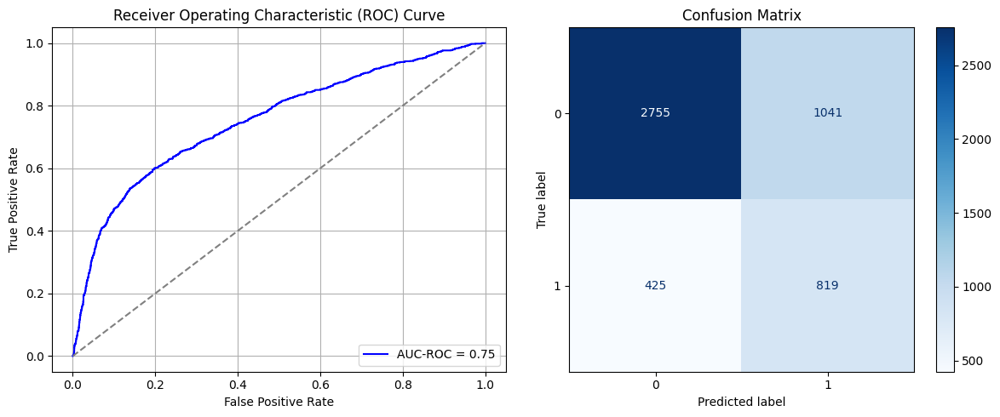

Best threshold based on F1-score: 0.9950762987136841
False Negative Rate: 0.34163987138263663
Time elapsed (performance): 0.728197062000163
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6596 - loss: 0.6612 - val_AUC: 0.7160 - val_loss: 0.6135
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7160 - loss: 0.6087 - val_AUC: 0.7328 - val_loss: 0.5932
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7276 - loss: 0.5978 - val_AUC: 0.7471 - val_loss: 0.5862
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5971 - val_AUC: 0.7556 - val_loss: 0.5814
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7430 - loss: 0.5852 - val_AUC: 0.7580 - val_loss: 0.5801
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7525 - loss: 0.5755 - val_AUC: 0.7590 - val_loss: 0.5804
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7492 - loss: 0.5789 - val_AUC: 0.7607 - val_loss: 0.5770
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7547 - loss: 0.5769 - val_AUC: 0.7644 - val_loss: 0.5753
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7764 -

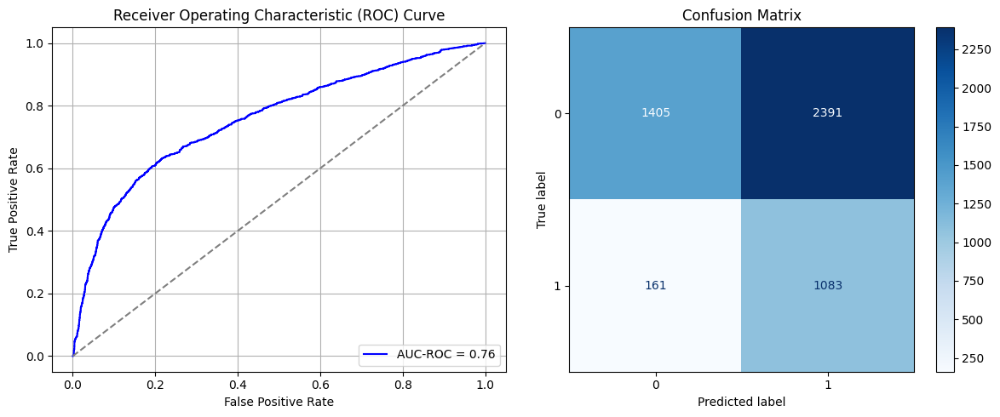

Best threshold based on F1-score: 0.6081621646881104
False Negative Rate: 0.12942122186495178
Time elapsed (performance): 0.6917728089997581
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6409 - loss: 0.6672 - val_AUC: 0.7145 - val_loss: 0.6168
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6857 - loss: 0.6276 - val_AUC: 0.7345 - val_loss: 0.6019
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7196 - loss: 0.6057 - val_AUC: 0.7377 - val_loss: 0.5974
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7335 - loss: 0.5930 - val_AUC: 0.7403 - val_loss: 0.5941
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7345 - loss: 0.5932 - val_AUC: 0.7458 - val_loss: 0.5894
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7332 - loss: 0.5948 - val_AUC: 0.7461 - val_loss: 0.5983
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7456 - loss: 0.5813 - val_AUC: 0.7476 - val_loss: 0.5869
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5924 - val_AUC: 0.7484 - val_loss: 0.5912
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7577 -

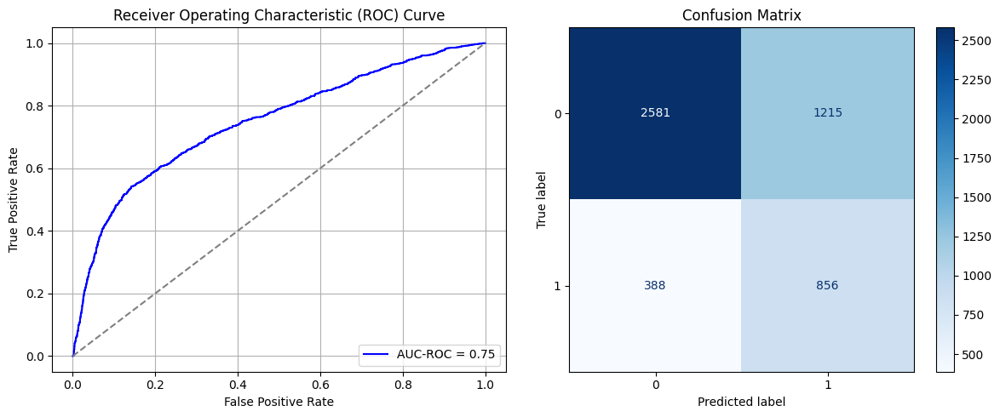

Best threshold based on F1-score: 0.6160544157028198
False Negative Rate: 0.31189710610932475
Time elapsed (performance): 0.6983283049999045
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6344 - loss: 0.6658 - val_AUC: 0.7175 - val_loss: 0.6084
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7114 - loss: 0.6150 - val_AUC: 0.7392 - val_loss: 0.5892
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7199 - loss: 0.6104 - val_AUC: 0.7513 - val_loss: 0.5847
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7394 - loss: 0.5955 - val_AUC: 0.7538 - val_loss: 0.5780
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7354 - loss: 0.5943 - val_AUC: 0.7581 - val_loss: 0.5749
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7482 - loss: 0.5825 - val_AUC: 0.7542 - val_loss: 0.5777
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7423 - loss: 0.5904 - val_AUC: 0.7610 - val_loss: 0.5736
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7427 - loss: 0.5913 - val_AUC: 0.7600 - val_loss: 0.5726
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7482 -

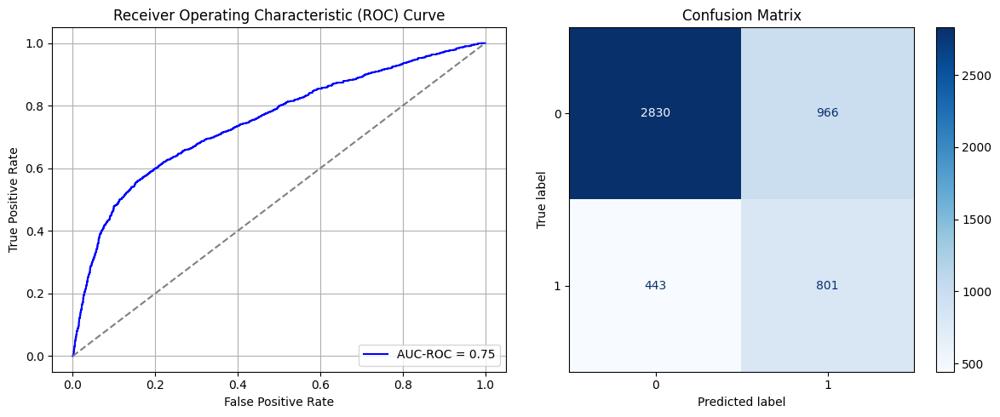

Best threshold based on F1-score: 0.9946772456169128
False Negative Rate: 0.35610932475884244
Time elapsed (performance): 0.711253840000154
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6376 - loss: 0.6699 - val_AUC: 0.7121 - val_loss: 0.6167
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.6055 - val_AUC: 0.7386 - val_loss: 0.6032
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7379 - loss: 0.5941 - val_AUC: 0.7453 - val_loss: 0.5930
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7335 - loss: 0.5966 - val_AUC: 0.7428 - val_loss: 0.5988
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7424 - loss: 0.5891 - val_AUC: 0.7479 - val_loss: 0.5866
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7535 - loss: 0.5816 - val_AUC: 0.7520 - val_loss: 0.5854
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7533 - loss: 0.5763 - val_AUC: 0.7508 - val_loss: 0.5867
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7561 - loss: 0.5795 - val_AUC: 0.7527 - val_loss: 0.5869
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7467 -

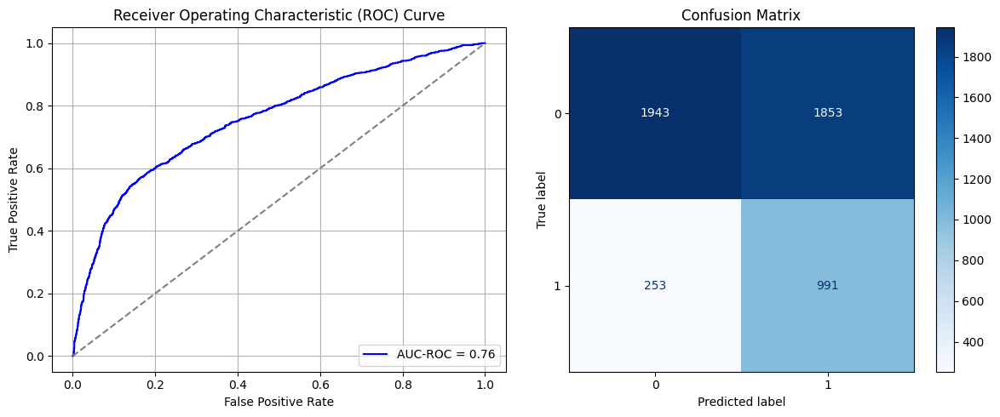

Best threshold based on F1-score: 0.9993847012519836
False Negative Rate: 0.20337620578778134
Time elapsed (performance): 0.7326531930002602
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6488 - loss: 0.6692 - val_AUC: 0.7060 - val_loss: 0.6175
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7057 - loss: 0.6126 - val_AUC: 0.7268 - val_loss: 0.6032
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7273 - loss: 0.6016 - val_AUC: 0.7390 - val_loss: 0.5972
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7311 - loss: 0.5949 - val_AUC: 0.7448 - val_loss: 0.5908
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7305 - loss: 0.5934 - val_AUC: 0.7464 - val_loss: 0.5910
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7330 - loss: 0.5917 - val_AUC: 0.7552 - val_loss: 0.5859
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7490 - loss: 0.5771 - val_AUC: 0.7598 - val_loss: 0.5842
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7505 - loss: 0.5842 - val_AUC: 0.7582 - val_loss: 0.5859
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7359 -

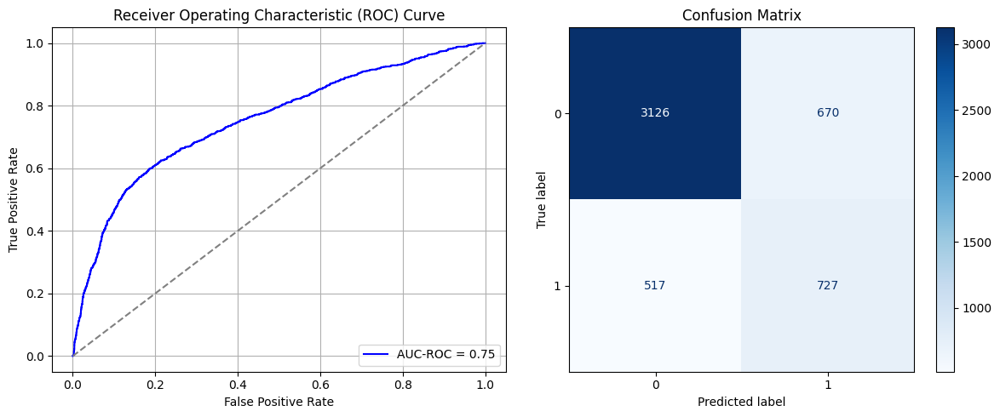

Best threshold based on F1-score: 0.9996225833892822
False Negative Rate: 0.41559485530546625
Time elapsed (performance): 0.7255310799992003
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6632 - loss: 0.6669 - val_AUC: 0.6990 - val_loss: 0.6241
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7070 - loss: 0.6180 - val_AUC: 0.7239 - val_loss: 0.6053
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5996 - val_AUC: 0.7340 - val_loss: 0.5977
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.5970 - val_AUC: 0.7428 - val_loss: 0.5984
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7455 - loss: 0.5860 - val_AUC: 0.7466 - val_loss: 0.5908
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7446 - loss: 0.5842 - val_AUC: 0.7499 - val_loss: 0.5909
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7524 - loss: 0.5798 - val_AUC: 0.7474 - val_loss: 0.5904
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7418 - loss: 0.5863 - val_AUC: 0.7498 - val_loss: 0.5901
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7575 -

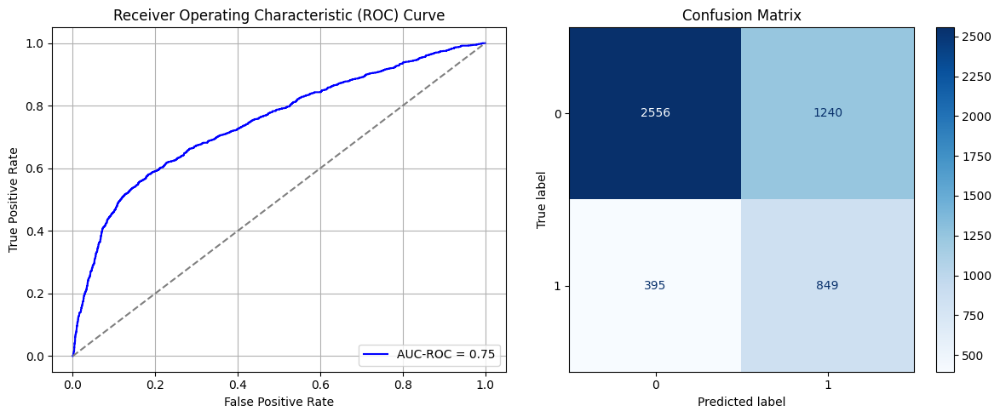

Best threshold based on F1-score: 0.9965783357620239
False Negative Rate: 0.317524115755627
Time elapsed (performance): 0.7212504959998114
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6442 - loss: 0.6617 - val_AUC: 0.7147 - val_loss: 0.6097
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7121 - loss: 0.6121 - val_AUC: 0.7352 - val_loss: 0.5910
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7331 - loss: 0.5924 - val_AUC: 0.7466 - val_loss: 0.5845
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7365 - loss: 0.5975 - val_AUC: 0.7583 - val_loss: 0.5778
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7542 - loss: 0.5804 - val_AUC: 0.7631 - val_loss: 0.5763
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7620 - loss: 0.5711 - val_AUC: 0.7617 - val_loss: 0.5783
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7554 - loss: 0.5796 - val_AUC: 0.7655 - val_loss: 0.5717
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7507 - loss: 0.5811 - val_AUC: 0.7683 - val_loss: 0.5699
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7577 -

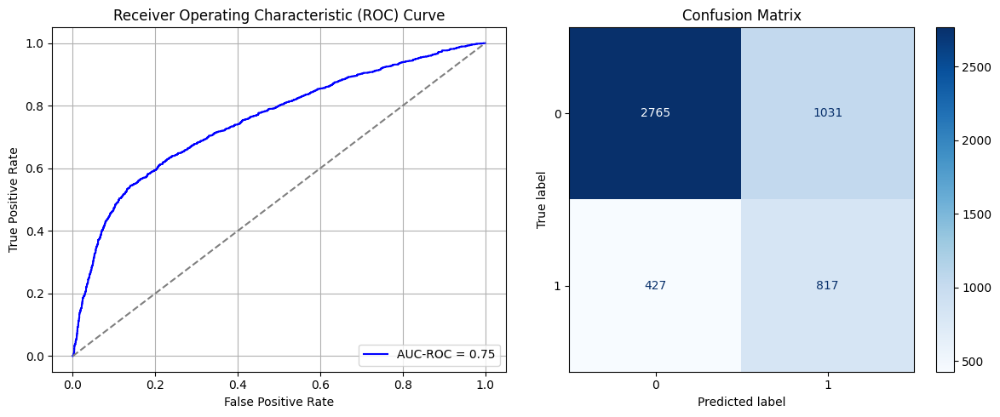

Best threshold based on F1-score: 0.9993870258331299
False Negative Rate: 0.3432475884244373
Time elapsed (performance): 1.21128253400002
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6167 - loss: 0.6671 - val_AUC: 0.7189 - val_loss: 0.6073
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7168 - loss: 0.6025 - val_AUC: 0.7381 - val_loss: 0.5999
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7250 - loss: 0.5978 - val_AUC: 0.7505 - val_loss: 0.5828
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7328 - loss: 0.5942 - val_AUC: 0.7528 - val_loss: 0.5758
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7486 - loss: 0.5861 - val_AUC: 0.7540 - val_loss: 0.5777
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7465 - loss: 0.5845 - val_AUC: 0.7545 - val_loss: 0.5739
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7455 - loss: 0.5835 - val_AUC: 0.7549 - val_loss: 0.5751
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7478 - loss: 0.5833 - val_AUC: 0.7572 - val_loss: 0.5732
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7593 -

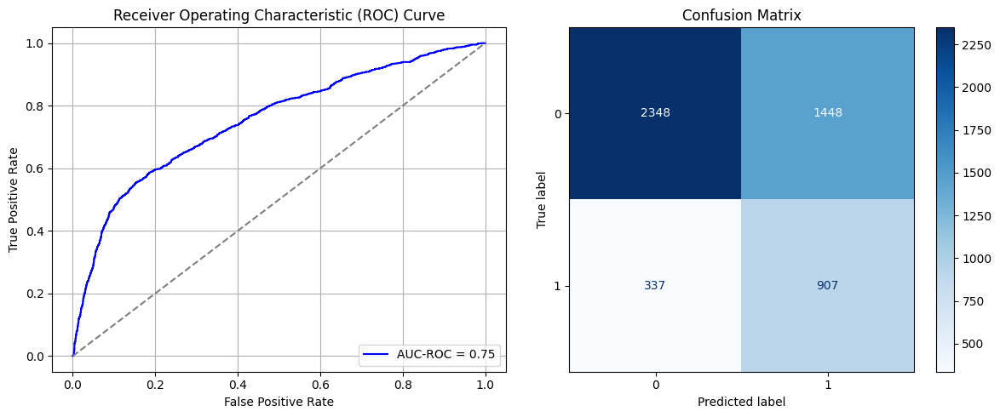

Best threshold based on F1-score: 0.9993200898170471
False Negative Rate: 0.2709003215434084
Time elapsed (performance): 0.7411195210006554
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6319 - loss: 0.6665 - val_AUC: 0.7023 - val_loss: 0.6199
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6939 - loss: 0.6188 - val_AUC: 0.7280 - val_loss: 0.6033
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7361 - loss: 0.5934 - val_AUC: 0.7422 - val_loss: 0.5953
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7347 - loss: 0.5945 - val_AUC: 0.7533 - val_loss: 0.5925
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7481 - loss: 0.5867 - val_AUC: 0.7546 - val_loss: 0.5870
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7441 - loss: 0.5855 - val_AUC: 0.7555 - val_loss: 0.5867
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7539 - loss: 0.5813 - val_AUC: 0.7584 - val_loss: 0.5858
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7582 - loss: 0.5786 - val_AUC: 0.7623 - val_loss: 0.5814
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7647 -

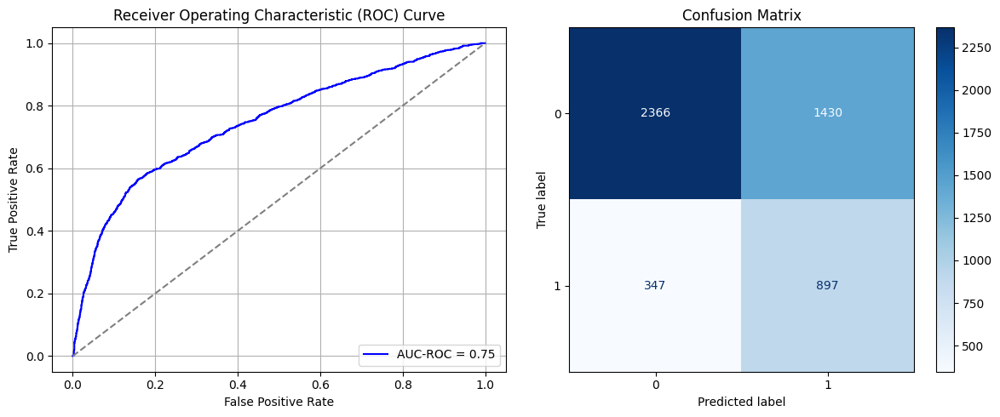

Best threshold based on F1-score: 0.9989504814147949
False Negative Rate: 0.27893890675241156
Time elapsed (performance): 0.7226691249998112
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6636 - loss: 0.6622 - val_AUC: 0.7109 - val_loss: 0.6176
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7035 - loss: 0.6210 - val_AUC: 0.7278 - val_loss: 0.6000
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7314 - loss: 0.6002 - val_AUC: 0.7419 - val_loss: 0.5923
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7267 - loss: 0.5991 - val_AUC: 0.7387 - val_loss: 0.5953
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7419 - loss: 0.5892 - val_AUC: 0.7444 - val_loss: 0.5900
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7408 - loss: 0.5926 - val_AUC: 0.7524 - val_loss: 0.5839
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7416 - loss: 0.5937 - val_AUC: 0.7560 - val_loss: 0.5859
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7444 - loss: 0.5893 - val_AUC: 0.7514 - val_loss: 0.5879
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7522 -

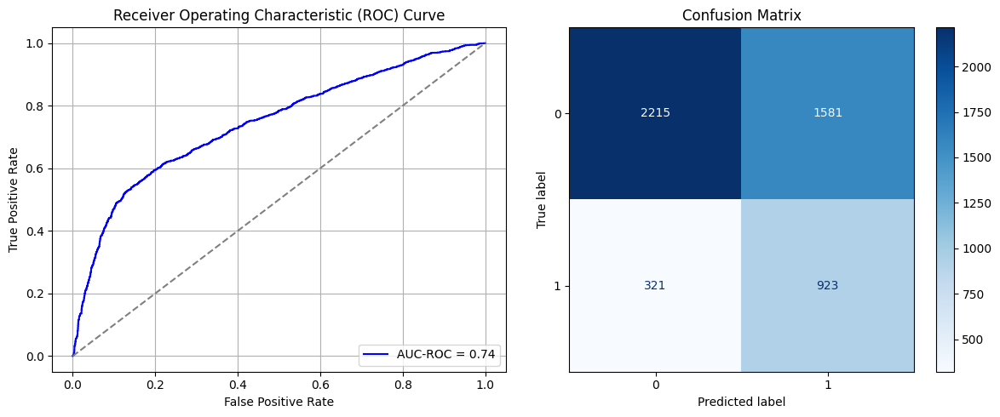

Best threshold based on F1-score: 0.9982792139053345
False Negative Rate: 0.2580385852090032
Time elapsed (performance): 0.7334601680004198
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6568 - loss: 0.6587 - val_AUC: 0.7119 - val_loss: 0.6146
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7185 - loss: 0.6054 - val_AUC: 0.7296 - val_loss: 0.6035
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7340 - loss: 0.5926 - val_AUC: 0.7355 - val_loss: 0.5995
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7462 - loss: 0.5806 - val_AUC: 0.7420 - val_loss: 0.5954
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7488 - loss: 0.5828 - val_AUC: 0.7497 - val_loss: 0.5962
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7467 - loss: 0.5813 - val_AUC: 0.7518 - val_loss: 0.5908
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7500 - loss: 0.5811 - val_AUC: 0.7549 - val_loss: 0.5892
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7479 - loss: 0.5829 - val_AUC: 0.7561 - val_loss: 0.5956
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7742 -

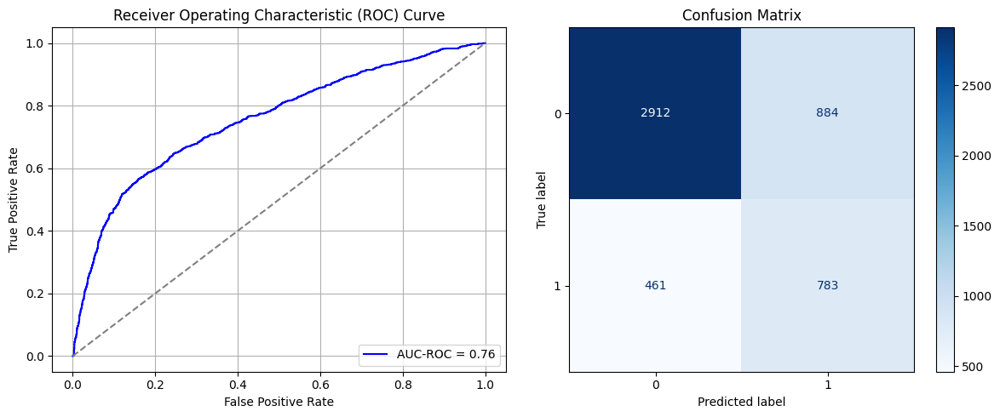

Best threshold based on F1-score: 0.5843213796615601
False Negative Rate: 0.37057877813504825
Time elapsed (performance): 0.7180044019996785
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6068 - loss: 0.6727 - val_AUC: 0.7034 - val_loss: 0.6213
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7134 - loss: 0.6091 - val_AUC: 0.7287 - val_loss: 0.6010
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7389 - loss: 0.5919 - val_AUC: 0.7357 - val_loss: 0.5964
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7437 - loss: 0.5827 - val_AUC: 0.7359 - val_loss: 0.5948
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7571 - loss: 0.5783 - val_AUC: 0.7390 - val_loss: 0.5937
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7423 - loss: 0.5866 - val_AUC: 0.7396 - val_loss: 0.5921
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7559 - loss: 0.5772 - val_AUC: 0.7400 - val_loss: 0.5952
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7628 - loss: 0.5716 - val_AUC: 0.7407 - val_loss: 0.5905
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7617 -

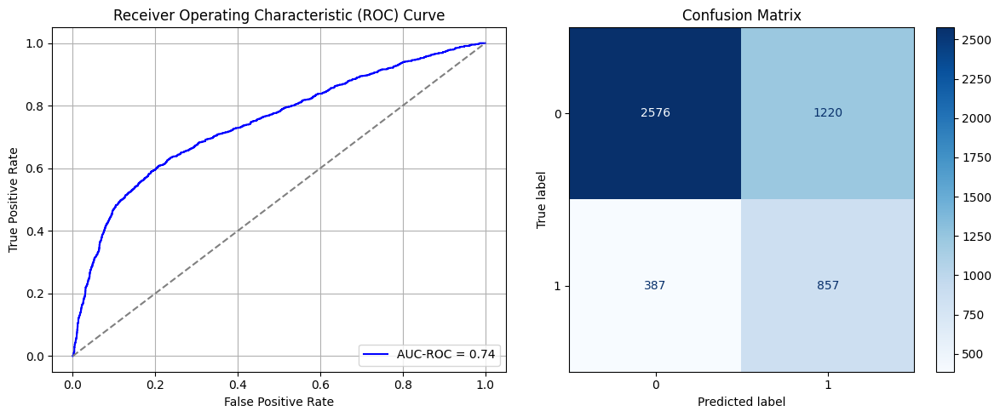

Best threshold based on F1-score: 0.9996668696403503
False Negative Rate: 0.31109324758842444
Time elapsed (performance): 0.7332601269999941
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6460 - loss: 0.6653 - val_AUC: 0.7225 - val_loss: 0.6133
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7107 - loss: 0.6121 - val_AUC: 0.7441 - val_loss: 0.5864
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7236 - loss: 0.6046 - val_AUC: 0.7610 - val_loss: 0.5751
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7393 - loss: 0.5885 - val_AUC: 0.7613 - val_loss: 0.5734
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7332 - loss: 0.5934 - val_AUC: 0.7678 - val_loss: 0.5714
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7440 - loss: 0.5833 - val_AUC: 0.7739 - val_loss: 0.5682
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7425 - loss: 0.5902 - val_AUC: 0.7682 - val_loss: 0.5697
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7505 - loss: 0.5810 - val_AUC: 0.7754 - val_loss: 0.5652
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7537 -

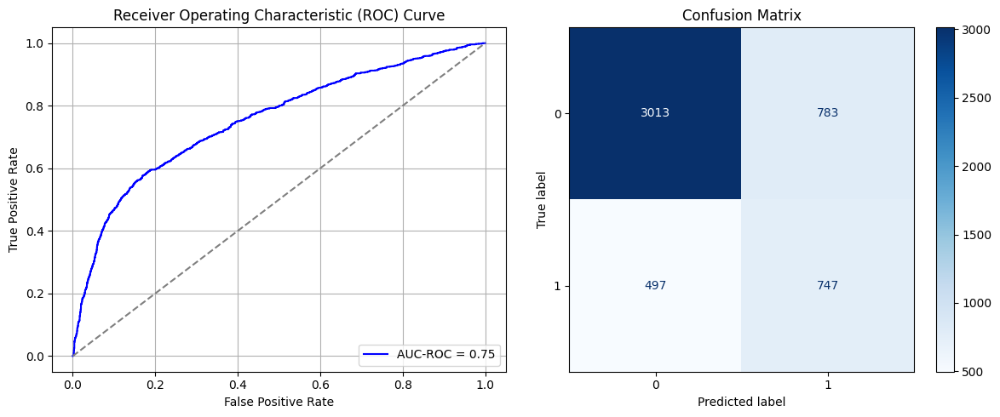

Best threshold based on F1-score: 0.9966995120048523
False Negative Rate: 0.3995176848874598
Time elapsed (performance): 0.7437068139997791
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6471 - loss: 0.6636 - val_AUC: 0.7092 - val_loss: 0.6153
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7193 - loss: 0.6059 - val_AUC: 0.7412 - val_loss: 0.5937
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7442 - loss: 0.5858 - val_AUC: 0.7504 - val_loss: 0.5870
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7446 - loss: 0.5833 - val_AUC: 0.7548 - val_loss: 0.5796
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7460 - loss: 0.5815 - val_AUC: 0.7567 - val_loss: 0.5794
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7598 - loss: 0.5730 - val_AUC: 0.7611 - val_loss: 0.5742
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7540 - loss: 0.5790 - val_AUC: 0.7621 - val_loss: 0.5733
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7607 - loss: 0.5711 - val_AUC: 0.7643 - val_loss: 0.5723
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7615 -

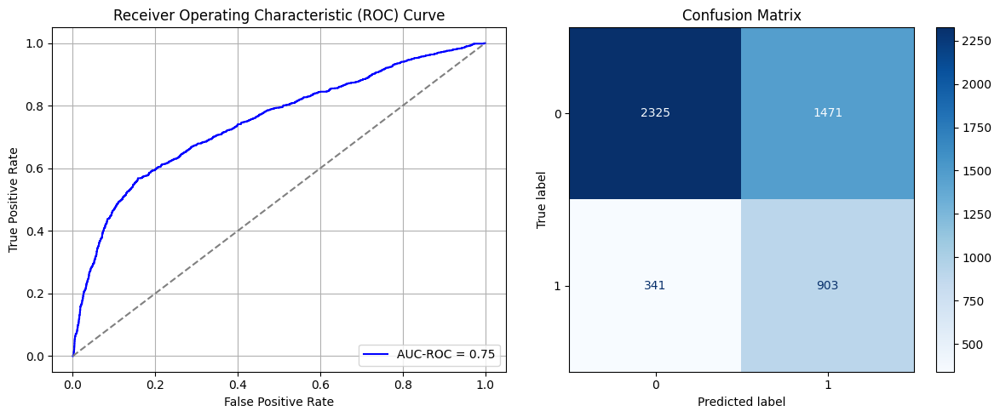

Best threshold based on F1-score: 0.6475598216056824
False Negative Rate: 0.2741157556270096
Time elapsed (performance): 0.717097718000332
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6450 - loss: 0.6670 - val_AUC: 0.7009 - val_loss: 0.6230
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7193 - loss: 0.6021 - val_AUC: 0.7262 - val_loss: 0.6157
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7420 - loss: 0.5892 - val_AUC: 0.7375 - val_loss: 0.6041
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7414 - loss: 0.5856 - val_AUC: 0.7456 - val_loss: 0.5959
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7479 - loss: 0.5853 - val_AUC: 0.7438 - val_loss: 0.6000
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7434 - loss: 0.5835 - val_AUC: 0.7474 - val_loss: 0.5918
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7564 - loss: 0.5746 - val_AUC: 0.7456 - val_loss: 0.5964
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7508 - loss: 0.5823 - val_AUC: 0.7473 - val_loss: 0.6022
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7664 -

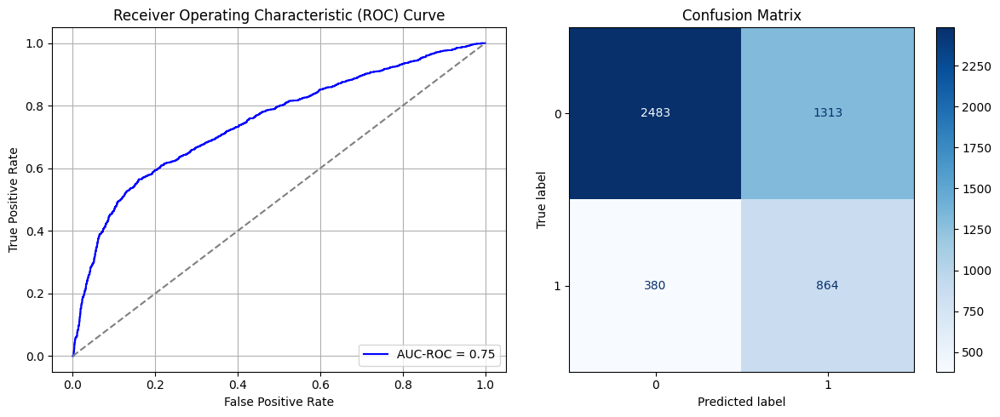

Best threshold based on F1-score: 0.6199713945388794
False Negative Rate: 0.3054662379421222
Time elapsed (performance): 0.7357732540003781
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6369 - loss: 0.6665 - val_AUC: 0.7003 - val_loss: 0.6252
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7121 - loss: 0.6111 - val_AUC: 0.7211 - val_loss: 0.6094
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7264 - loss: 0.6012 - val_AUC: 0.7371 - val_loss: 0.5978
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7418 - loss: 0.5859 - val_AUC: 0.7411 - val_loss: 0.5948
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7448 - loss: 0.5818 - val_AUC: 0.7453 - val_loss: 0.5962
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7479 - loss: 0.5844 - val_AUC: 0.7494 - val_loss: 0.5897
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7556 - loss: 0.5812 - val_AUC: 0.7526 - val_loss: 0.5861
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7482 - loss: 0.5781 - val_AUC: 0.7556 - val_loss: 0.5828
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7623 -

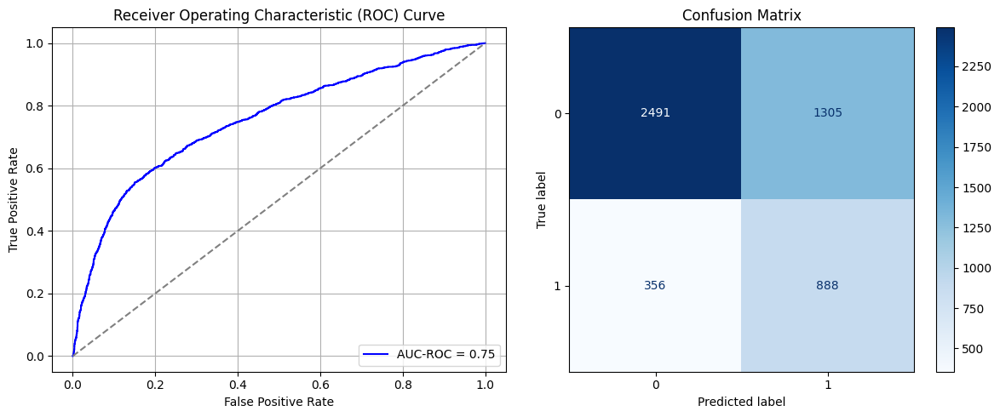

Best threshold based on F1-score: 0.9969264268875122
False Negative Rate: 0.2861736334405145
Time elapsed (performance): 0.7281496709993007
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6022 - loss: 0.6756 - val_AUC: 0.7017 - val_loss: 0.6180
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6974 - loss: 0.6214 - val_AUC: 0.7166 - val_loss: 0.6087
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7115 - loss: 0.6124 - val_AUC: 0.7298 - val_loss: 0.5927
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.5988 - val_AUC: 0.7381 - val_loss: 0.5920
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7443 - loss: 0.5917 - val_AUC: 0.7448 - val_loss: 0.5872
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.5944 - val_AUC: 0.7447 - val_loss: 0.5818
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7373 - loss: 0.5944 - val_AUC: 0.7459 - val_loss: 0.5918
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7384 - loss: 0.5952 - val_AUC: 0.7544 - val_loss: 0.5773
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7516 -

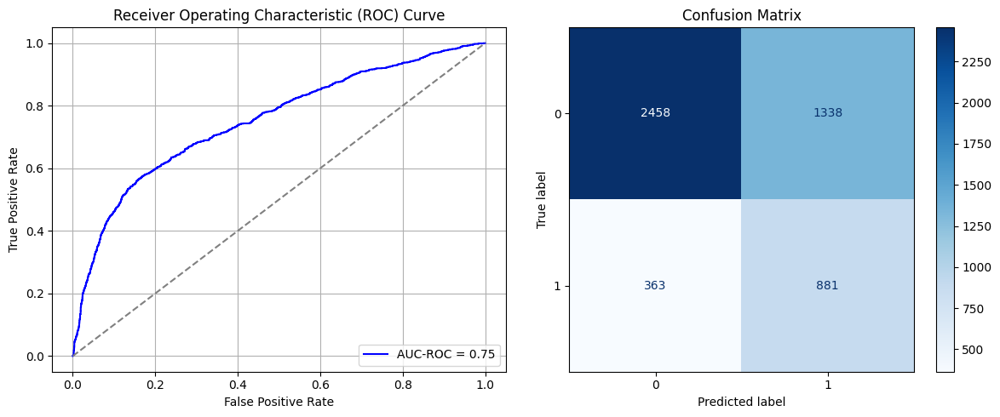

Best threshold based on F1-score: 0.997234046459198
False Negative Rate: 0.29180064308681675
Time elapsed (performance): 0.7317909379999037
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6709 - loss: 0.6585 - val_AUC: 0.7072 - val_loss: 0.6267
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7246 - loss: 0.6013 - val_AUC: 0.7405 - val_loss: 0.5985
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7357 - loss: 0.5923 - val_AUC: 0.7550 - val_loss: 0.5900
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7386 - loss: 0.5892 - val_AUC: 0.7558 - val_loss: 0.5844
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7557 - loss: 0.5762 - val_AUC: 0.7618 - val_loss: 0.5907
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.5881 - val_AUC: 0.7589 - val_loss: 0.5901
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7425 - loss: 0.5858 - val_AUC: 0.7677 - val_loss: 0.5771
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7570 - loss: 0.5782 - val_AUC: 0.7680 - val_loss: 0.5775
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7527 -

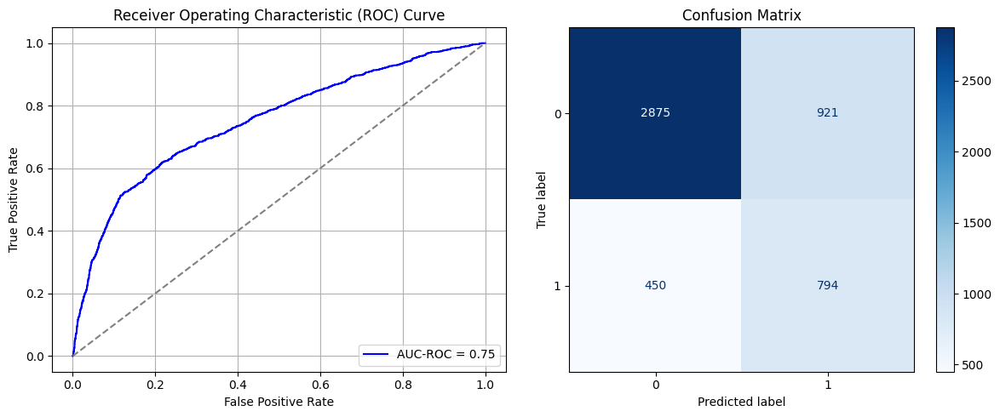

Best threshold based on F1-score: 0.9992807507514954
False Negative Rate: 0.3617363344051447
Time elapsed (performance): 0.7306578050001917
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6720 - loss: 0.6579 - val_AUC: 0.7220 - val_loss: 0.6062
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.6095 - val_AUC: 0.7354 - val_loss: 0.5889
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7397 - loss: 0.5883 - val_AUC: 0.7522 - val_loss: 0.5834
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7318 - loss: 0.5963 - val_AUC: 0.7465 - val_loss: 0.5824
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7465 - loss: 0.5873 - val_AUC: 0.7535 - val_loss: 0.5756
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7550 - loss: 0.5783 - val_AUC: 0.7600 - val_loss: 0.5714
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7506 - loss: 0.5808 - val_AUC: 0.7672 - val_loss: 0.5771
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7553 - loss: 0.5800 - val_AUC: 0.7697 - val_loss: 0.5698
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7433 -

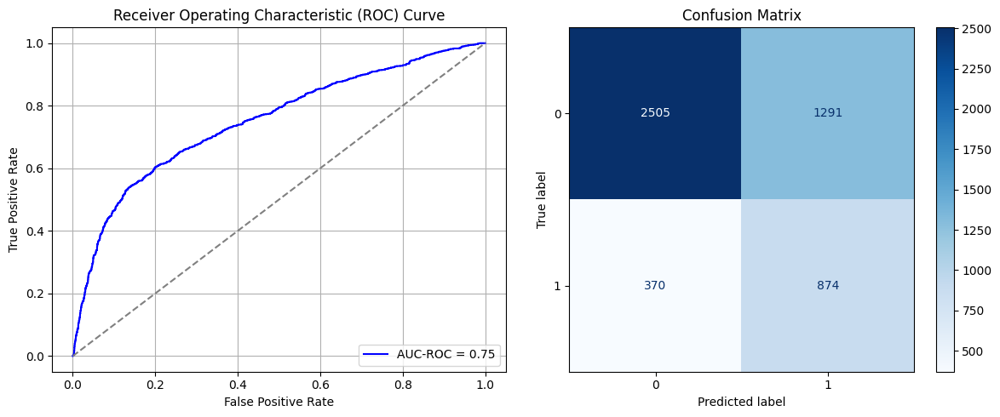

Best threshold based on F1-score: 0.9986613988876343
False Negative Rate: 0.297427652733119
Time elapsed (performance): 1.082998874999248


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


In [64]:
times = 20

Training_time = []
FPR = []
TPR = []
FNR = []
TNR = []
TL_time = []


for i in range(times):
    data_S_maj_rus = data_S_majority.sample(n=undersample_size, replace=False)
    data_S_SRS_RUS = pd.concat([data_S_maj_rus, data_S_minority])
    X_S_SRS = data_S_SRS_RUS.iloc[:, :-1]
    y_S_SRS = data_S_SRS_RUS.iloc[:, -1]
    X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
    model_SRS = create_dnn_model(X_S_train.shape[1])
    result_SRS = train_and_evaluate(model_SRS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
    result_TL_SRS = Transductive_TL(model_SRS, X_T_full, y_T_full, "Target")

    Training_time.append(result_SRS)
    FPR.append(result_TL_SRS[0])
    TPR.append(result_TL_SRS[1])
    FNR.append(result_TL_SRS[2])
    TNR.append(result_TL_SRS[3])
    TL_time.append(result_TL_SRS[4])

ParamFit = pd.DataFrame([Training_time, FPR, TPR, FNR, TNR, TL_time]).T
ParamFit.columns=['Source time', 'FPR', 'TPR', 'FNR', 'TNR', 'Target time']
# print(ParamFit)

In [65]:
print(ParamFit)
ParamFit.to_csv('SRS_RUS.csv')

    Source time       FPR       TPR       FNR       TNR  Target time
0     12.069791  0.274236  0.725764  0.341640  0.658360     0.728197
1     12.054968  0.629874  0.370126  0.129421  0.870579     0.691773
2     11.667141  0.320074  0.679926  0.311897  0.688103     0.698328
3     12.065193  0.254478  0.745522  0.356109  0.643891     0.711254
4     10.612787  0.488145  0.511855  0.203376  0.796624     0.732653
5     12.772214  0.176502  0.823498  0.415595  0.584405     0.725531
6     12.759944  0.326660  0.673340  0.317524  0.682476     0.721250
7     14.156938  0.271602  0.728398  0.343248  0.656752     1.211283
8     13.507052  0.381454  0.618546  0.270900  0.729100     0.741120
9     13.730920  0.376712  0.623288  0.278939  0.721061     0.722669
10    13.806476  0.416491  0.583509  0.258039  0.741961     0.733460
11    12.292728  0.232877  0.767123  0.370579  0.629421     0.718004
12    13.842021  0.321391  0.678609  0.311093  0.688907     0.733260
13    12.352611  0.206270  0.79373

## Simple Random Sampling with Replacement:

In [66]:
data_S
data_S_majority = data_S[data_S['Y'].isin([0])]
data_S_minority = data_S[data_S['Y'].isin([1])]

undersample_size = data_S_minority['Y'].size
oversample_size = data_S_majority['Y'].size

print(undersample_size)
print(oversample_size)

5366
19249


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6593 - loss: 0.6617 - val_AUC: 0.7067 - val_loss: 0.6187
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6993 - loss: 0.6176 - val_AUC: 0.7368 - val_loss: 0.6005
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7287 - loss: 0.5976 - val_AUC: 0.7458 - val_loss: 0.5868
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7372 - loss: 0.5938 - val_AUC: 0.7487 - val_loss: 0.5850
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7354 - loss: 0.5922 - val_AUC: 0.7510 - val_loss: 0.5827
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7269 - loss: 0.5995 - val_AUC: 0.7544 - val_loss: 0.5790
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7503 - loss: 0.5783 - val_AUC: 0.7615 - val_loss: 0.5775
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7439 - loss: 0.5905 - val_AUC: 0.7575 - val_loss: 0.5759
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7450 -

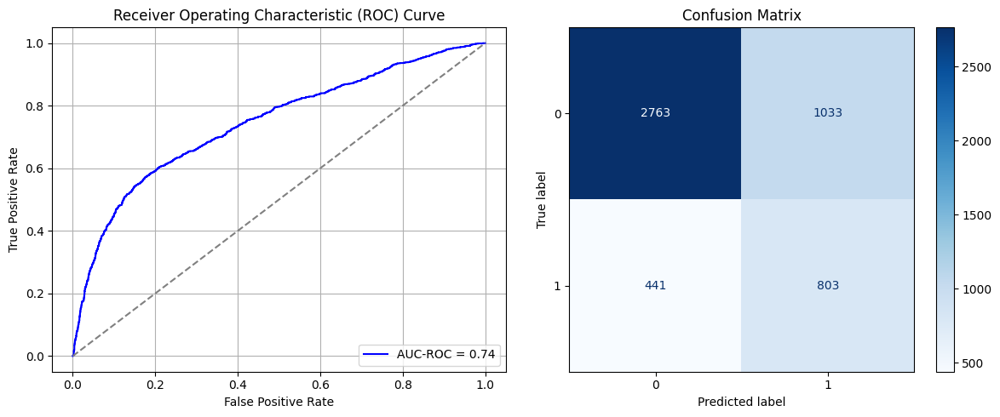

Best threshold based on F1-score: 0.9985889196395874
False Negative Rate: 0.3545016077170418
Time elapsed (performance): 1.2762404309996782
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6251 - loss: 0.6700 - val_AUC: 0.7035 - val_loss: 0.6195
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7187 - loss: 0.6087 - val_AUC: 0.7292 - val_loss: 0.6027
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7372 - loss: 0.5916 - val_AUC: 0.7402 - val_loss: 0.5920
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7431 - loss: 0.5899 - val_AUC: 0.7445 - val_loss: 0.5910
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7499 - loss: 0.5823 - val_AUC: 0.7471 - val_loss: 0.5865
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7369 - loss: 0.5916 - val_AUC: 0.7486 - val_loss: 0.5867
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7452 - loss: 0.5818 - val_AUC: 0.7510 - val_loss: 0.5815
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7466 - loss: 0.5838 - val_AUC: 0.7529 - val_loss: 0.5801
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7470 -

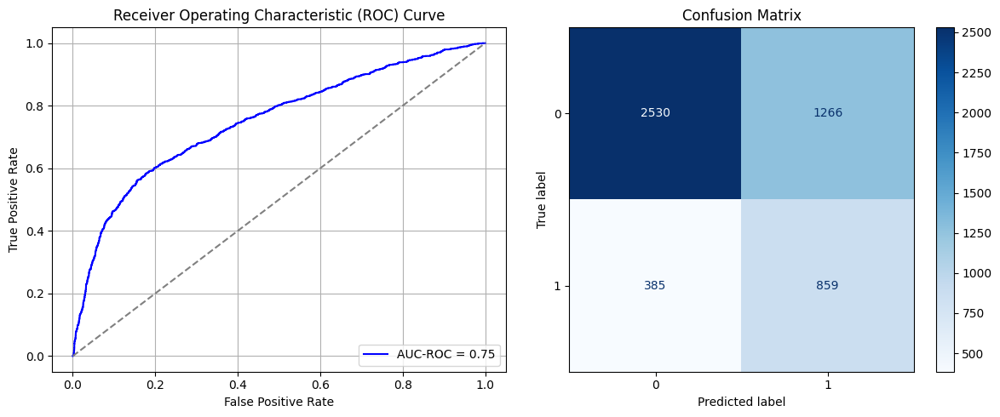

Best threshold based on F1-score: 0.9992697834968567
False Negative Rate: 0.3094855305466238
Time elapsed (performance): 0.7844328999999561
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6293 - loss: 0.6670 - val_AUC: 0.7158 - val_loss: 0.6266
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7074 - loss: 0.6183 - val_AUC: 0.7361 - val_loss: 0.5943
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7280 - loss: 0.6015 - val_AUC: 0.7556 - val_loss: 0.5826
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7398 - loss: 0.5884 - val_AUC: 0.7598 - val_loss: 0.5761
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7491 - loss: 0.5832 - val_AUC: 0.7660 - val_loss: 0.5753
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.5832 - val_AUC: 0.7643 - val_loss: 0.5719
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7600 - loss: 0.5727 - val_AUC: 0.7629 - val_loss: 0.5723
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.5823 - val_AUC: 0.7712 - val_loss: 0.5682
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7566 -

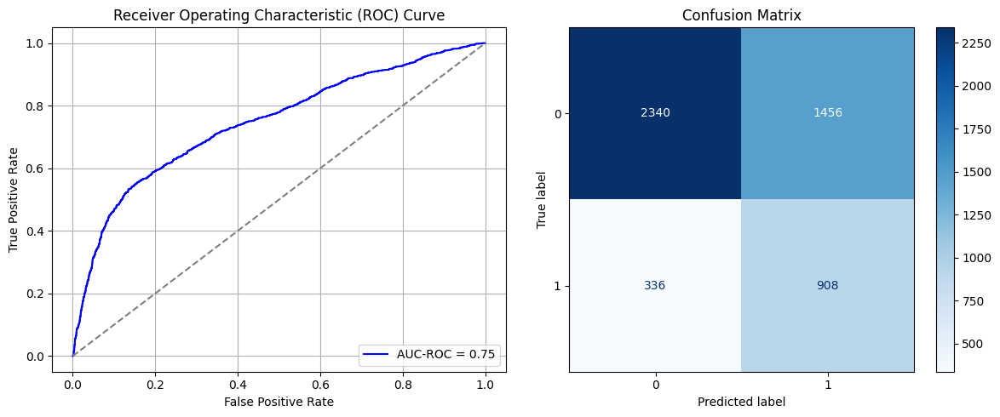

Best threshold based on F1-score: 0.9980977177619934
False Negative Rate: 0.27009646302250806
Time elapsed (performance): 0.7186559849997138
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6552 - loss: 0.6591 - val_AUC: 0.7141 - val_loss: 0.6159
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7139 - loss: 0.6088 - val_AUC: 0.7349 - val_loss: 0.6015
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7309 - loss: 0.5982 - val_AUC: 0.7517 - val_loss: 0.5954
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7431 - loss: 0.5871 - val_AUC: 0.7494 - val_loss: 0.5901
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7495 - loss: 0.5816 - val_AUC: 0.7523 - val_loss: 0.5860
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7488 - loss: 0.5794 - val_AUC: 0.7570 - val_loss: 0.5835
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7547 - loss: 0.5797 - val_AUC: 0.7570 - val_loss: 0.5837
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7618 - loss: 0.5691 - val_AUC: 0.7579 - val_loss: 0.5826
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7594 -

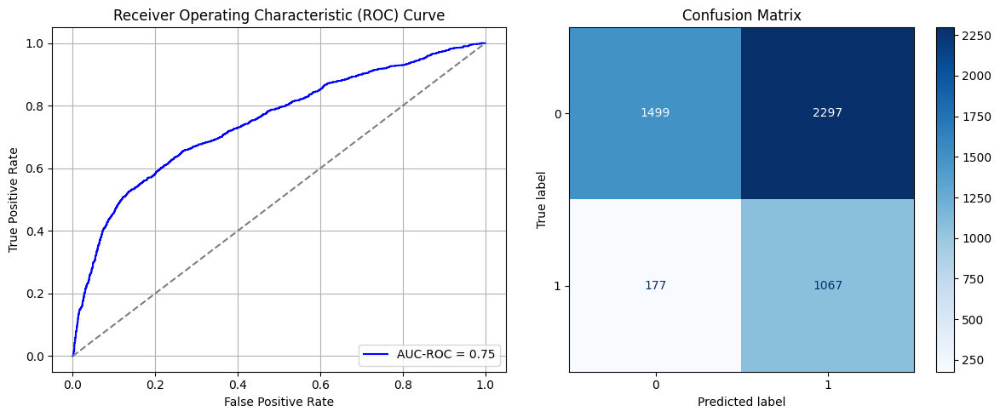

Best threshold based on F1-score: 0.9993078708648682
False Negative Rate: 0.1422829581993569
Time elapsed (performance): 0.7224402860001646
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6358 - loss: 0.6713 - val_AUC: 0.7031 - val_loss: 0.6212
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7045 - loss: 0.6170 - val_AUC: 0.7296 - val_loss: 0.6073
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7264 - loss: 0.6014 - val_AUC: 0.7494 - val_loss: 0.5891
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7352 - loss: 0.5924 - val_AUC: 0.7563 - val_loss: 0.5847
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7367 - loss: 0.5891 - val_AUC: 0.7605 - val_loss: 0.5803
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7386 - loss: 0.5901 - val_AUC: 0.7608 - val_loss: 0.5788
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7528 - loss: 0.5777 - val_AUC: 0.7643 - val_loss: 0.5768
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7529 - loss: 0.5784 - val_AUC: 0.7653 - val_loss: 0.5777
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7547 -

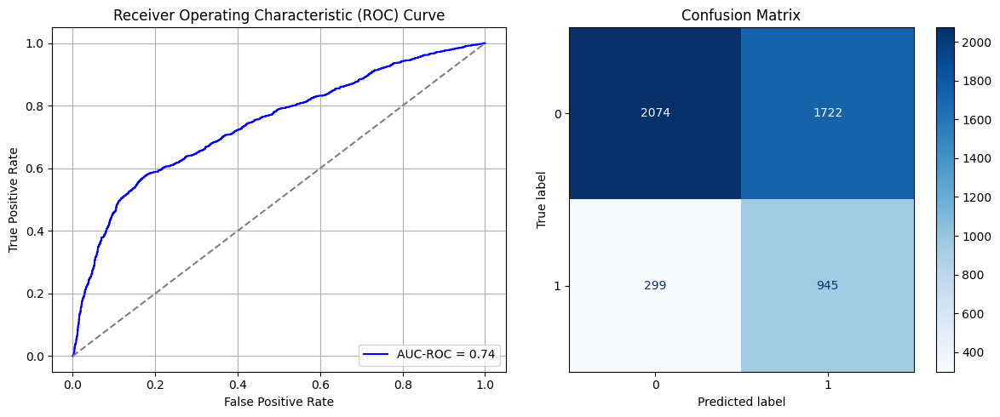

Best threshold based on F1-score: 0.9974043965339661
False Negative Rate: 0.24035369774919615
Time elapsed (performance): 0.7724733770000967
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6253 - loss: 0.6691 - val_AUC: 0.7017 - val_loss: 0.6235
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7013 - loss: 0.6195 - val_AUC: 0.7310 - val_loss: 0.6042
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7381 - loss: 0.5937 - val_AUC: 0.7426 - val_loss: 0.5984
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7479 - loss: 0.5814 - val_AUC: 0.7447 - val_loss: 0.5948
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7434 - loss: 0.5889 - val_AUC: 0.7449 - val_loss: 0.6051
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7568 - loss: 0.5781 - val_AUC: 0.7518 - val_loss: 0.6031
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7594 - loss: 0.5772 - val_AUC: 0.7518 - val_loss: 0.5908
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7584 - loss: 0.5744 - val_AUC: 0.7487 - val_loss: 0.5911
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7553 -

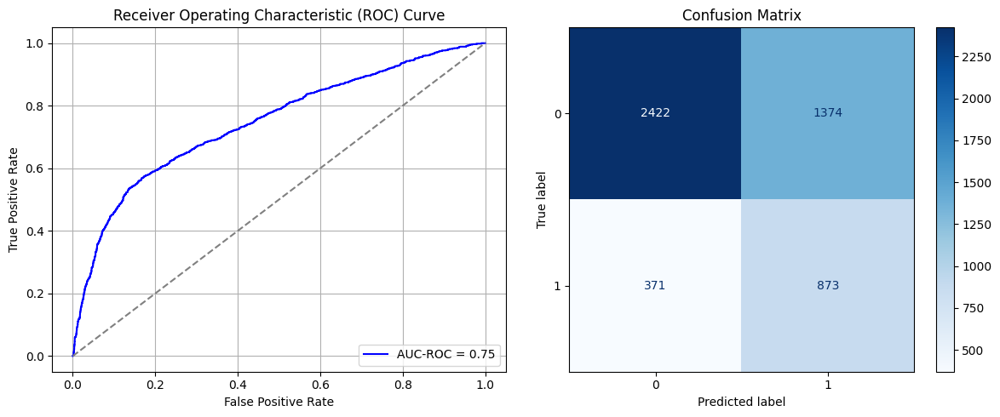

Best threshold based on F1-score: 0.9988818168640137
False Negative Rate: 0.2982315112540193
Time elapsed (performance): 0.7703818109994245
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6104 - loss: 0.6706 - val_AUC: 0.7155 - val_loss: 0.6091
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7134 - loss: 0.6092 - val_AUC: 0.7352 - val_loss: 0.5938
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7318 - loss: 0.5953 - val_AUC: 0.7577 - val_loss: 0.5775
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7495 - loss: 0.5803 - val_AUC: 0.7564 - val_loss: 0.5728
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7377 - loss: 0.5911 - val_AUC: 0.7645 - val_loss: 0.5655
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7411 - loss: 0.5871 - val_AUC: 0.7667 - val_loss: 0.5666
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7434 - loss: 0.5877 - val_AUC: 0.7675 - val_loss: 0.5641
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7515 - loss: 0.5783 - val_AUC: 0.7704 - val_loss: 0.5674
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7598 -

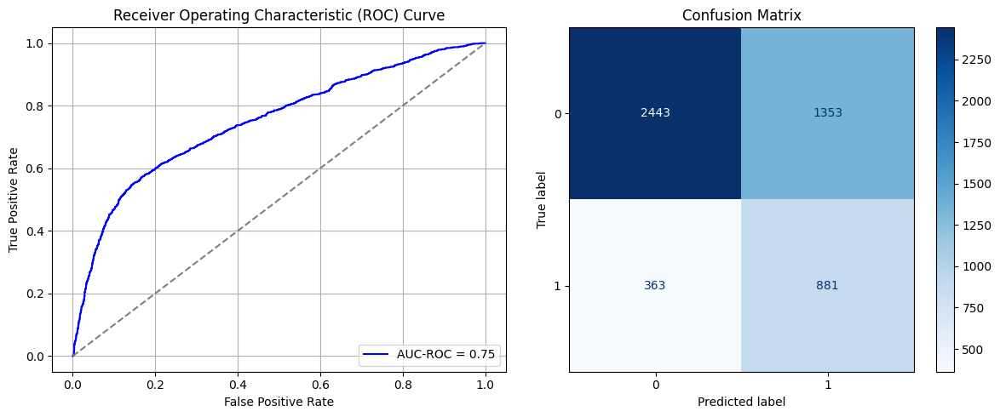

Best threshold based on F1-score: 0.6810793876647949
False Negative Rate: 0.29180064308681675
Time elapsed (performance): 1.2945188720004808
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6353 - loss: 0.6661 - val_AUC: 0.7123 - val_loss: 0.6169
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7077 - loss: 0.6195 - val_AUC: 0.7268 - val_loss: 0.6034
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7102 - loss: 0.6148 - val_AUC: 0.7455 - val_loss: 0.5978
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7274 - loss: 0.5997 - val_AUC: 0.7484 - val_loss: 0.5879
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7373 - loss: 0.5931 - val_AUC: 0.7467 - val_loss: 0.5868
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7323 - loss: 0.6008 - val_AUC: 0.7543 - val_loss: 0.5821
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7493 - loss: 0.5861 - val_AUC: 0.7508 - val_loss: 0.5844
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7520 - loss: 0.5827 - val_AUC: 0.7581 - val_loss: 0.5785
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7454 -

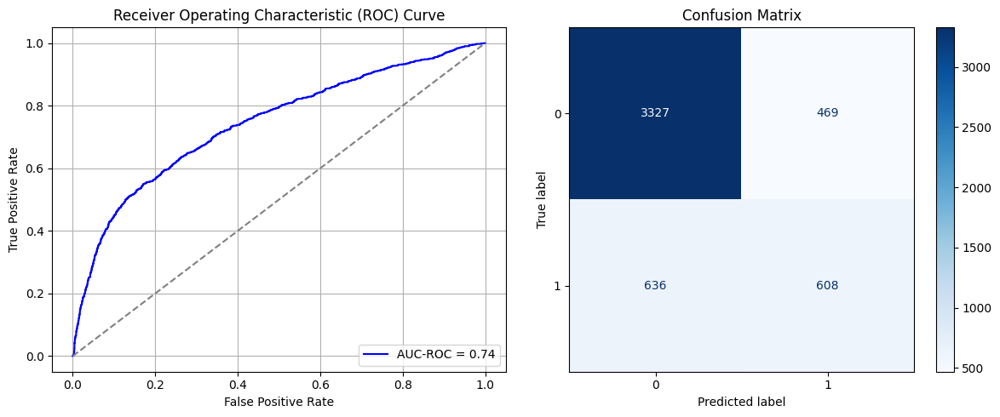

Best threshold based on F1-score: 0.9937373995780945
False Negative Rate: 0.5112540192926045
Time elapsed (performance): 0.7146650350005075
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6312 - loss: 0.6653 - val_AUC: 0.7095 - val_loss: 0.6103
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7116 - loss: 0.6107 - val_AUC: 0.7335 - val_loss: 0.5871
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7325 - loss: 0.5953 - val_AUC: 0.7485 - val_loss: 0.5784
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7454 - loss: 0.5847 - val_AUC: 0.7542 - val_loss: 0.5734
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7429 - loss: 0.5900 - val_AUC: 0.7601 - val_loss: 0.5671
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7485 - loss: 0.5776 - val_AUC: 0.7621 - val_loss: 0.5665
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7585 - loss: 0.5754 - val_AUC: 0.7643 - val_loss: 0.5629
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7539 - loss: 0.5807 - val_AUC: 0.7658 - val_loss: 0.5622
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7645 -

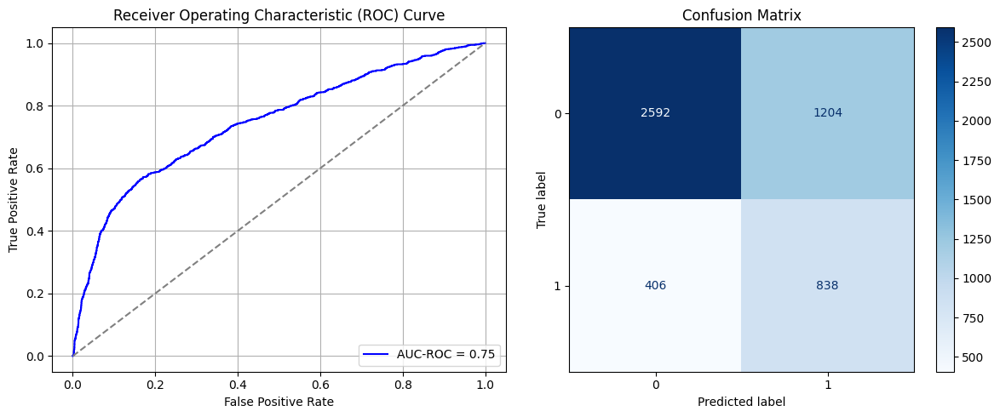

Best threshold based on F1-score: 0.9995238780975342
False Negative Rate: 0.32636655948553056
Time elapsed (performance): 0.7681623389999004
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.5921 - loss: 0.6773 - val_AUC: 0.7113 - val_loss: 0.6186
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7136 - loss: 0.6132 - val_AUC: 0.7322 - val_loss: 0.6011
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7231 - loss: 0.6091 - val_AUC: 0.7425 - val_loss: 0.5919
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5982 - val_AUC: 0.7488 - val_loss: 0.5883
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7421 - loss: 0.5908 - val_AUC: 0.7488 - val_loss: 0.5877
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7450 - loss: 0.5874 - val_AUC: 0.7525 - val_loss: 0.5834
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7511 - loss: 0.5823 - val_AUC: 0.7546 - val_loss: 0.5862
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7518 - loss: 0.5839 - val_AUC: 0.7593 - val_loss: 0.5785
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 -

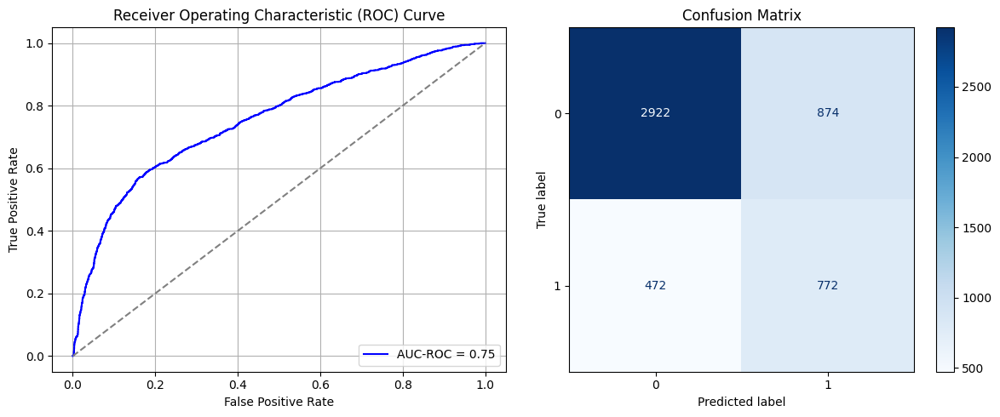

Best threshold based on F1-score: 0.9977624416351318
False Negative Rate: 0.37942122186495175
Time elapsed (performance): 0.7264357029998791
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6632 - loss: 0.6621 - val_AUC: 0.7042 - val_loss: 0.6176
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7116 - loss: 0.6118 - val_AUC: 0.7250 - val_loss: 0.6026
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7178 - loss: 0.6052 - val_AUC: 0.7340 - val_loss: 0.5957
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7249 - loss: 0.6007 - val_AUC: 0.7484 - val_loss: 0.5903
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7333 - loss: 0.5955 - val_AUC: 0.7552 - val_loss: 0.5822
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7352 - loss: 0.5970 - val_AUC: 0.7572 - val_loss: 0.5778
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7399 - loss: 0.5890 - val_AUC: 0.7619 - val_loss: 0.5762
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7464 - loss: 0.5873 - val_AUC: 0.7662 - val_loss: 0.5740
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7452 -

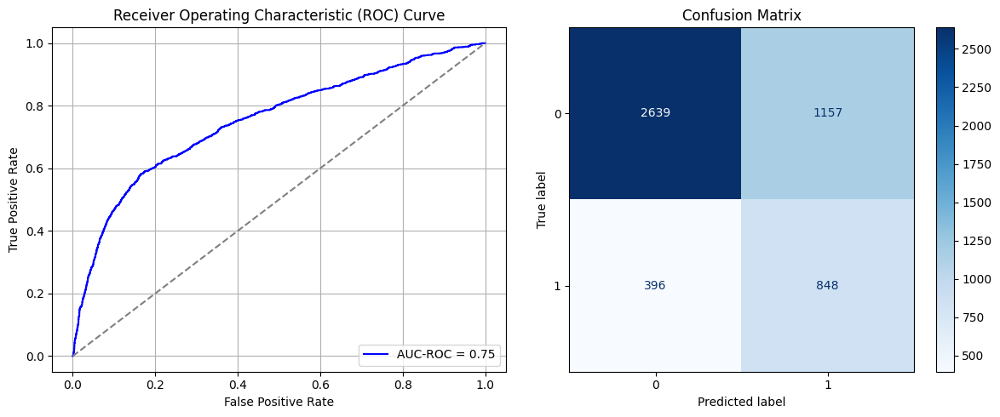

Best threshold based on F1-score: 0.996573805809021
False Negative Rate: 0.3183279742765273
Time elapsed (performance): 0.735833587000343
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6572 - loss: 0.6621 - val_AUC: 0.6974 - val_loss: 0.6307
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7169 - loss: 0.6069 - val_AUC: 0.7185 - val_loss: 0.6068
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7199 - loss: 0.6031 - val_AUC: 0.7231 - val_loss: 0.6014
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7362 - loss: 0.5875 - val_AUC: 0.7290 - val_loss: 0.6031
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7390 - loss: 0.5857 - val_AUC: 0.7314 - val_loss: 0.5950
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.5874 - val_AUC: 0.7346 - val_loss: 0.5942
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7441 - loss: 0.5822 - val_AUC: 0.7341 - val_loss: 0.6064
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7370 - loss: 0.5897 - val_AUC: 0.7476 - val_loss: 0.5903
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7507 -

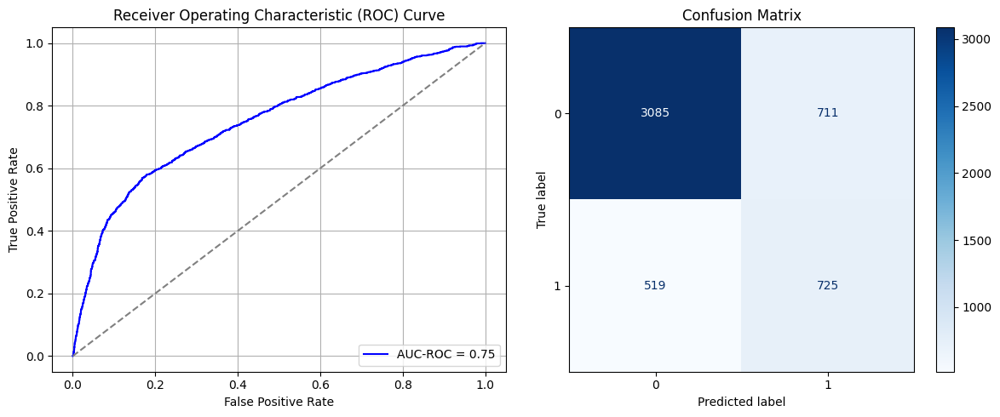

Best threshold based on F1-score: 0.9988022446632385
False Negative Rate: 0.4172025723472669
Time elapsed (performance): 0.7252449119996527
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6448 - loss: 0.6636 - val_AUC: 0.7061 - val_loss: 0.6191
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7132 - loss: 0.6053 - val_AUC: 0.7269 - val_loss: 0.5981
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7385 - loss: 0.5844 - val_AUC: 0.7409 - val_loss: 0.5901
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7344 - loss: 0.5908 - val_AUC: 0.7431 - val_loss: 0.5858
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7425 - loss: 0.5846 - val_AUC: 0.7466 - val_loss: 0.5848
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7301 - loss: 0.5959 - val_AUC: 0.7500 - val_loss: 0.5804
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7589 - loss: 0.5724 - val_AUC: 0.7500 - val_loss: 0.5812
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7603 - loss: 0.5746 - val_AUC: 0.7556 - val_loss: 0.5764
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7587 -

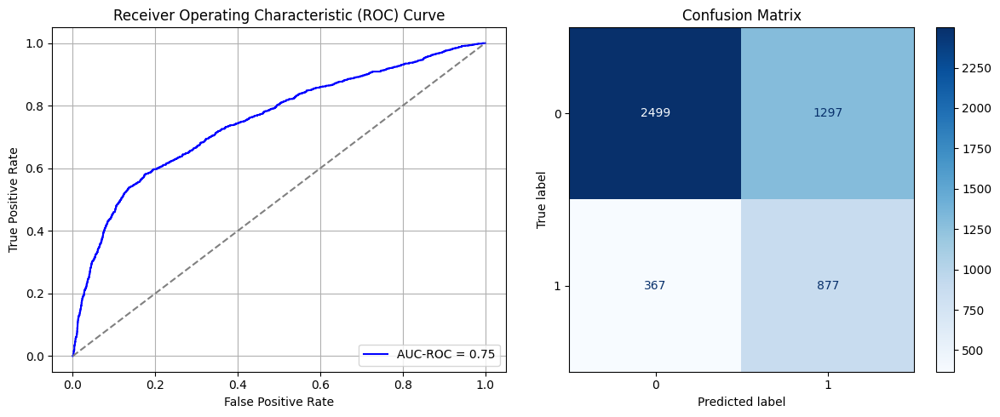

Best threshold based on F1-score: 0.9995461106300354
False Negative Rate: 0.295016077170418
Time elapsed (performance): 0.7534410600001138
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6567 - loss: 0.6645 - val_AUC: 0.7090 - val_loss: 0.6177
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6944 - loss: 0.6236 - val_AUC: 0.7388 - val_loss: 0.5988
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.6059 - val_AUC: 0.7427 - val_loss: 0.5911
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7338 - loss: 0.5975 - val_AUC: 0.7493 - val_loss: 0.5893
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7380 - loss: 0.5919 - val_AUC: 0.7525 - val_loss: 0.5845
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7448 - loss: 0.5887 - val_AUC: 0.7538 - val_loss: 0.5852
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7540 - loss: 0.5799 - val_AUC: 0.7487 - val_loss: 0.5899
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7588 - loss: 0.5775 - val_AUC: 0.7619 - val_loss: 0.5807
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7543 -

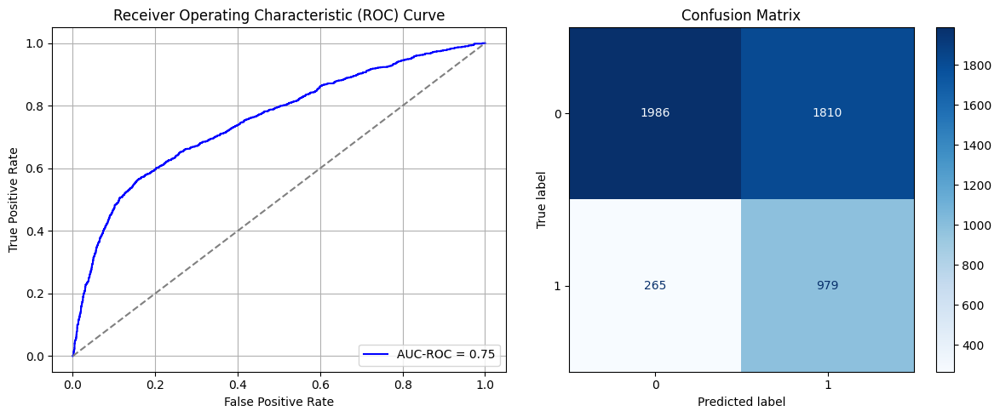

Best threshold based on F1-score: 0.9988294243812561
False Negative Rate: 0.21302250803858522
Time elapsed (performance): 0.7618948070003171
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6141 - loss: 0.6699 - val_AUC: 0.6976 - val_loss: 0.6235
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7056 - loss: 0.6167 - val_AUC: 0.7195 - val_loss: 0.6063
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7228 - loss: 0.6034 - val_AUC: 0.7417 - val_loss: 0.5949
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7400 - loss: 0.5854 - val_AUC: 0.7417 - val_loss: 0.5924
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5915 - val_AUC: 0.7493 - val_loss: 0.5893
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7483 - loss: 0.5811 - val_AUC: 0.7500 - val_loss: 0.5886
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7465 - loss: 0.5826 - val_AUC: 0.7527 - val_loss: 0.5852
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7586 - loss: 0.5790 - val_AUC: 0.7618 - val_loss: 0.5811
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7626 -

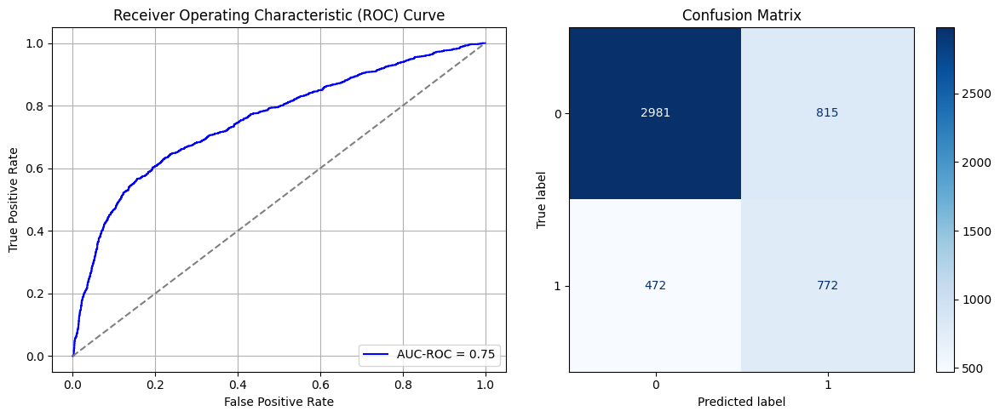

Best threshold based on F1-score: 0.557870090007782
False Negative Rate: 0.37942122186495175
Time elapsed (performance): 0.775874675000523
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6212 - loss: 0.6709 - val_AUC: 0.7232 - val_loss: 0.6221
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.6052 - val_AUC: 0.7559 - val_loss: 0.5934
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7454 - loss: 0.5848 - val_AUC: 0.7616 - val_loss: 0.5863
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7502 - loss: 0.5821 - val_AUC: 0.7637 - val_loss: 0.5818
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7488 - loss: 0.5830 - val_AUC: 0.7659 - val_loss: 0.5786
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7511 - loss: 0.5768 - val_AUC: 0.7684 - val_loss: 0.5813
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7521 - loss: 0.5779 - val_AUC: 0.7716 - val_loss: 0.5776
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7558 - loss: 0.5764 - val_AUC: 0.7728 - val_loss: 0.5713
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7589 -

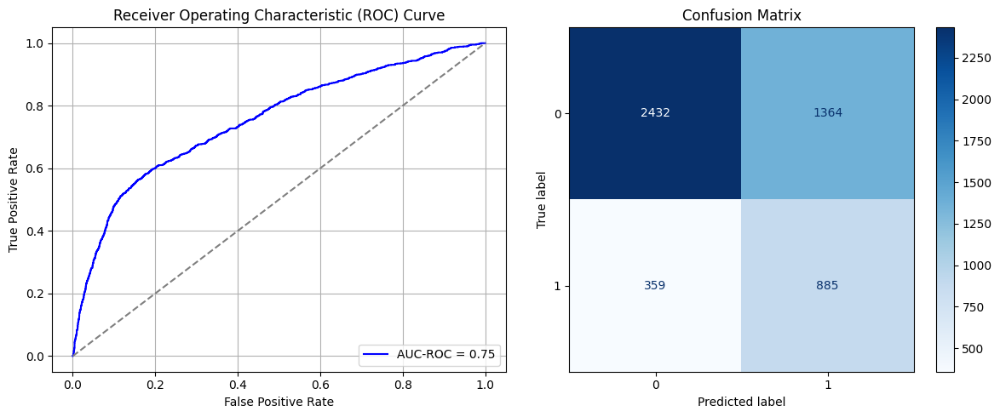

Best threshold based on F1-score: 0.9986398220062256
False Negative Rate: 0.28858520900321544
Time elapsed (performance): 0.7455748830006996
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6383 - loss: 0.6684 - val_AUC: 0.6976 - val_loss: 0.6207
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7043 - loss: 0.6195 - val_AUC: 0.7296 - val_loss: 0.5972
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.5978 - val_AUC: 0.7411 - val_loss: 0.5934
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7436 - loss: 0.5927 - val_AUC: 0.7514 - val_loss: 0.5862
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7440 - loss: 0.5884 - val_AUC: 0.7545 - val_loss: 0.5773
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7548 - loss: 0.5782 - val_AUC: 0.7542 - val_loss: 0.5773
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7432 - loss: 0.5908 - val_AUC: 0.7653 - val_loss: 0.5699
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7517 - loss: 0.5860 - val_AUC: 0.7680 - val_loss: 0.5686
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7554 -

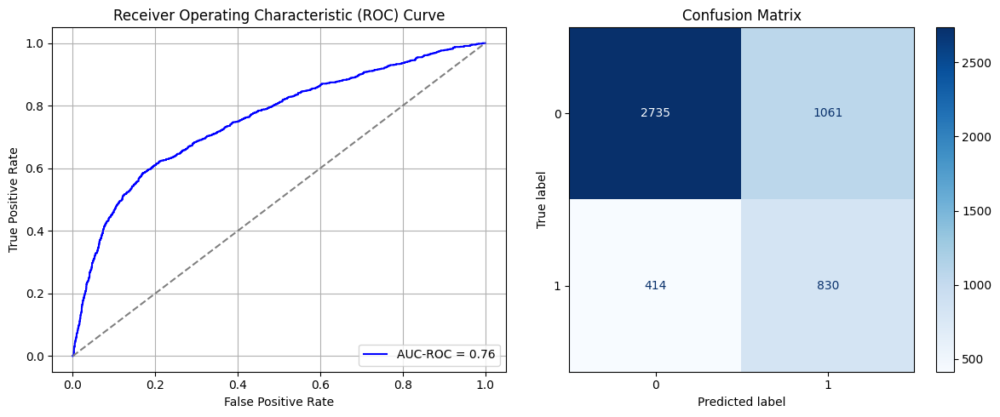

Best threshold based on F1-score: 0.998477041721344
False Negative Rate: 0.3327974276527331
Time elapsed (performance): 1.0935980720005318
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6380 - loss: 0.6656 - val_AUC: 0.7029 - val_loss: 0.6235
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.6119 - val_AUC: 0.7236 - val_loss: 0.6032
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7365 - loss: 0.5924 - val_AUC: 0.7368 - val_loss: 0.6000
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7337 - loss: 0.5949 - val_AUC: 0.7401 - val_loss: 0.5934
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5953 - val_AUC: 0.7365 - val_loss: 0.5913
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.5894 - val_AUC: 0.7460 - val_loss: 0.5853
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7488 - loss: 0.5829 - val_AUC: 0.7487 - val_loss: 0.5857
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7526 - loss: 0.5777 - val_AUC: 0.7545 - val_loss: 0.5796
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7518 -

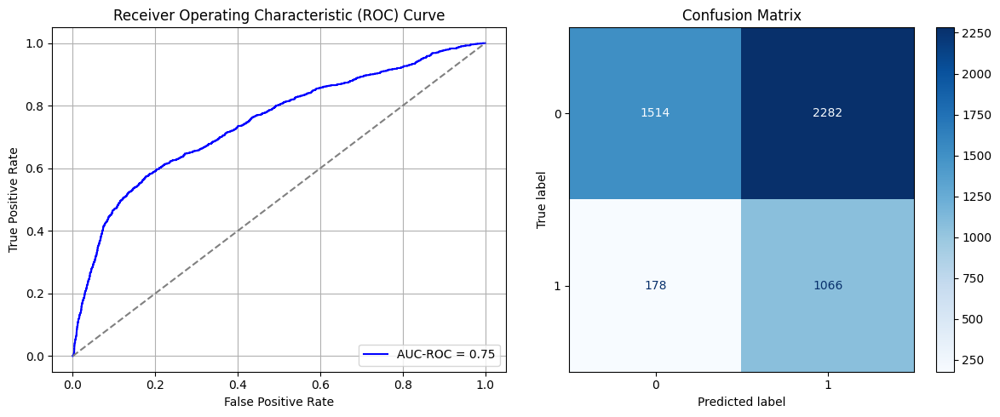

Best threshold based on F1-score: 0.9994166493415833
False Negative Rate: 0.14308681672025725
Time elapsed (performance): 0.782204092000029
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6411 - loss: 0.6683 - val_AUC: 0.6988 - val_loss: 0.6259
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7050 - loss: 0.6160 - val_AUC: 0.7141 - val_loss: 0.6142
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7151 - loss: 0.6031 - val_AUC: 0.7276 - val_loss: 0.6041
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7402 - loss: 0.5912 - val_AUC: 0.7339 - val_loss: 0.6050
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7385 - loss: 0.5888 - val_AUC: 0.7423 - val_loss: 0.5993
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7383 - loss: 0.5889 - val_AUC: 0.7417 - val_loss: 0.5981
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7469 - loss: 0.5806 - val_AUC: 0.7492 - val_loss: 0.5919
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7465 - loss: 0.5845 - val_AUC: 0.7491 - val_loss: 0.5904
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7487 -

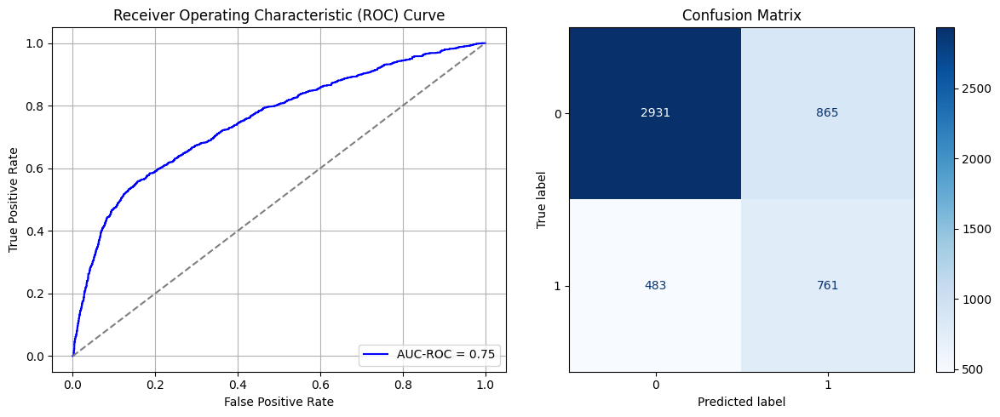

Best threshold based on F1-score: 0.9996761679649353
False Negative Rate: 0.3882636655948553
Time elapsed (performance): 0.7502114970002367
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5832 - loss: 0.6772 - val_AUC: 0.7008 - val_loss: 0.6213
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6994 - loss: 0.6174 - val_AUC: 0.7248 - val_loss: 0.6119
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7282 - loss: 0.6005 - val_AUC: 0.7458 - val_loss: 0.5969
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.6014 - val_AUC: 0.7466 - val_loss: 0.5922
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7527 - loss: 0.5828 - val_AUC: 0.7512 - val_loss: 0.5892
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7454 - loss: 0.5886 - val_AUC: 0.7499 - val_loss: 0.5933
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7631 - loss: 0.5799 - val_AUC: 0.7556 - val_loss: 0.5866
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7455 - loss: 0.5885 - val_AUC: 0.7565 - val_loss: 0.5829
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7551 -

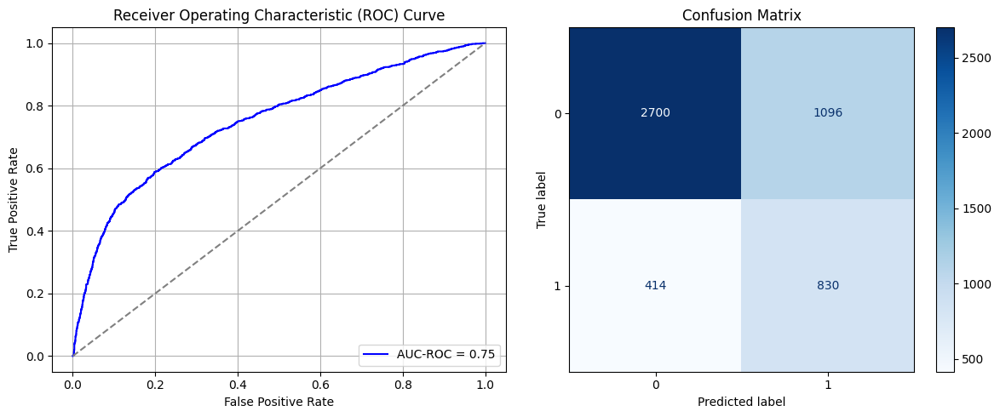

Best threshold based on F1-score: 0.9979273080825806
False Negative Rate: 0.3327974276527331
Time elapsed (performance): 0.7517437040005461


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


In [68]:
times = 20

Training_time = []
FPR = []
TPR = []
FNR = []
TNR = []
TL_time = []


for i in range(times):
    data_S_maj_rus = data_S_majority.sample(n=undersample_size, replace=True)
    data_S_SRSwR_RUS = pd.concat([data_S_maj_rus, data_S_minority])
    X_S_SRSwR = data_S_SRSwR_RUS.iloc[:, :-1]
    y_S_SRSwR = data_S_SRSwR_RUS.iloc[:, -1]
    X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRSwR, y_S_SRSwR, test_size=0.20, random_state=0)
    model_SRSwR = create_dnn_model(X_S_train.shape[1])
    result_SRSwR = train_and_evaluate(model_SRSwR, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
    result_TL_SRSwR = Transductive_TL(model_SRSwR, X_T_full, y_T_full, "Target")

    Training_time.append(result_SRSwR)
    FPR.append(result_TL_SRSwR[0])
    TNR.append(result_TL_SRSwR[1])
    FNR.append(result_TL_SRSwR[2])
    TPR.append(result_TL_SRSwR[3])
    TL_time.append(result_TL_SRSwR[4])

ParamFit = pd.DataFrame([Training_time, FPR, TNR, FNR, TPR, TL_time]).T
ParamFit.columns=['Source time', 'FPR', 'TNR', 'FNR', 'TPR', 'Target time']
# print(ParamFit)

In [69]:
print(ParamFit)
ParamFit.to_csv('SRSwR_RUS.csv')

    Source time       FPR       TNR       FNR       TPR  Target time
0     15.616845  0.272129  0.727871  0.354502  0.645498     1.276240
1     13.819023  0.333509  0.666491  0.309486  0.690514     0.784433
2     13.678866  0.383562  0.616438  0.270096  0.729904     0.718656
3     13.982204  0.605111  0.394889  0.142283  0.857717     0.722440
4     13.008501  0.453635  0.546365  0.240354  0.759646     0.772473
5     13.172936  0.361960  0.638040  0.298232  0.701768     0.770382
6     14.295191  0.356428  0.643572  0.291801  0.708199     1.294519
7     13.243116  0.123551  0.876449  0.511254  0.488746     0.714665
8     13.977184  0.317176  0.682824  0.326367  0.673633     0.768162
9     13.703917  0.230242  0.769758  0.379421  0.620579     0.726436
10    11.861404  0.304795  0.695205  0.318328  0.681672     0.735834
11    13.259114  0.187302  0.812698  0.417203  0.582797     0.725245
12    13.987451  0.341675  0.658325  0.295016  0.704984     0.753441
13    18.041569  0.476818  0.52318

## Systematic Sampling:

First, we select a single systematic sample from the majority class, in which $k = \frac{N_0}{N_1}$, where $N_0$ is the majority class size in the source domain and $N_1$ is the minority class in the source domain.

3.587215803205367
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6009 - loss: 0.6741 - val_AUC: 0.6939 - val_loss: 0.6286
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7104 - loss: 0.6151 - val_AUC: 0.7246 - val_loss: 0.6042
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7431 - loss: 0.5884 - val_AUC: 0.7345 - val_loss: 0.6059
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7402 - loss: 0.5896 - val_AUC: 0.7374 - val_loss: 0.5938
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7486 - loss: 0.5819 - val_AUC: 0.7442 - val_loss: 0.5900
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7649 - loss: 0.5685 - val_AUC: 0.7461 - val_loss: 0.5911
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7558 - loss: 0.5772 - val_AUC: 0.7493 - val_loss: 0.5871
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7556 - loss: 0.5793 - val_AUC: 0.7511 - val_loss: 0.5858
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7650 -

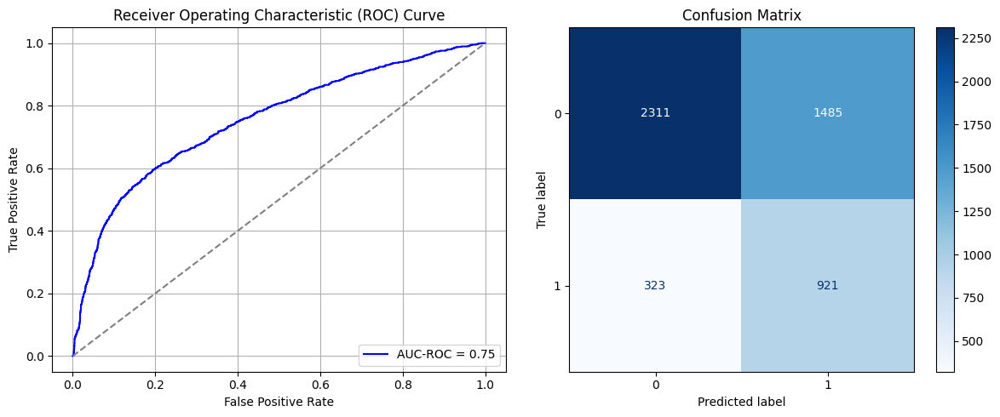

Best threshold based on F1-score: 0.9993093013763428
False Negative Rate: 0.2596463022508039
Time elapsed (performance): 0.930643978000262
(np.float64(0.3912012644889357), np.float64(0.6087987355110642))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6698 - loss: 0.6641 - val_AUC: 0.7172 - val_loss: 0.6165
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7165 - loss: 0.6137 - val_AUC: 0.7433 - val_loss: 0.5977
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7279 - loss: 0.6039 - val_AUC: 0.7501 - val_loss: 0.5879
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7415 - loss: 0.5922 - val_AUC: 0.7547 - val_loss: 0.5840
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7468 - loss: 0.5868 - val_AUC: 0.7581 - val_loss: 0.5821
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7403 - loss: 0.5913 - val_AUC: 0.7636 - val_loss: 0.5796
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7495 - loss: 0.5859 - val_AUC: 0.7630 - val_loss: 0.5784
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7472 - loss: 0.5853 - val_AUC: 0.7676 - val_loss: 0.5772
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7469 -

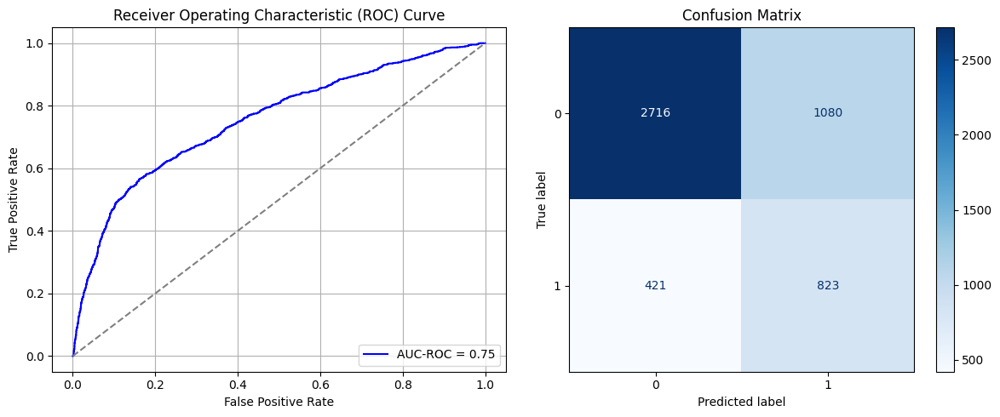

Best threshold based on F1-score: 0.6042535305023193
False Negative Rate: 0.3384244372990354
Time elapsed (performance): 0.6643083919998389
(np.float64(0.2845100105374078), np.float64(0.7154899894625921))
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6617 - loss: 0.6580 - val_AUC: 0.7081 - val_loss: 0.6189
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7234 - loss: 0.6027 - val_AUC: 0.7330 - val_loss: 0.6029
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7413 - loss: 0.5913 - val_AUC: 0.7364 - val_loss: 0.6085
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7349 - loss: 0.5941 - val_AUC: 0.7411 - val_loss: 0.5912
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7454 - loss: 0.5838 - val_AUC: 0.7410 - val_loss: 0.5907
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7446 - loss: 0.5860 - val_AUC: 0.7411 - val_loss: 0.5943
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7451 - loss: 0.5846 - val_AUC: 0.7486 - val_loss: 0.5875
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7563 - loss: 0.5723 - val_AUC: 0.7524 - val_loss: 0.5847
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7680 -

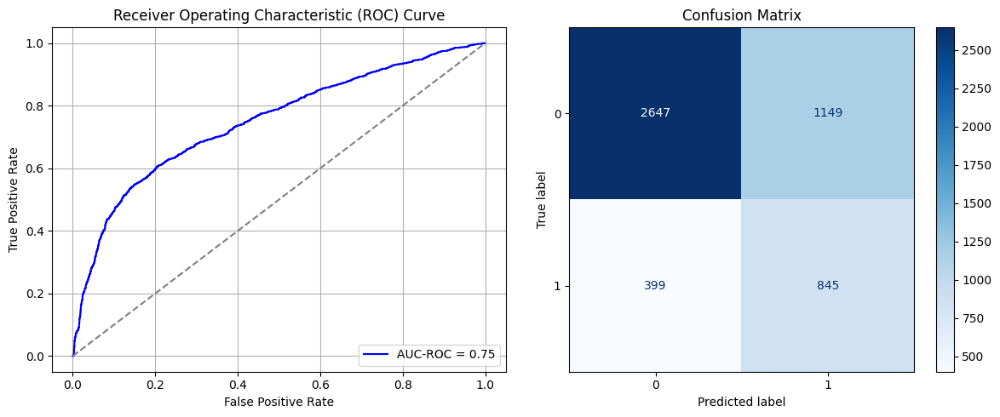

Best threshold based on F1-score: 0.6020938158035278
False Negative Rate: 0.3207395498392283
Time elapsed (performance): 0.6945708709999963
(np.float64(0.3026870389884089), np.float64(0.6973129610115911))
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6389 - loss: 0.6655 - val_AUC: 0.7054 - val_loss: 0.6218
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7190 - loss: 0.6095 - val_AUC: 0.7306 - val_loss: 0.5999
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.5937 - val_AUC: 0.7357 - val_loss: 0.6070
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7439 - loss: 0.5874 - val_AUC: 0.7432 - val_loss: 0.5910
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7555 - loss: 0.5747 - val_AUC: 0.7409 - val_loss: 0.5930
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7459 - loss: 0.5813 - val_AUC: 0.7473 - val_loss: 0.5869
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7617 - loss: 0.5698 - val_AUC: 0.7488 - val_loss: 0.5880
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7503 - loss: 0.5779 - val_AUC: 0.7500 - val_loss: 0.5860
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7587 -

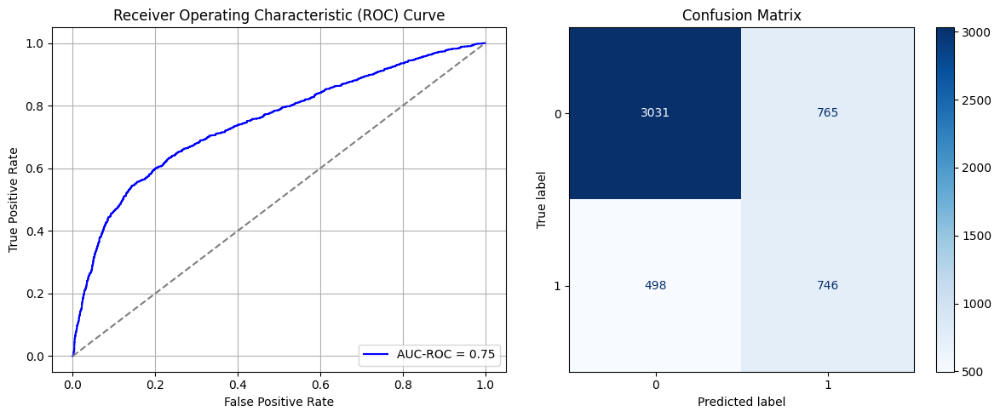

Best threshold based on F1-score: 0.9984352588653564
False Negative Rate: 0.4003215434083601
Time elapsed (performance): 0.683695851000266
(np.float64(0.20152792413066387), np.float64(0.7984720758693361))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6627 - loss: 0.6623 - val_AUC: 0.7053 - val_loss: 0.6168
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7042 - loss: 0.6199 - val_AUC: 0.7284 - val_loss: 0.6012
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7220 - loss: 0.6042 - val_AUC: 0.7399 - val_loss: 0.5928
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7234 - loss: 0.6045 - val_AUC: 0.7488 - val_loss: 0.5869
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7325 - loss: 0.5947 - val_AUC: 0.7540 - val_loss: 0.5845
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7232 - loss: 0.6029 - val_AUC: 0.7568 - val_loss: 0.5798
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7303 - loss: 0.6008 - val_AUC: 0.7541 - val_loss: 0.5790
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.5872 - val_AUC: 0.7616 - val_loss: 0.5799
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7559 -

<ipython-input-41-e44c5eb269c6>:62: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
AUC-ROC: 0.7530989635392138
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.58      0.70      3796
           1       0.37      0.76      0.50      1244

    accuracy                           0.62      5040
   macro avg       0.63      0.67      0.60      5040
weighted avg       0.75      0.62      0.65      5040

FPR 0.4230769230769231 TPR: 0.7612540192926045 FNR: 0.2387459807073955 TNR: 0.5769230769230769


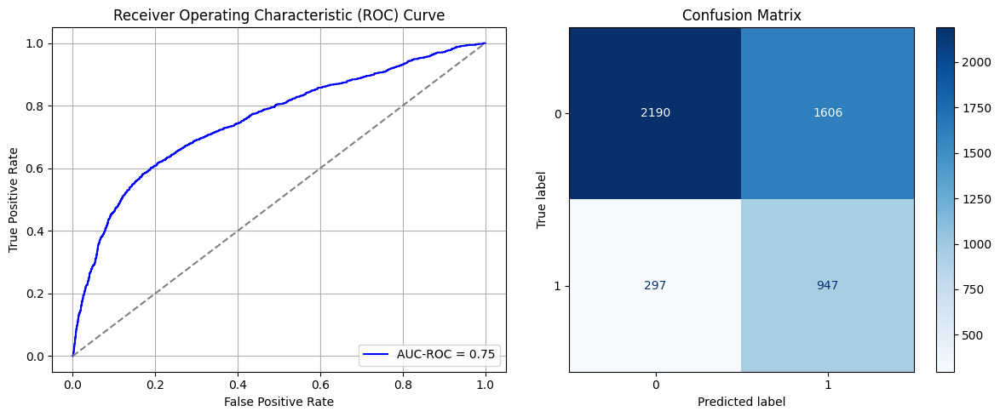

Best threshold based on F1-score: 0.9961196780204773
False Negative Rate: 0.2387459807073955
Time elapsed (performance): 0.6928063180002937
(np.float64(0.4230769230769231), np.float64(0.5769230769230769))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6612 - loss: 0.6579 - val_AUC: 0.7034 - val_loss: 0.6155
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7189 - loss: 0.6031 - val_AUC: 0.7230 - val_loss: 0.6014
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7387 - loss: 0.5880 - val_AUC: 0.7331 - val_loss: 0.5951
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7423 - loss: 0.5873 - val_AUC: 0.7354 - val_loss: 0.5963
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7462 - loss: 0.5815 - val_AUC: 0.7430 - val_loss: 0.5906
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7538 - loss: 0.5786 - val_AUC: 0.7393 - val_loss: 0.5920
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7481 - loss: 0.5795 - val_AUC: 0.7460 - val_loss: 0.5894
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7612 - loss: 0.5712 - val_AUC: 0.7459 - val_loss: 0.5942
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7592 -

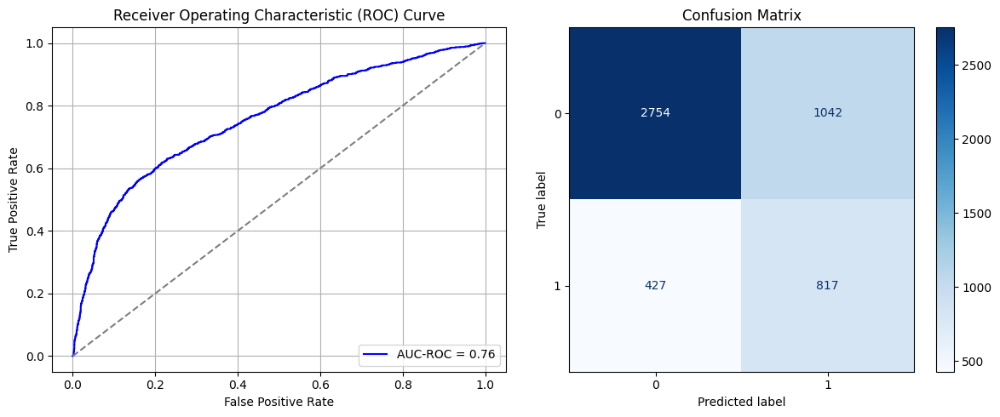

Best threshold based on F1-score: 0.9997076392173767
False Negative Rate: 0.3432475884244373
Time elapsed (performance): 0.6903117409992774
(np.float64(0.2744994731296101), np.float64(0.7255005268703899))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6519 - loss: 0.6626 - val_AUC: 0.7090 - val_loss: 0.6158
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7099 - loss: 0.6115 - val_AUC: 0.7271 - val_loss: 0.6130
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7374 - loss: 0.5935 - val_AUC: 0.7381 - val_loss: 0.5933
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7425 - loss: 0.5843 - val_AUC: 0.7432 - val_loss: 0.5928
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7482 - loss: 0.5802 - val_AUC: 0.7434 - val_loss: 0.5926
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7524 - loss: 0.5799 - val_AUC: 0.7438 - val_loss: 0.5936
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7598 - loss: 0.5746 - val_AUC: 0.7464 - val_loss: 0.5890
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7530 - loss: 0.5784 - val_AUC: 0.7482 - val_loss: 0.5890
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7589 -

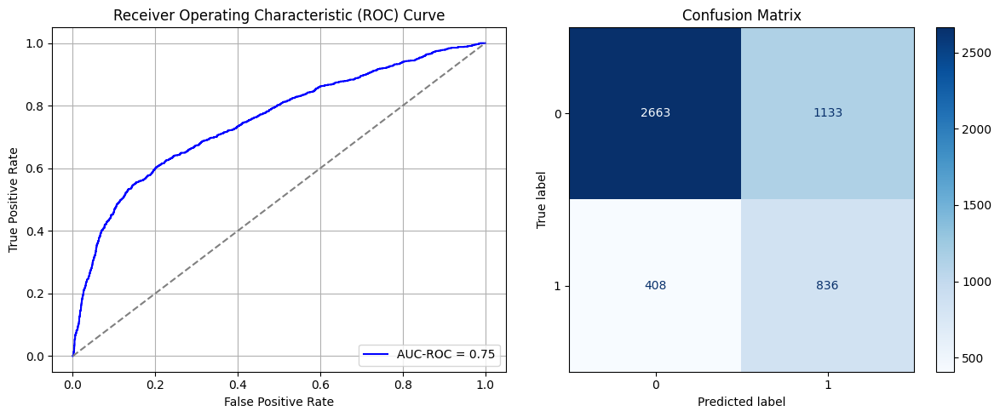

Best threshold based on F1-score: 0.9988756775856018
False Negative Rate: 0.3279742765273312
Time elapsed (performance): 0.7139739660005944
(np.float64(0.29847207586933616), np.float64(0.7015279241306638))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6307 - loss: 0.6659 - val_AUC: 0.7016 - val_loss: 0.6171
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7078 - loss: 0.6150 - val_AUC: 0.7356 - val_loss: 0.5982
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7259 - loss: 0.6048 - val_AUC: 0.7498 - val_loss: 0.5877
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7303 - loss: 0.6011 - val_AUC: 0.7535 - val_loss: 0.5861
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7233 - loss: 0.6058 - val_AUC: 0.7572 - val_loss: 0.5798
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5947 - val_AUC: 0.7643 - val_loss: 0.5771
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7407 - loss: 0.5921 - val_AUC: 0.7636 - val_loss: 0.5769
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7419 - loss: 0.5912 - val_AUC: 0.7702 - val_loss: 0.5761
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7442 -

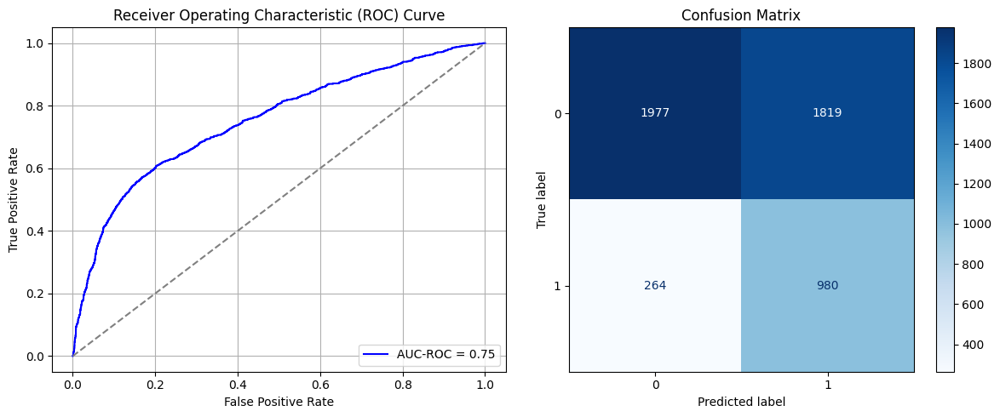

Best threshold based on F1-score: 0.9975391030311584
False Negative Rate: 0.21221864951768488
Time elapsed (performance): 0.7410690739998245
(np.float64(0.4791886195995785), np.float64(0.5208113804004215))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6447 - loss: 0.6619 - val_AUC: 0.7199 - val_loss: 0.6103
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7170 - loss: 0.6098 - val_AUC: 0.7367 - val_loss: 0.5965
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.6029 - val_AUC: 0.7423 - val_loss: 0.5904
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7289 - loss: 0.5956 - val_AUC: 0.7505 - val_loss: 0.5859
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7358 - loss: 0.5910 - val_AUC: 0.7562 - val_loss: 0.5851
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7427 - loss: 0.5915 - val_AUC: 0.7583 - val_loss: 0.5843
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7378 - loss: 0.5952 - val_AUC: 0.7559 - val_loss: 0.5803
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7638 - loss: 0.5720 - val_AUC: 0.7651 - val_loss: 0.5761
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7480 -

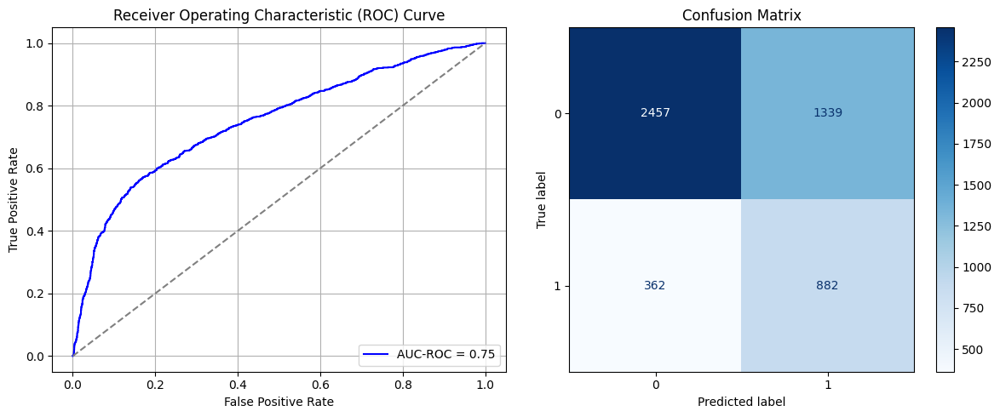

Best threshold based on F1-score: 0.9991326332092285
False Negative Rate: 0.2909967845659164
Time elapsed (performance): 0.7387075980004738
(np.float64(0.3527397260273973), np.float64(0.6472602739726028))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6464 - loss: 0.6685 - val_AUC: 0.7116 - val_loss: 0.6201
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7064 - loss: 0.6173 - val_AUC: 0.7370 - val_loss: 0.5965
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7290 - loss: 0.6054 - val_AUC: 0.7498 - val_loss: 0.5885
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7410 - loss: 0.5862 - val_AUC: 0.7577 - val_loss: 0.5846
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7400 - loss: 0.5896 - val_AUC: 0.7580 - val_loss: 0.5800
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7477 - loss: 0.5850 - val_AUC: 0.7583 - val_loss: 0.5776
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7434 - loss: 0.5850 - val_AUC: 0.7642 - val_loss: 0.5737
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7541 - loss: 0.5794 - val_AUC: 0.7662 - val_loss: 0.5776
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7587 -

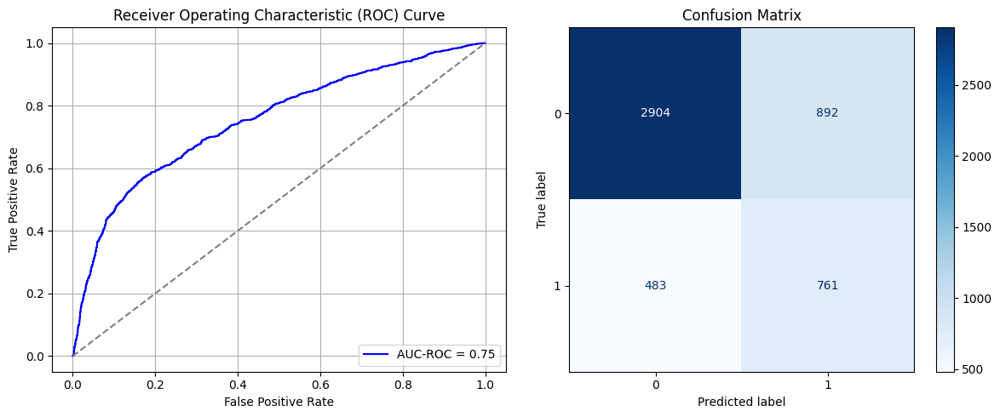

Best threshold based on F1-score: 0.9961560964584351
False Negative Rate: 0.3882636655948553
Time elapsed (performance): 1.2461071640000227
(np.float64(0.23498419388830347), np.float64(0.7650158061116965))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6111 - loss: 0.6721 - val_AUC: 0.7097 - val_loss: 0.6167
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7060 - loss: 0.6165 - val_AUC: 0.7334 - val_loss: 0.5971
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7275 - loss: 0.6013 - val_AUC: 0.7456 - val_loss: 0.5916
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7458 - loss: 0.5873 - val_AUC: 0.7471 - val_loss: 0.5905
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7337 - loss: 0.5978 - val_AUC: 0.7539 - val_loss: 0.5857
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7501 - loss: 0.5804 - val_AUC: 0.7535 - val_loss: 0.5889
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7598 - loss: 0.5741 - val_AUC: 0.7602 - val_loss: 0.5834
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7534 - loss: 0.5805 - val_AUC: 0.7633 - val_loss: 0.5762
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7500 -

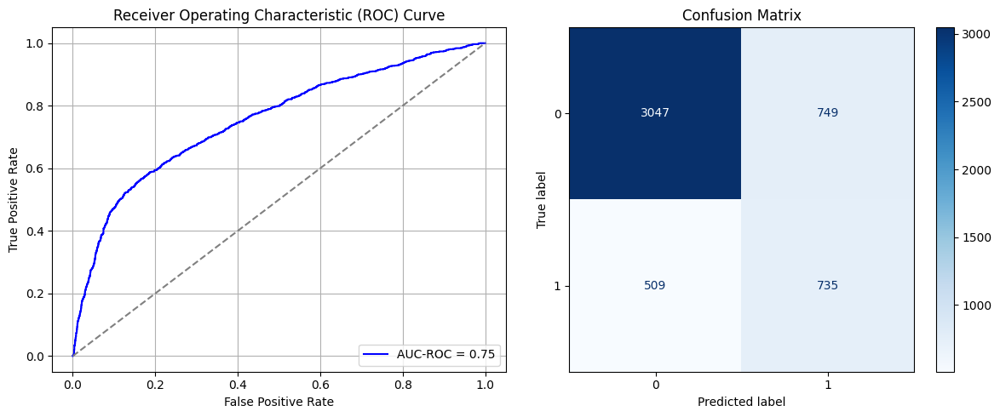

Best threshold based on F1-score: 0.998857855796814
False Negative Rate: 0.4091639871382637
Time elapsed (performance): 0.8008096550001937
(np.float64(0.19731296101159115), np.float64(0.8026870389884089))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6413 - loss: 0.6684 - val_AUC: 0.7107 - val_loss: 0.6158
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6996 - loss: 0.6229 - val_AUC: 0.7336 - val_loss: 0.5959
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7306 - loss: 0.6010 - val_AUC: 0.7395 - val_loss: 0.5988
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7451 - loss: 0.5884 - val_AUC: 0.7552 - val_loss: 0.5850
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7408 - loss: 0.5909 - val_AUC: 0.7542 - val_loss: 0.5915
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7382 - loss: 0.5964 - val_AUC: 0.7591 - val_loss: 0.5798
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7670 - loss: 0.5679 - val_AUC: 0.7581 - val_loss: 0.5796
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7518 - loss: 0.5788 - val_AUC: 0.7628 - val_loss: 0.5788
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7692 -

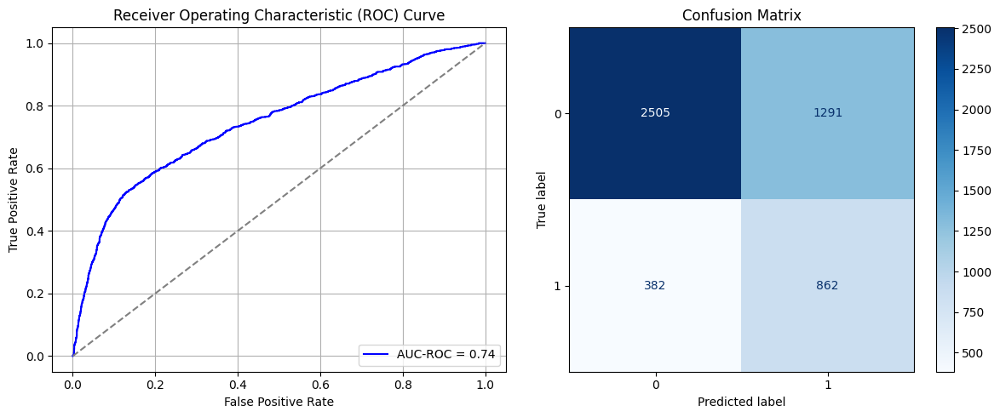

Best threshold based on F1-score: 0.9995364546775818
False Negative Rate: 0.3070739549839228
Time elapsed (performance): 1.079324004999762
(np.float64(0.34009483667017915), np.float64(0.6599051633298209))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6390 - loss: 0.6680 - val_AUC: 0.7032 - val_loss: 0.6198
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7107 - loss: 0.6138 - val_AUC: 0.7326 - val_loss: 0.5987
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7271 - loss: 0.6024 - val_AUC: 0.7484 - val_loss: 0.5889
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7377 - loss: 0.5965 - val_AUC: 0.7550 - val_loss: 0.5824
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7349 - loss: 0.5960 - val_AUC: 0.7583 - val_loss: 0.5791
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7464 - loss: 0.5913 - val_AUC: 0.7670 - val_loss: 0.5743
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7468 - loss: 0.5885 - val_AUC: 0.7689 - val_loss: 0.5727
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7472 - loss: 0.5926 - val_AUC: 0.7705 - val_loss: 0.5729
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7590 -

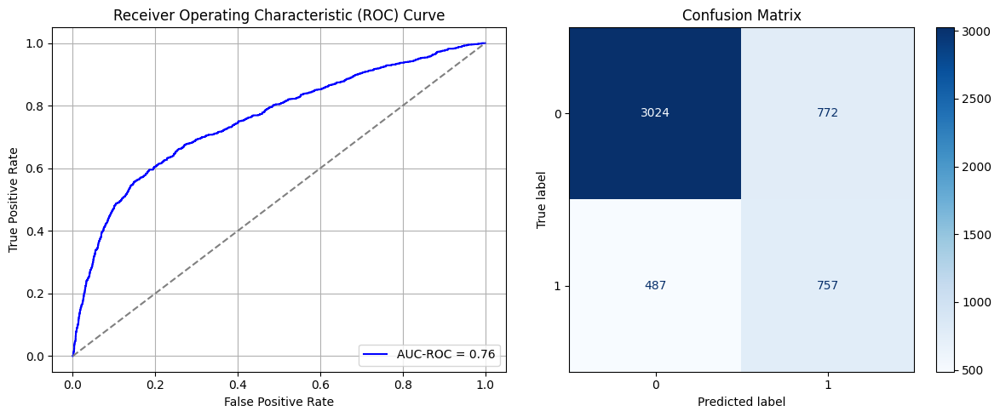

Best threshold based on F1-score: 0.9978652000427246
False Negative Rate: 0.39147909967845657
Time elapsed (performance): 0.7475992350000524
(np.float64(0.20337197049525815), np.float64(0.7966280295047419))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6537 - loss: 0.6594 - val_AUC: 0.7035 - val_loss: 0.6163
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7114 - loss: 0.6115 - val_AUC: 0.7214 - val_loss: 0.6020
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7363 - loss: 0.5863 - val_AUC: 0.7310 - val_loss: 0.5974
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7418 - loss: 0.5882 - val_AUC: 0.7373 - val_loss: 0.5934
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7427 - loss: 0.5837 - val_AUC: 0.7365 - val_loss: 0.5926
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7509 - loss: 0.5787 - val_AUC: 0.7405 - val_loss: 0.5899
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7546 - loss: 0.5729 - val_AUC: 0.7439 - val_loss: 0.5900
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7550 - loss: 0.5751 - val_AUC: 0.7466 - val_loss: 0.5863
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7621 -

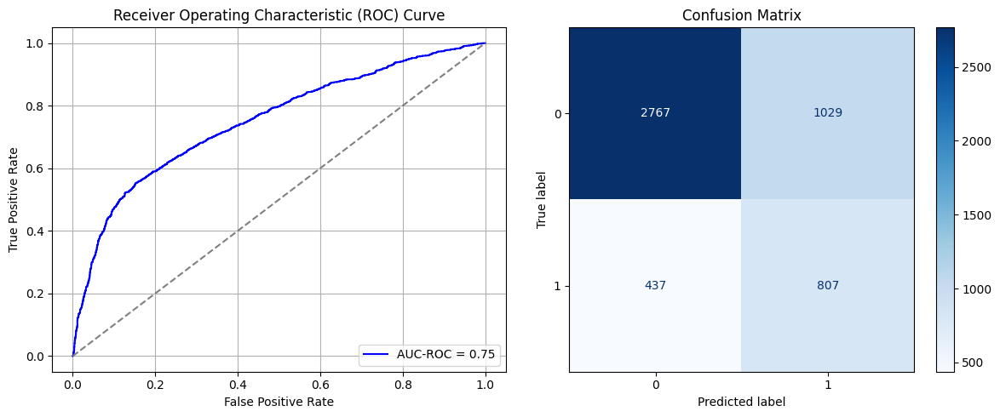

Best threshold based on F1-score: 0.9992137551307678
False Negative Rate: 0.3512861736334405
Time elapsed (performance): 0.7498401960001502
(np.float64(0.27107481559536356), np.float64(0.7289251844046365))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6213 - loss: 0.6682 - val_AUC: 0.7119 - val_loss: 0.6140
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7039 - loss: 0.6181 - val_AUC: 0.7353 - val_loss: 0.5990
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7316 - loss: 0.6009 - val_AUC: 0.7443 - val_loss: 0.5942
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7288 - loss: 0.5999 - val_AUC: 0.7546 - val_loss: 0.5833
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7391 - loss: 0.5902 - val_AUC: 0.7586 - val_loss: 0.5808
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7532 - loss: 0.5791 - val_AUC: 0.7584 - val_loss: 0.5789
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7487 - loss: 0.5891 - val_AUC: 0.7682 - val_loss: 0.5744
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7655 - loss: 0.5728 - val_AUC: 0.7712 - val_loss: 0.5731
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7523 -

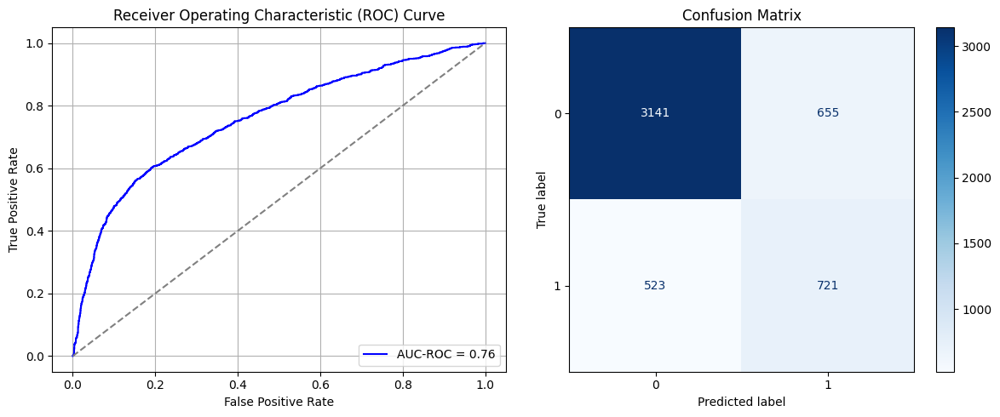

Best threshold based on F1-score: 0.9988459348678589
False Negative Rate: 0.4204180064308682
Time elapsed (performance): 0.7232134389996645
(np.float64(0.172550052687039), np.float64(0.8274499473129611))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6326 - loss: 0.6706 - val_AUC: 0.7089 - val_loss: 0.6208
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6976 - loss: 0.6218 - val_AUC: 0.7325 - val_loss: 0.6025
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.6004 - val_AUC: 0.7501 - val_loss: 0.5889
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7299 - loss: 0.6012 - val_AUC: 0.7543 - val_loss: 0.5862
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7315 - loss: 0.5965 - val_AUC: 0.7570 - val_loss: 0.5821
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.5931 - val_AUC: 0.7574 - val_loss: 0.5827
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7432 - loss: 0.5922 - val_AUC: 0.7616 - val_loss: 0.5774
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7388 - loss: 0.5908 - val_AUC: 0.7596 - val_loss: 0.5767
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7499 -

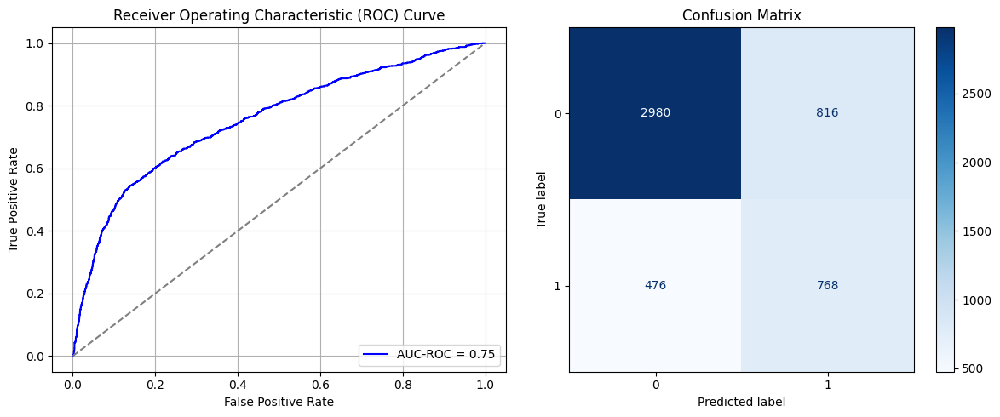

Best threshold based on F1-score: 0.9986457824707031
False Negative Rate: 0.38263665594855306
Time elapsed (performance): 0.7381654809996689
(np.float64(0.21496311907270813), np.float64(0.7850368809272918))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6541 - loss: 0.6647 - val_AUC: 0.7026 - val_loss: 0.6165
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7230 - loss: 0.5995 - val_AUC: 0.7199 - val_loss: 0.6040
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5970 - val_AUC: 0.7342 - val_loss: 0.5956
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7473 - loss: 0.5846 - val_AUC: 0.7392 - val_loss: 0.5943
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7523 - loss: 0.5754 - val_AUC: 0.7407 - val_loss: 0.5927
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7450 - loss: 0.5838 - val_AUC: 0.7435 - val_loss: 0.5907
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7597 - loss: 0.5735 - val_AUC: 0.7481 - val_loss: 0.5880
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7615 - loss: 0.5676 - val_AUC: 0.7478 - val_loss: 0.5884
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7639 -

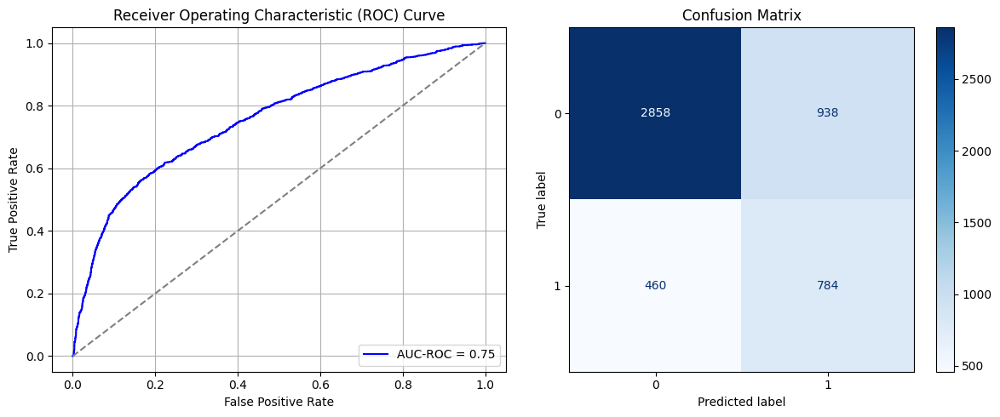

Best threshold based on F1-score: 0.9996735453605652
False Negative Rate: 0.36977491961414793
Time elapsed (performance): 0.7344867199999499
(np.float64(0.24710221285563752), np.float64(0.7528977871443625))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6167 - loss: 0.6675 - val_AUC: 0.7002 - val_loss: 0.6247
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7118 - loss: 0.6137 - val_AUC: 0.7179 - val_loss: 0.6045
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7179 - loss: 0.6019 - val_AUC: 0.7334 - val_loss: 0.5949
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7453 - loss: 0.5846 - val_AUC: 0.7388 - val_loss: 0.5909
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7488 - loss: 0.5780 - val_AUC: 0.7378 - val_loss: 0.5920
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7502 - loss: 0.5758 - val_AUC: 0.7438 - val_loss: 0.5914
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7545 - loss: 0.5720 - val_AUC: 0.7401 - val_loss: 0.5999
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7536 - loss: 0.5765 - val_AUC: 0.7443 - val_loss: 0.5869
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7494 -

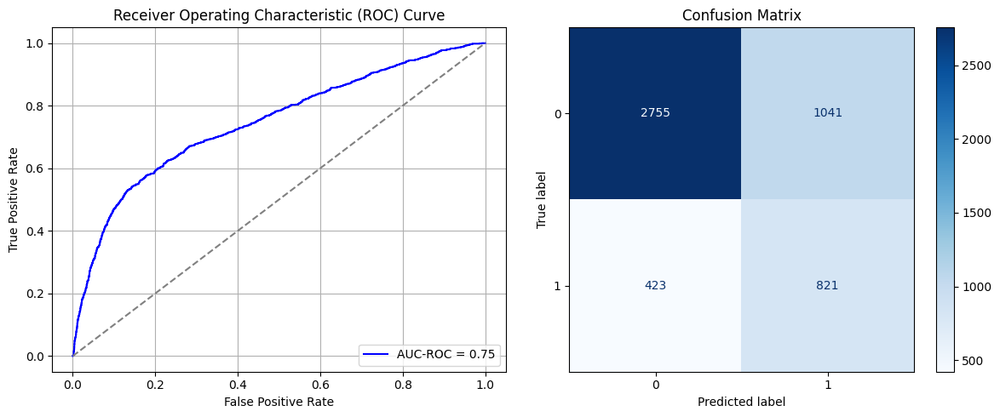

Best threshold based on F1-score: 0.998993456363678
False Negative Rate: 0.340032154340836
Time elapsed (performance): 0.7295056220000333
(np.float64(0.27423603793466805), np.float64(0.725763962065332))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6400 - loss: 0.6640 - val_AUC: 0.7104 - val_loss: 0.6155
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7221 - loss: 0.6038 - val_AUC: 0.7305 - val_loss: 0.6008
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7413 - loss: 0.5877 - val_AUC: 0.7367 - val_loss: 0.6001
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7395 - loss: 0.5880 - val_AUC: 0.7411 - val_loss: 0.5919
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7497 - loss: 0.5768 - val_AUC: 0.7415 - val_loss: 0.5943
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7546 - loss: 0.5779 - val_AUC: 0.7402 - val_loss: 0.5997
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7494 - loss: 0.5833 - val_AUC: 0.7458 - val_loss: 0.5882
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7602 - loss: 0.5748 - val_AUC: 0.7510 - val_loss: 0.5897
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7649 -

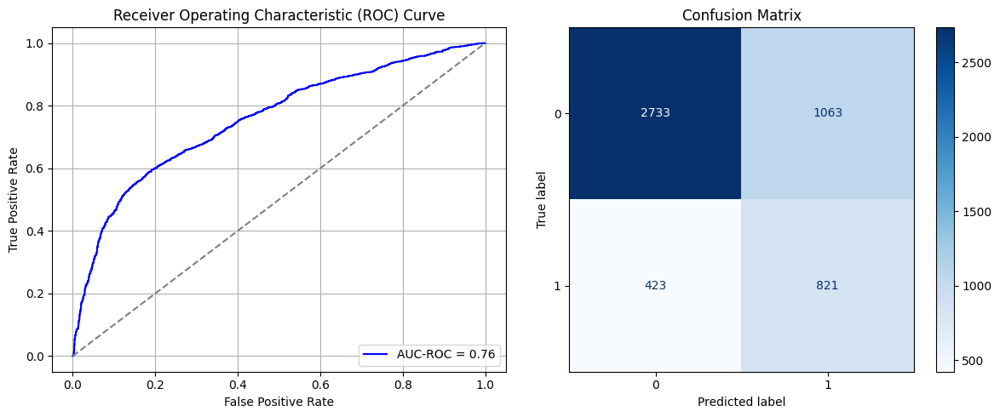

Best threshold based on F1-score: 0.9994416236877441
False Negative Rate: 0.340032154340836
Time elapsed (performance): 0.7309509260003324
(np.float64(0.28003161222339307), np.float64(0.719968387776607))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6421 - loss: 0.6647 - val_AUC: 0.7065 - val_loss: 0.6185
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7142 - loss: 0.6093 - val_AUC: 0.7255 - val_loss: 0.5998
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7374 - loss: 0.5868 - val_AUC: 0.7362 - val_loss: 0.5933
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7375 - loss: 0.5923 - val_AUC: 0.7383 - val_loss: 0.5923
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7442 - loss: 0.5835 - val_AUC: 0.7437 - val_loss: 0.5908
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7513 - loss: 0.5767 - val_AUC: 0.7433 - val_loss: 0.5889
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7562 - loss: 0.5740 - val_AUC: 0.7493 - val_loss: 0.5862
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7644 - loss: 0.5688 - val_AUC: 0.7479 - val_loss: 0.5875
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7565 -

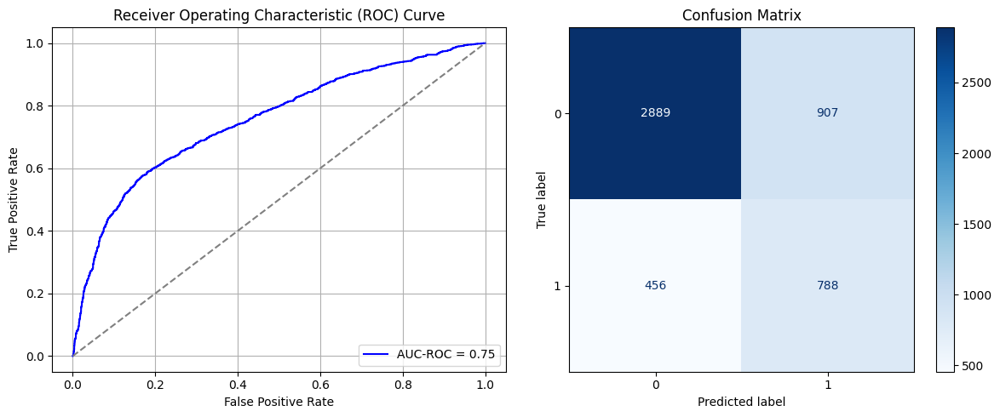

Best threshold based on F1-score: 0.9989628195762634
False Negative Rate: 0.3665594855305466
Time elapsed (performance): 1.0692812600000252
(np.float64(0.23893572181243414), np.float64(0.7610642781875658))
    Source time       FPR       TNR       FNR       TPR  Target time
0     11.624824  0.391201  0.608799  0.259646  0.740354     0.930644
1     12.019051  0.284510  0.715490  0.338424  0.661576     0.664308
2     12.374548  0.302687  0.697313  0.320740  0.679260     0.694571
3     10.935597  0.201528  0.798472  0.400322  0.599678     0.683696
4     12.554671  0.423077  0.576923  0.238746  0.761254     0.692806
5     12.161676  0.274499  0.725501  0.343248  0.656752     0.690312
6     13.347122  0.298472  0.701528  0.327974  0.672026     0.713974
7     14.053400  0.479189  0.520811  0.212219  0.787781     0.741069
8     13.186502  0.352740  0.647260  0.290997  0.709003     0.738708
9     13.809580  0.234984  0.765016  0.388264  0.611736     1.246107
10    10.545636  0.197313  0.802687

<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


In [71]:
import random

times = 20

Training_time = []
FPR = []
TPR = []
FNR = []
TNR = []
TL_time = []

k = oversample_size/undersample_size
print(k)

# np.random.seed(123)

for i in range(times):
    start = random.randint(1, int(k))
    # print(start)

    Row = []

    for j in range(undersample_size):
      row = start+int(k*j)-1
      Row.append(row)

    # print(Row)

    data_S_maj_rus = pd.DataFrame()
    data_S_maj_rus = data_S_majority.iloc[Row]

    data_S_Sy_RUS = pd.concat([data_S_maj_rus, data_S_minority])
    X_S_Sy = data_S_Sy_RUS.iloc[:, :-1]
    y_S_Sy = data_S_Sy_RUS.iloc[:, -1]
    X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
    model_Sy = create_dnn_model(X_S_train.shape[1])
    result_Sy = train_and_evaluate(model_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
    result_TL_Sy = Transductive_TL(model_Sy, X_T_full, y_T_full, "Target")
    print(result_TL_Sy[0:2])

    Training_time.append(result_Sy)
    FPR.append(result_TL_Sy[0])
    TNR.append(result_TL_Sy[1])
    FNR.append(result_TL_Sy[2])
    TPR.append(result_TL_Sy[3])
    TL_time.append(result_TL_Sy[4])

# return fpr, tnr, fnr, tpr, time_elapsed

# print(TNR)

ParamFit = pd.DataFrame([Training_time, FPR, TNR, FNR, TPR, TL_time]).T
ParamFit.columns=['Source time', 'FPR', 'TNR', 'FNR', 'TPR', 'Target time']
print(ParamFit)


In [72]:
print(ParamFit)
ParamFit.to_csv('Sy_RUS.csv')

    Source time       FPR       TNR       FNR       TPR  Target time
0     11.624824  0.391201  0.608799  0.259646  0.740354     0.930644
1     12.019051  0.284510  0.715490  0.338424  0.661576     0.664308
2     12.374548  0.302687  0.697313  0.320740  0.679260     0.694571
3     10.935597  0.201528  0.798472  0.400322  0.599678     0.683696
4     12.554671  0.423077  0.576923  0.238746  0.761254     0.692806
5     12.161676  0.274499  0.725501  0.343248  0.656752     0.690312
6     13.347122  0.298472  0.701528  0.327974  0.672026     0.713974
7     14.053400  0.479189  0.520811  0.212219  0.787781     0.741069
8     13.186502  0.352740  0.647260  0.290997  0.709003     0.738708
9     13.809580  0.234984  0.765016  0.388264  0.611736     1.246107
10    10.545636  0.197313  0.802687  0.409164  0.590836     0.800810
11    13.810055  0.340095  0.659905  0.307074  0.692926     1.079324
12    13.995083  0.203372  0.796628  0.391479  0.608521     0.747599
13    13.556828  0.271075  0.72892

## Systematic Sampling (multiple samples):

Now, we investigate the possibility of conducting $m$ systematic samples, each with a sampling interval of $k=m*\frac{N_0}{N_1}$, and obtaining the undersampled majority class data using all $m$ systematic samples combined. This may more closely approximate SRS sampling.

For convenience, we take $m=10$ in this case.

35.87215803205367
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6210 - loss: 0.6704 - val_AUC: 0.7208 - val_loss: 0.6078
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 - loss: 0.6114 - val_AUC: 0.7445 - val_loss: 0.5920
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7307 - loss: 0.5995 - val_AUC: 0.7516 - val_loss: 0.5824
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.5944 - val_AUC: 0.7577 - val_loss: 0.5771
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7445 - loss: 0.5879 - val_AUC: 0.7604 - val_loss: 0.5742
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7483 - loss: 0.5859 - val_AUC: 0.7616 - val_loss: 0.5726
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7518 - loss: 0.5783 - val_AUC: 0.7624 - val_loss: 0.5717
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7558 - loss: 0.5792 - val_AUC: 0.7673 - val_loss: 0.5687
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7527 -

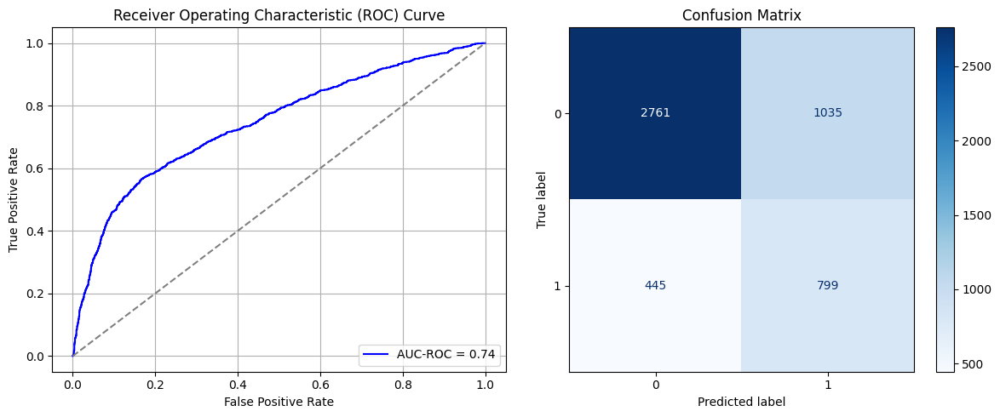

Best threshold based on F1-score: 0.9994645118713379
False Negative Rate: 0.35771704180064307
Time elapsed (performance): 0.718489660999694
(np.float64(0.2726554267650158), np.float64(0.7273445732349841))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6081 - loss: 0.6739 - val_AUC: 0.7165 - val_loss: 0.6154
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7146 - loss: 0.6085 - val_AUC: 0.7381 - val_loss: 0.5997
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7244 - loss: 0.6018 - val_AUC: 0.7505 - val_loss: 0.5840
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7444 - loss: 0.5889 - val_AUC: 0.7599 - val_loss: 0.5784
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7470 - loss: 0.5806 - val_AUC: 0.7619 - val_loss: 0.5779
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7532 - loss: 0.5823 - val_AUC: 0.7614 - val_loss: 0.5762
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7426 - loss: 0.5905 - val_AUC: 0.7640 - val_loss: 0.5750
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7560 - loss: 0.5765 - val_AUC: 0.7649 - val_loss: 0.5750
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7539 -

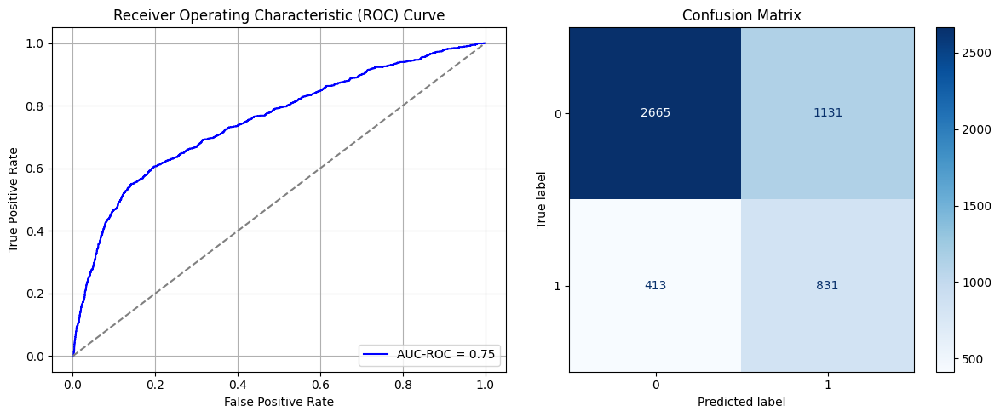

Best threshold based on F1-score: 0.9988412857055664
False Negative Rate: 0.3319935691318328
Time elapsed (performance): 2.4829313279997223
(np.float64(0.2979452054794521), np.float64(0.702054794520548))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6363 - loss: 0.6634 - val_AUC: 0.7260 - val_loss: 0.6080
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7183 - loss: 0.6081 - val_AUC: 0.7426 - val_loss: 0.5867
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7365 - loss: 0.5891 - val_AUC: 0.7490 - val_loss: 0.5820
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7434 - loss: 0.5828 - val_AUC: 0.7572 - val_loss: 0.5854
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7465 - loss: 0.5830 - val_AUC: 0.7585 - val_loss: 0.5775
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5804 - val_AUC: 0.7659 - val_loss: 0.5724
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7581 - loss: 0.5717 - val_AUC: 0.7552 - val_loss: 0.5808
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7559 - loss: 0.5753 - val_AUC: 0.7701 - val_loss: 0.5685
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7629 -

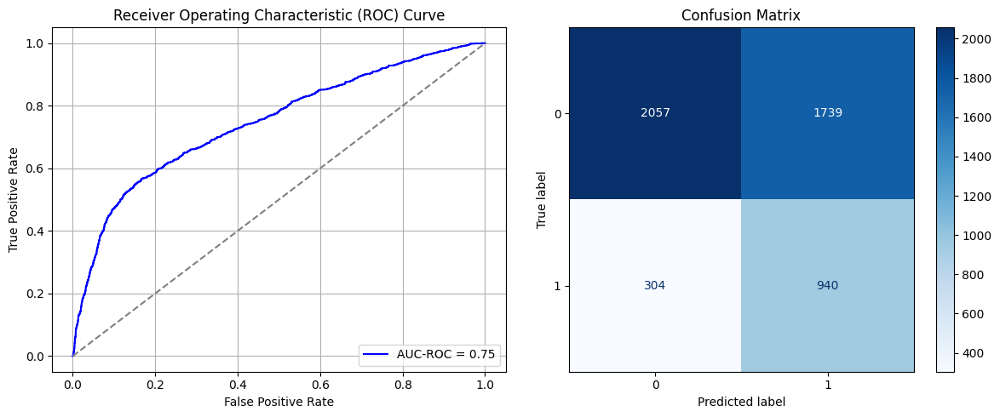

Best threshold based on F1-score: 0.9995158910751343
False Negative Rate: 0.24437299035369775
Time elapsed (performance): 0.6902844710002682
(np.float64(0.458113804004215), np.float64(0.541886195995785))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6309 - loss: 0.6689 - val_AUC: 0.7213 - val_loss: 0.6068
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7230 - loss: 0.6022 - val_AUC: 0.7394 - val_loss: 0.5942
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7247 - loss: 0.6026 - val_AUC: 0.7514 - val_loss: 0.5835
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7248 - loss: 0.5987 - val_AUC: 0.7550 - val_loss: 0.5809
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7351 - loss: 0.5925 - val_AUC: 0.7605 - val_loss: 0.5788
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7353 - loss: 0.5907 - val_AUC: 0.7614 - val_loss: 0.5788
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7481 - loss: 0.5808 - val_AUC: 0.7601 - val_loss: 0.5781
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5899 - val_AUC: 0.7686 - val_loss: 0.5724
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7558 -

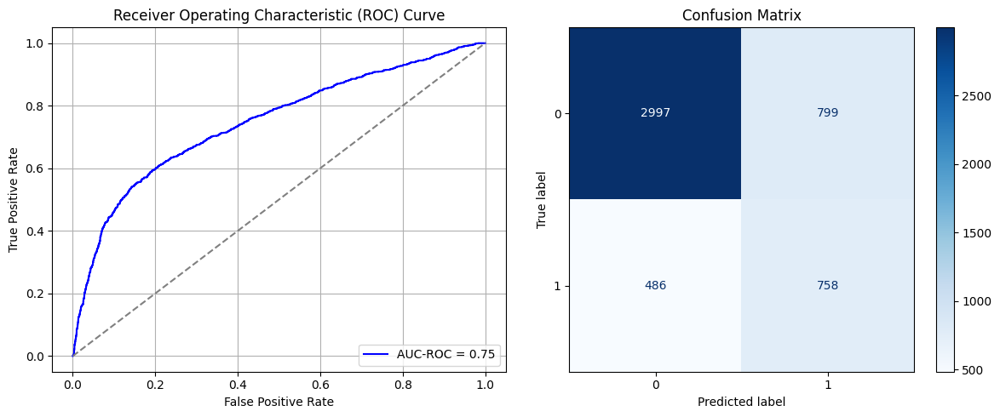

Best threshold based on F1-score: 0.9988704919815063
False Negative Rate: 0.39067524115755625
Time elapsed (performance): 0.7170897930000137
(np.float64(0.21048472075869337), np.float64(0.7895152792413066))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6222 - loss: 0.6734 - val_AUC: 0.7232 - val_loss: 0.6085
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6971 - loss: 0.6226 - val_AUC: 0.7384 - val_loss: 0.5929
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7234 - loss: 0.6043 - val_AUC: 0.7485 - val_loss: 0.5876
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7305 - loss: 0.6033 - val_AUC: 0.7552 - val_loss: 0.5827
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5966 - val_AUC: 0.7565 - val_loss: 0.5781
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7347 - loss: 0.6002 - val_AUC: 0.7554 - val_loss: 0.5831
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7376 - loss: 0.5960 - val_AUC: 0.7566 - val_loss: 0.5802
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7466 - loss: 0.5879 - val_AUC: 0.7539 - val_loss: 0.5868
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7566 -

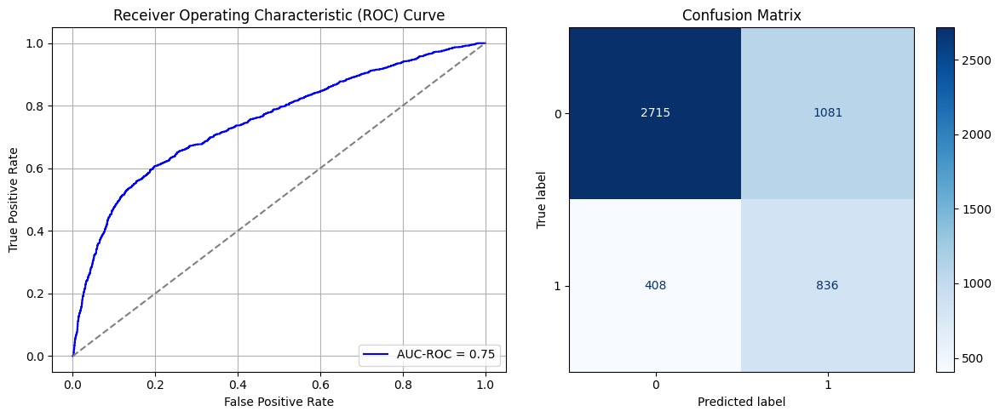

Best threshold based on F1-score: 0.9977527856826782
False Negative Rate: 0.3279742765273312
Time elapsed (performance): 0.7208041399999274
(np.float64(0.28477344573234986), np.float64(0.7152265542676501))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6390 - loss: 0.6687 - val_AUC: 0.7218 - val_loss: 0.6074
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7061 - loss: 0.6104 - val_AUC: 0.7446 - val_loss: 0.5967
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7232 - loss: 0.6004 - val_AUC: 0.7524 - val_loss: 0.5886
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7400 - loss: 0.5916 - val_AUC: 0.7532 - val_loss: 0.5882
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7404 - loss: 0.5869 - val_AUC: 0.7528 - val_loss: 0.5891
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7555 - loss: 0.5807 - val_AUC: 0.7535 - val_loss: 0.5910
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7445 - loss: 0.5878 - val_AUC: 0.7566 - val_loss: 0.5895
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7514 - loss: 0.5759 - val_AUC: 0.7604 - val_loss: 0.5841
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7584 -

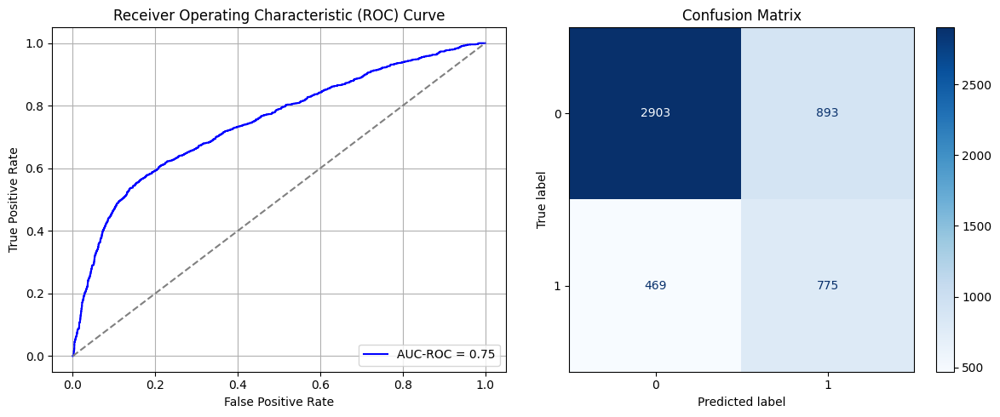

Best threshold based on F1-score: 0.9995609521865845
False Negative Rate: 0.3770096463022508
Time elapsed (performance): 0.7425793319998775
(np.float64(0.23524762908324554), np.float64(0.7647523709167545))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6400 - loss: 0.6652 - val_AUC: 0.7054 - val_loss: 0.6123
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7024 - loss: 0.6156 - val_AUC: 0.7206 - val_loss: 0.6018
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7213 - loss: 0.6007 - val_AUC: 0.7326 - val_loss: 0.5956
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7357 - loss: 0.5917 - val_AUC: 0.7423 - val_loss: 0.5905
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7452 - loss: 0.5901 - val_AUC: 0.7477 - val_loss: 0.5853
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7398 - loss: 0.5920 - val_AUC: 0.7492 - val_loss: 0.5837
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7411 - loss: 0.5866 - val_AUC: 0.7510 - val_loss: 0.5815
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7530 - loss: 0.5808 - val_AUC: 0.7507 - val_loss: 0.5841
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7508 -

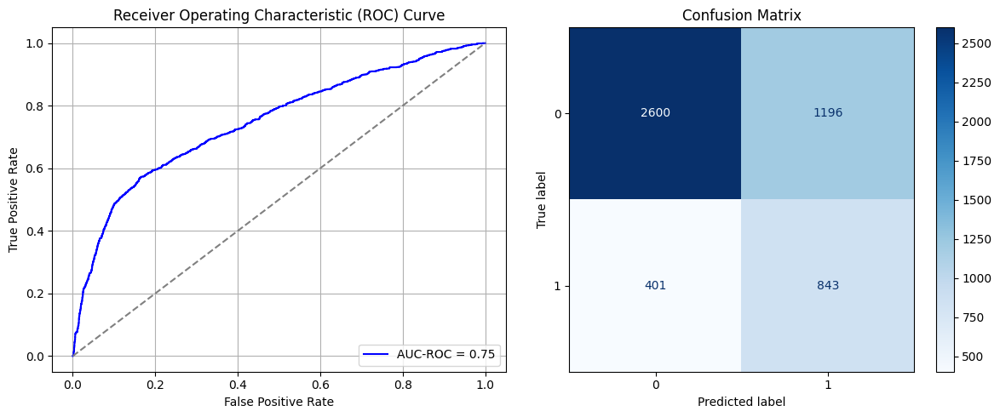

Best threshold based on F1-score: 0.9996436834335327
False Negative Rate: 0.32234726688102894
Time elapsed (performance): 1.1660319770007845
(np.float64(0.3150684931506849), np.float64(0.6849315068493151))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6339 - loss: 0.6688 - val_AUC: 0.6986 - val_loss: 0.6232
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7156 - loss: 0.6072 - val_AUC: 0.7204 - val_loss: 0.6145
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7282 - loss: 0.5952 - val_AUC: 0.7356 - val_loss: 0.6023
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7545 - loss: 0.5778 - val_AUC: 0.7373 - val_loss: 0.5998
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7528 - loss: 0.5785 - val_AUC: 0.7442 - val_loss: 0.5980
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7417 - loss: 0.5832 - val_AUC: 0.7484 - val_loss: 0.5966
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7445 - loss: 0.5851 - val_AUC: 0.7517 - val_loss: 0.5952
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7502 - loss: 0.5802 - val_AUC: 0.7542 - val_loss: 0.5932
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7579 -

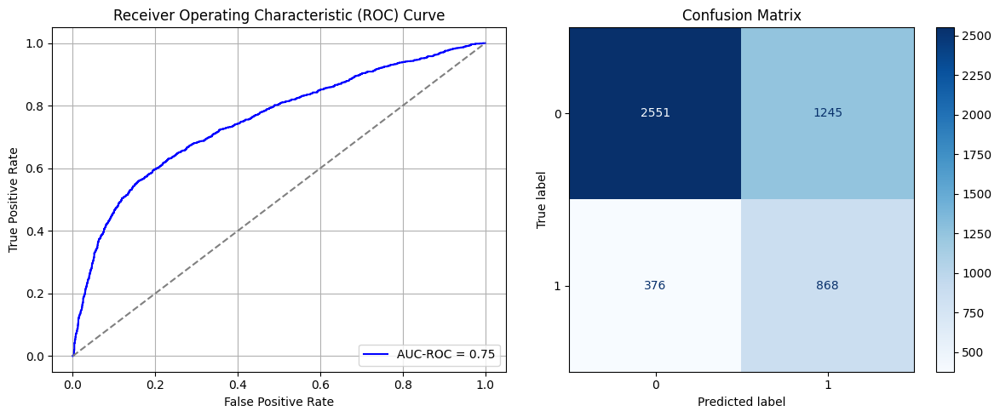

Best threshold based on F1-score: 0.99986732006073
False Negative Rate: 0.3022508038585209
Time elapsed (performance): 0.7391124149999087
(np.float64(0.3279768177028451), np.float64(0.672023182297155))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6285 - loss: 0.6677 - val_AUC: 0.7368 - val_loss: 0.6019
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7183 - loss: 0.6110 - val_AUC: 0.7479 - val_loss: 0.5830
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7365 - loss: 0.6007 - val_AUC: 0.7555 - val_loss: 0.5762
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7329 - loss: 0.6013 - val_AUC: 0.7603 - val_loss: 0.5709
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7497 - loss: 0.5886 - val_AUC: 0.7631 - val_loss: 0.5716
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7496 - loss: 0.5900 - val_AUC: 0.7637 - val_loss: 0.5684
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7593 - loss: 0.5819 - val_AUC: 0.7626 - val_loss: 0.5721
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7549 - loss: 0.5786 - val_AUC: 0.7627 - val_loss: 0.5717
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7641 -

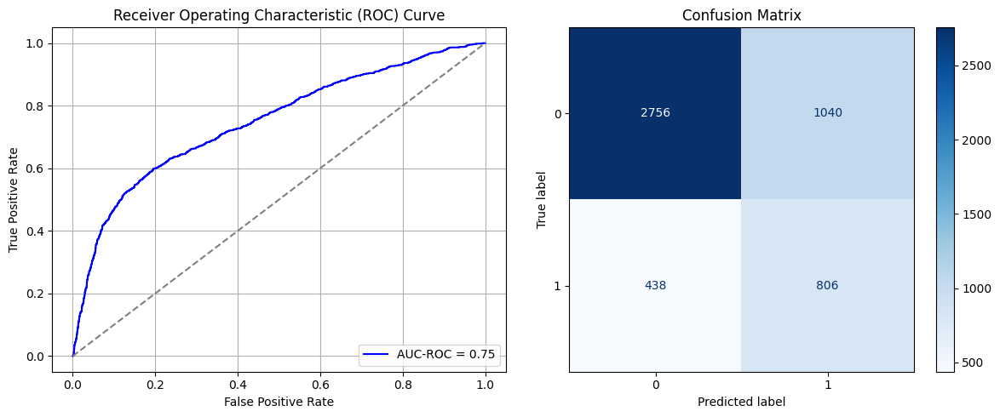

Best threshold based on F1-score: 0.9959271550178528
False Negative Rate: 0.3520900321543408
Time elapsed (performance): 0.6696936990001632
(np.float64(0.273972602739726), np.float64(0.726027397260274))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6159 - loss: 0.6737 - val_AUC: 0.7062 - val_loss: 0.6188
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7055 - loss: 0.6156 - val_AUC: 0.7268 - val_loss: 0.6032
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7287 - loss: 0.5982 - val_AUC: 0.7383 - val_loss: 0.5945
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7349 - loss: 0.5918 - val_AUC: 0.7452 - val_loss: 0.5859
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5932 - val_AUC: 0.7471 - val_loss: 0.5834
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7450 - loss: 0.5852 - val_AUC: 0.7475 - val_loss: 0.5842
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7478 - loss: 0.5815 - val_AUC: 0.7506 - val_loss: 0.5826
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7433 - loss: 0.5854 - val_AUC: 0.7523 - val_loss: 0.5869
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7522 -

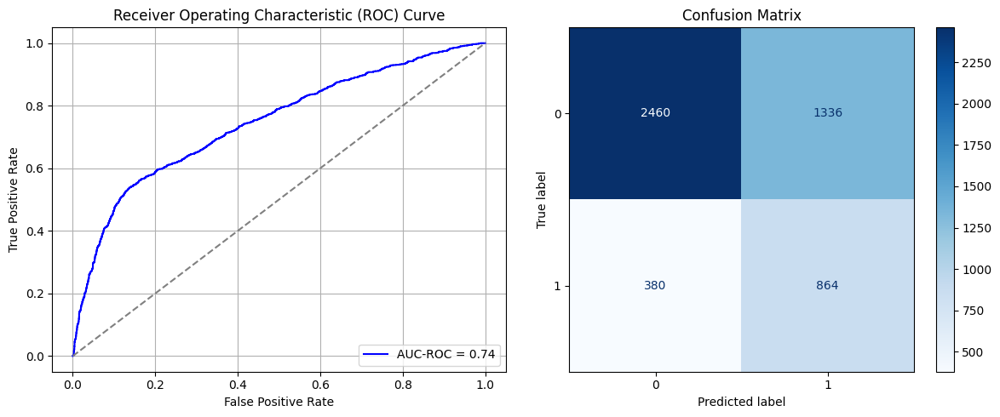

Best threshold based on F1-score: 0.9995393753051758
False Negative Rate: 0.3054662379421222
Time elapsed (performance): 0.7159584479995829
(np.float64(0.3519494204425711), np.float64(0.648050579557429))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6498 - loss: 0.6700 - val_AUC: 0.7216 - val_loss: 0.6091
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7166 - loss: 0.6065 - val_AUC: 0.7405 - val_loss: 0.5949
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7248 - loss: 0.6006 - val_AUC: 0.7506 - val_loss: 0.5833
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7379 - loss: 0.5940 - val_AUC: 0.7533 - val_loss: 0.5853
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7383 - loss: 0.5962 - val_AUC: 0.7580 - val_loss: 0.5775
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7449 - loss: 0.5890 - val_AUC: 0.7623 - val_loss: 0.5722
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7481 - loss: 0.5874 - val_AUC: 0.7619 - val_loss: 0.5747
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7551 - loss: 0.5792 - val_AUC: 0.7615 - val_loss: 0.5726
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7615 -

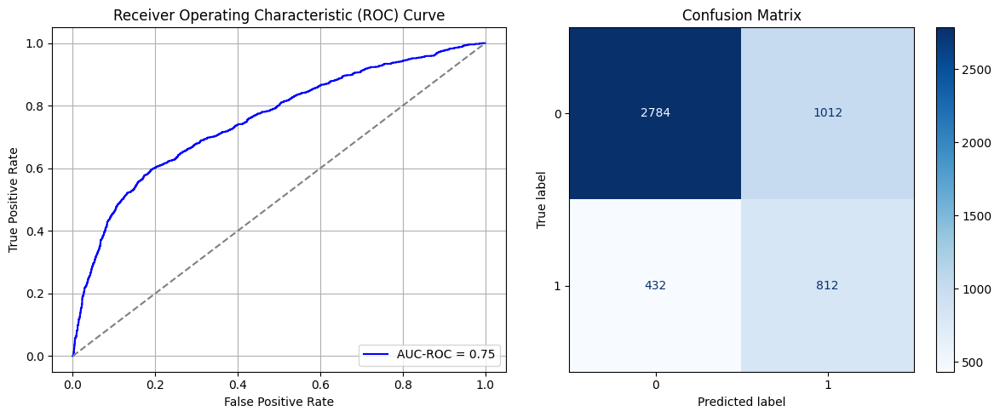

Best threshold based on F1-score: 0.9992268681526184
False Negative Rate: 0.34726688102893893
Time elapsed (performance): 0.6936798819997421
(np.float64(0.2665964172813488), np.float64(0.7334035827186511))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6392 - loss: 0.6678 - val_AUC: 0.7144 - val_loss: 0.6161
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7097 - loss: 0.6134 - val_AUC: 0.7353 - val_loss: 0.6017
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7368 - loss: 0.5920 - val_AUC: 0.7436 - val_loss: 0.5981
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7310 - loss: 0.5960 - val_AUC: 0.7466 - val_loss: 0.5899
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7424 - loss: 0.5893 - val_AUC: 0.7516 - val_loss: 0.5877
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7492 - loss: 0.5839 - val_AUC: 0.7533 - val_loss: 0.5849
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7488 - loss: 0.5845 - val_AUC: 0.7554 - val_loss: 0.5844
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.5851 - val_AUC: 0.7581 - val_loss: 0.5848
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7512 -

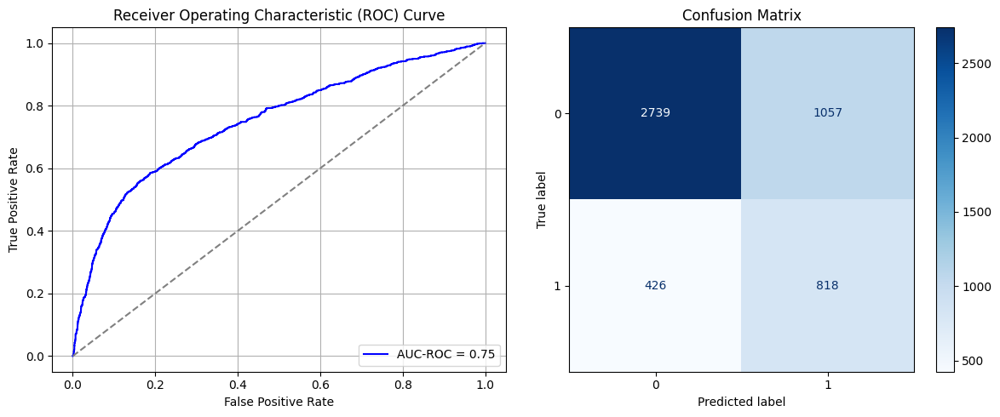

Best threshold based on F1-score: 0.9988868832588196
False Negative Rate: 0.342443729903537
Time elapsed (performance): 0.7153066350001609
(np.float64(0.27845100105374077), np.float64(0.7215489989462592))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6436 - loss: 0.6695 - val_AUC: 0.7130 - val_loss: 0.6140
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7164 - loss: 0.6075 - val_AUC: 0.7342 - val_loss: 0.5987
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7322 - loss: 0.5956 - val_AUC: 0.7463 - val_loss: 0.5860
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7556 - loss: 0.5806 - val_AUC: 0.7493 - val_loss: 0.5857
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7500 - loss: 0.5788 - val_AUC: 0.7520 - val_loss: 0.5806
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7546 - loss: 0.5811 - val_AUC: 0.7543 - val_loss: 0.5861
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7526 - loss: 0.5811 - val_AUC: 0.7554 - val_loss: 0.5804
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7610 - loss: 0.5765 - val_AUC: 0.7581 - val_loss: 0.5770
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7711 -

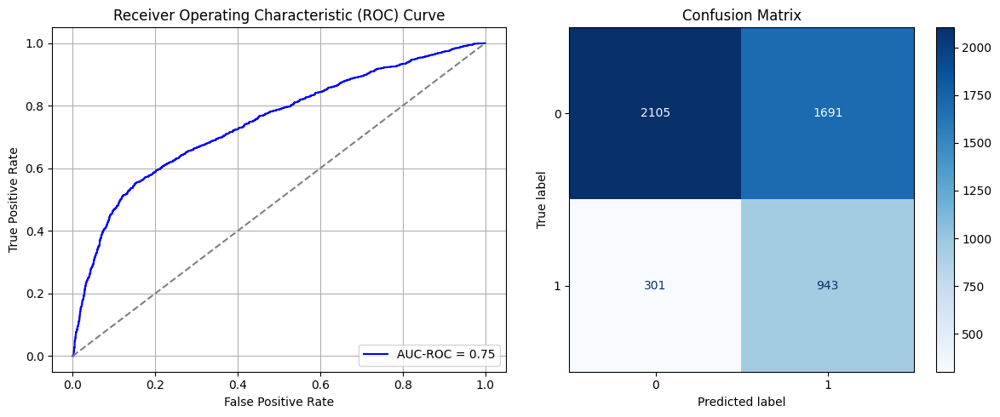

Best threshold based on F1-score: 0.9971928000450134
False Negative Rate: 0.24196141479099678
Time elapsed (performance): 0.6971199669997077
(np.float64(0.44546891464699684), np.float64(0.5545310853530032))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6294 - loss: 0.6686 - val_AUC: 0.7100 - val_loss: 0.6193
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7064 - loss: 0.6159 - val_AUC: 0.7284 - val_loss: 0.6034
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7317 - loss: 0.5948 - val_AUC: 0.7415 - val_loss: 0.5906
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7422 - loss: 0.5870 - val_AUC: 0.7447 - val_loss: 0.5870
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7430 - loss: 0.5846 - val_AUC: 0.7453 - val_loss: 0.5872
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5833 - val_AUC: 0.7498 - val_loss: 0.5826
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7509 - loss: 0.5839 - val_AUC: 0.7536 - val_loss: 0.5812
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7580 - loss: 0.5759 - val_AUC: 0.7527 - val_loss: 0.5805
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7664 -

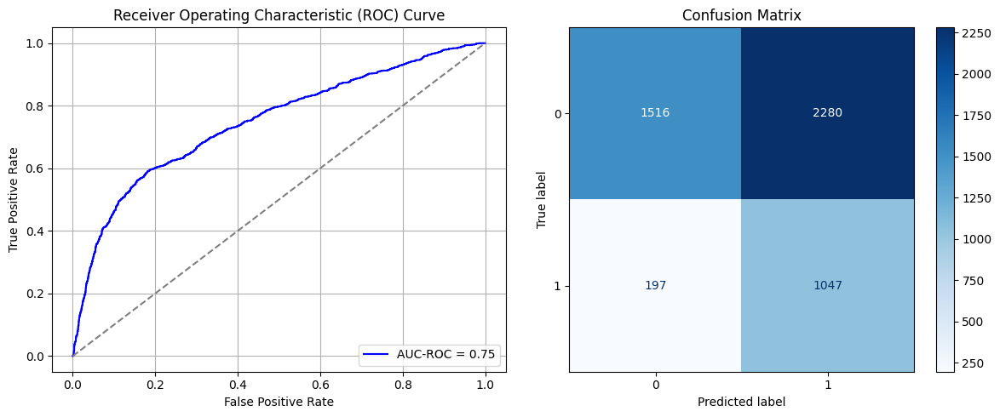

Best threshold based on F1-score: 0.9995166659355164
False Negative Rate: 0.15836012861736334
Time elapsed (performance): 0.704438019999543
(np.float64(0.6006322444678609), np.float64(0.3993677555321391))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6320 - loss: 0.6694 - val_AUC: 0.7204 - val_loss: 0.6115
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7254 - loss: 0.6011 - val_AUC: 0.7358 - val_loss: 0.5960
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7371 - loss: 0.5930 - val_AUC: 0.7435 - val_loss: 0.5885
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7327 - loss: 0.5924 - val_AUC: 0.7463 - val_loss: 0.5896
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7541 - loss: 0.5753 - val_AUC: 0.7514 - val_loss: 0.5834
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7494 - loss: 0.5792 - val_AUC: 0.7535 - val_loss: 0.5841
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7627 - loss: 0.5641 - val_AUC: 0.7540 - val_loss: 0.5827
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7604 - loss: 0.5713 - val_AUC: 0.7537 - val_loss: 0.5845
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7560 -

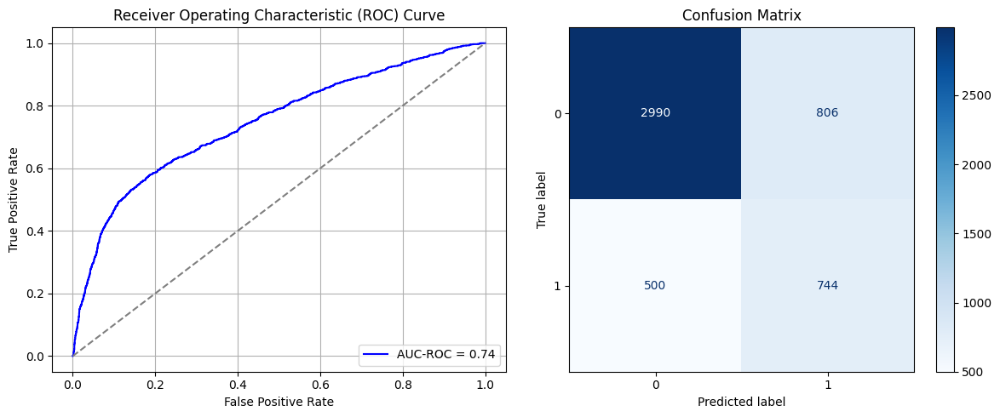

Best threshold based on F1-score: 0.9994332790374756
False Negative Rate: 0.40192926045016075
Time elapsed (performance): 0.6981295080004202
(np.float64(0.21232876712328766), np.float64(0.7876712328767124))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6515 - loss: 0.6635 - val_AUC: 0.7113 - val_loss: 0.6100
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7163 - loss: 0.6082 - val_AUC: 0.7292 - val_loss: 0.6065
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7377 - loss: 0.5899 - val_AUC: 0.7401 - val_loss: 0.5890
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7468 - loss: 0.5802 - val_AUC: 0.7446 - val_loss: 0.5851
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7464 - loss: 0.5758 - val_AUC: 0.7487 - val_loss: 0.5872
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7548 - loss: 0.5744 - val_AUC: 0.7516 - val_loss: 0.5861
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7675 - loss: 0.5628 - val_AUC: 0.7522 - val_loss: 0.5805
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7678 - loss: 0.5660 - val_AUC: 0.7551 - val_loss: 0.5800
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7713 -

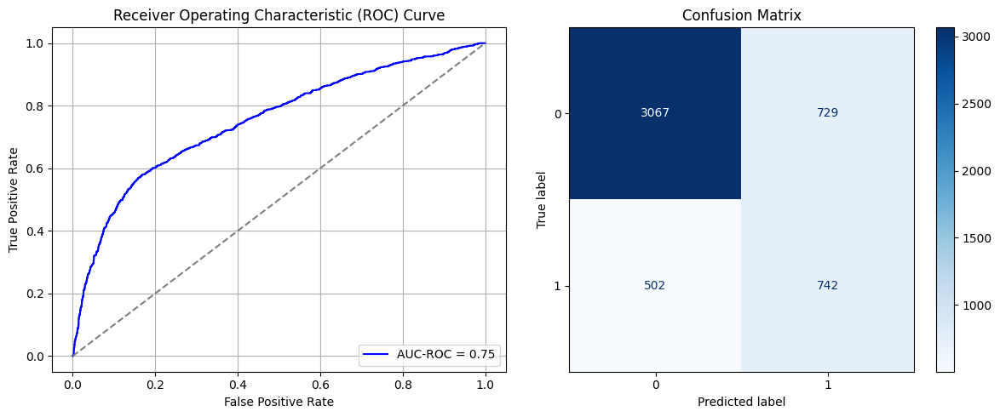

Best threshold based on F1-score: 0.9995754361152649
False Negative Rate: 0.40353697749196143
Time elapsed (performance): 0.6924300520004181
(np.float64(0.19204425711275025), np.float64(0.8079557428872497))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6459 - loss: 0.6661 - val_AUC: 0.7226 - val_loss: 0.6095
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.6099 - val_AUC: 0.7382 - val_loss: 0.5945
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.6111 - val_AUC: 0.7480 - val_loss: 0.5796
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7406 - loss: 0.5896 - val_AUC: 0.7560 - val_loss: 0.5750
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7270 - loss: 0.6006 - val_AUC: 0.7594 - val_loss: 0.5731
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7466 - loss: 0.5860 - val_AUC: 0.7637 - val_loss: 0.5709
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7449 - loss: 0.5838 - val_AUC: 0.7638 - val_loss: 0.5683
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7586 - loss: 0.5759 - val_AUC: 0.7621 - val_loss: 0.5699
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7571 -

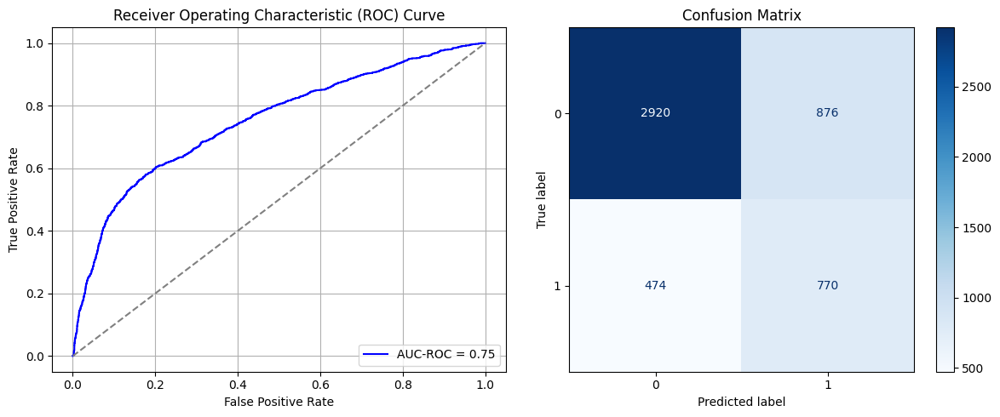

Best threshold based on F1-score: 0.9971010088920593
False Negative Rate: 0.38102893890675243
Time elapsed (performance): 0.6842503170000782
(np.float64(0.23076923076923078), np.float64(0.7692307692307692))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6410 - loss: 0.6654 - val_AUC: 0.7193 - val_loss: 0.6142
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6947 - loss: 0.6260 - val_AUC: 0.7365 - val_loss: 0.5973
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7281 - loss: 0.6041 - val_AUC: 0.7470 - val_loss: 0.5883
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7335 - loss: 0.5982 - val_AUC: 0.7508 - val_loss: 0.5854
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7399 - loss: 0.5922 - val_AUC: 0.7545 - val_loss: 0.5818
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7502 - loss: 0.5840 - val_AUC: 0.7539 - val_loss: 0.5814
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7541 - loss: 0.5819 - val_AUC: 0.7576 - val_loss: 0.5816
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7711 - loss: 0.5695 - val_AUC: 0.7596 - val_loss: 0.5802
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7709 -

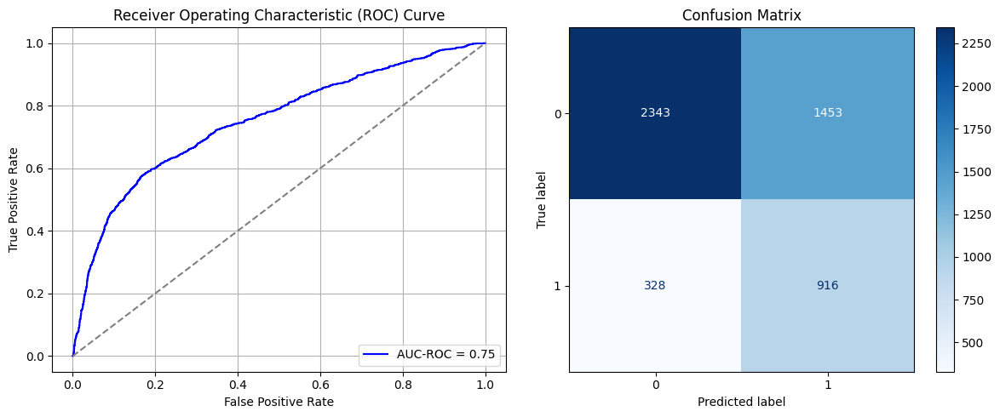

Best threshold based on F1-score: 0.9975919723510742
False Negative Rate: 0.26366559485530544
Time elapsed (performance): 0.7443641760000901
(np.float64(0.3827713382507903), np.float64(0.6172286617492098))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6416 - loss: 0.6693 - val_AUC: 0.7159 - val_loss: 0.6157
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7125 - loss: 0.6126 - val_AUC: 0.7276 - val_loss: 0.6057
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7182 - loss: 0.6115 - val_AUC: 0.7368 - val_loss: 0.6009
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7335 - loss: 0.6010 - val_AUC: 0.7416 - val_loss: 0.5950
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7313 - loss: 0.5978 - val_AUC: 0.7500 - val_loss: 0.5913
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7343 - loss: 0.5964 - val_AUC: 0.7537 - val_loss: 0.5867
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7487 - loss: 0.5820 - val_AUC: 0.7557 - val_loss: 0.5868
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7524 - loss: 0.5849 - val_AUC: 0.7574 - val_loss: 0.5848
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7570 -

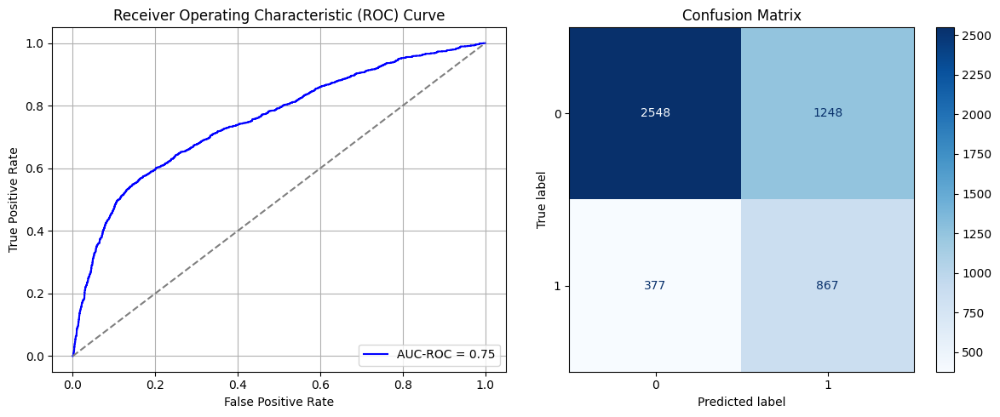

Best threshold based on F1-score: 0.9965070486068726
False Negative Rate: 0.30305466237942125
Time elapsed (performance): 1.092414534999989
(np.float64(0.3287671232876712), np.float64(0.6712328767123288))
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6491 - loss: 0.6640 - val_AUC: 0.7262 - val_loss: 0.6079
Epoch 2/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7155 - loss: 0.6076 - val_AUC: 0.7418 - val_loss: 0.5954
Epoch 3/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7301 - loss: 0.6014 - val_AUC: 0.7492 - val_loss: 0.5909
Epoch 4/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7307 - loss: 0.6018 - val_AUC: 0.7546 - val_loss: 0.5817
Epoch 5/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7471 - loss: 0.5916 - val_AUC: 0.7627 - val_loss: 0.5775
Epoch 6/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7462 - loss: 0.5920 - val_AUC: 0.7648 - val_loss: 0.5796
Epoch 7/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7534 - loss: 0.5869 - val_AUC: 0.7645 - val_loss: 0.5742
Epoch 8/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7459 - loss: 0.5880 - val_AUC: 0.7677 - val_loss: 0.5719
Epoch 9/10
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7609 -

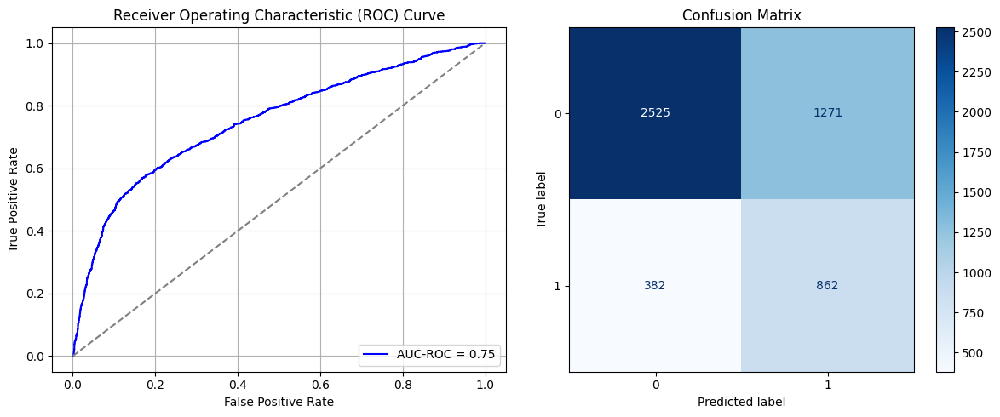

Best threshold based on F1-score: 0.9992431402206421
False Negative Rate: 0.3070739549839228
Time elapsed (performance): 0.7379431500003193
(np.float64(0.33482613277133827), np.float64(0.6651738672286618))
    Source time       FPR       TNR       FNR       TPR  Target time
0     10.491316  0.272655  0.727345  0.357717  0.642283     0.718490
1     10.852364  0.297945  0.702055  0.331994  0.668006     2.482931
2     12.963085  0.458114  0.541886  0.244373  0.755627     0.690284
3     12.153408  0.210485  0.789515  0.390675  0.609325     0.717090
4     12.396076  0.284773  0.715227  0.327974  0.672026     0.720804
5     13.988205  0.235248  0.764752  0.377010  0.622990     0.742579
6     14.497686  0.315068  0.684932  0.322347  0.677653     1.166032
7     12.340085  0.327977  0.672023  0.302251  0.697749     0.739112
8     12.652866  0.273973  0.726027  0.352090  0.647910     0.669694
9     12.246793  0.351949  0.648051  0.305466  0.694534     0.715958
10    12.856250  0.266596  0.733404

<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


In [74]:
import random

times = 20

Training_time = []
FPR = []
TPR = []
FNR = []
TNR = []
TL_time = []

m = 10

k = oversample_size/undersample_size * m
print(k)

# np.random.seed(123)

for i in range(times):
    start = np.random.choice(int(k), 10)
    # print(start)

    Row = []

    Row = []

    for j in range(len(start)):
      for l in range(int(undersample_size/m)):
        row = start[j]+int(k*l)-1
        Row.append(row)

    # print(Row)

    data_S_maj_rus = pd.DataFrame()
    data_S_maj_rus = data_S_majority.iloc[Row]

    data_S_Sy_RUS = pd.concat([data_S_maj_rus, data_S_minority])
    X_S_Sy = data_S_Sy_RUS.iloc[:, :-1]
    y_S_Sy = data_S_Sy_RUS.iloc[:, -1]
    X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
    model_Sy = create_dnn_model(X_S_train.shape[1])
    result_Sy = train_and_evaluate(model_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
    result_TL_Sy = Transductive_TL(model_Sy, X_T_full, y_T_full, "Target")
    print(result_TL_Sy[0:2])

    Training_time.append(result_Sy)
    FPR.append(result_TL_Sy[0])
    TNR.append(result_TL_Sy[1])
    FNR.append(result_TL_Sy[2])
    TPR.append(result_TL_Sy[3])
    TL_time.append(result_TL_Sy[4])

# return fpr, tnr, fnr, tpr, time_elapsed

# print(TNR)

ParamFit = pd.DataFrame([Training_time, FPR, TNR, FNR, TPR, TL_time]).T
ParamFit.columns=['Source time', 'FPR', 'TNR', 'FNR', 'TPR', 'Target time']
print(ParamFit)

In [75]:
print(ParamFit)
ParamFit.to_csv('Sy2_RUS.csv')

    Source time       FPR       TNR       FNR       TPR  Target time
0     10.491316  0.272655  0.727345  0.357717  0.642283     0.718490
1     10.852364  0.297945  0.702055  0.331994  0.668006     2.482931
2     12.963085  0.458114  0.541886  0.244373  0.755627     0.690284
3     12.153408  0.210485  0.789515  0.390675  0.609325     0.717090
4     12.396076  0.284773  0.715227  0.327974  0.672026     0.720804
5     13.988205  0.235248  0.764752  0.377010  0.622990     0.742579
6     14.497686  0.315068  0.684932  0.322347  0.677653     1.166032
7     12.340085  0.327977  0.672023  0.302251  0.697749     0.739112
8     12.652866  0.273973  0.726027  0.352090  0.647910     0.669694
9     12.246793  0.351949  0.648051  0.305466  0.694534     0.715958
10    12.856250  0.266596  0.733404  0.347267  0.652733     0.693680
11    12.626673  0.278451  0.721549  0.342444  0.657556     0.715307
12    12.681757  0.445469  0.554531  0.241961  0.758039     0.697120
13    11.950317  0.600632  0.39936

# Random Oversampling (ROS):

## Simple Random Sampling with Replacement:

In this case, we investigate the effectiveness of Random Oversampling methods, beginning with Simple Random Sampling (SRS) with replacement. For this, we perform random resampling from the minority class of size $N_1$ to generate an additional sample of size $N_0-N_1$, such that the oversampled minority class will have the same size as the majority class.

In [76]:
data_S
data_S_majority = data_S[data_S['Y'].isin([0])]
data_S_minority = data_S[data_S['Y'].isin([1])]

undersample_size = data_S_minority['Y'].size
oversample_size = data_S_majority['Y'].size

print(undersample_size)
print(oversample_size)

5366
19249


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6734 - loss: 0.6419 - val_AUC: 0.7459 - val_loss: 0.5868
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7342 - loss: 0.5937 - val_AUC: 0.7543 - val_loss: 0.5787
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7503 - loss: 0.5803 - val_AUC: 0.7628 - val_loss: 0.5729
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7608 - loss: 0.5747 - val_AUC: 0.7755 - val_loss: 0.5677
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7708 - loss: 0.5672 - val_AUC: 0.7793 - val_loss: 0.5639
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7719 - loss: 0.5676 - val_AUC: 0.7855 - val_loss: 0.5603
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7807 - loss: 0.5584 - val_AUC: 0.7881 - val_loss: 0.5552
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7876 - loss: 0.5530 - val_AUC: 0.7837 - val_loss: 0.5609
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7815 -

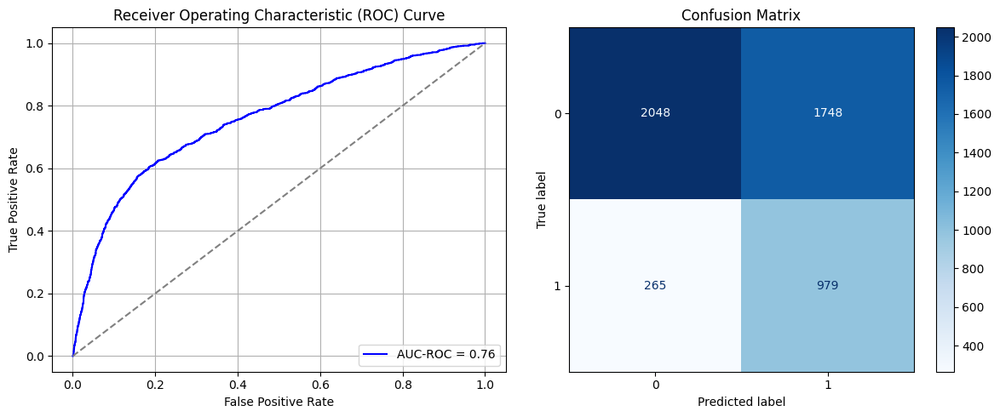

Best threshold based on F1-score: 0.6494274735450745
False Negative Rate: 0.21302250803858522
Time elapsed (performance): 0.7294502140002805
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6878 - loss: 0.6325 - val_AUC: 0.7382 - val_loss: 0.5936
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7445 - loss: 0.5858 - val_AUC: 0.7461 - val_loss: 0.5837
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7572 - loss: 0.5771 - val_AUC: 0.7564 - val_loss: 0.5823
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7662 - loss: 0.5709 - val_AUC: 0.7711 - val_loss: 0.5713
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7725 - loss: 0.5650 - val_AUC: 0.7732 - val_loss: 0.5674
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7734 - loss: 0.5657 - val_AUC: 0.7768 - val_loss: 0.5659
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7766 - loss: 0.5628 - val_AUC: 0.7766 - val_loss: 0.5640
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7790 - loss: 0.5605 - val_AUC: 0.7673 - val_loss: 0.5763
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7824 -

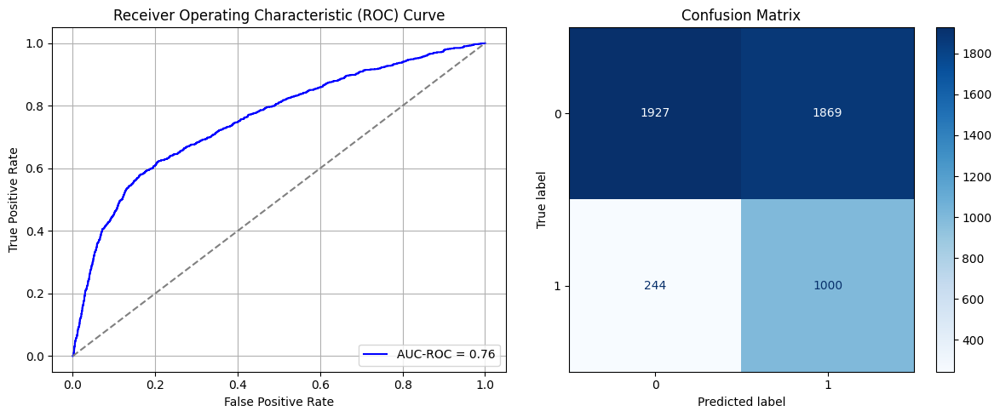

Best threshold based on F1-score: 0.9951775670051575
False Negative Rate: 0.19614147909967847
Time elapsed (performance): 0.73317043499992
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6908 - loss: 0.6340 - val_AUC: 0.7477 - val_loss: 0.5842
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7473 - loss: 0.5865 - val_AUC: 0.7577 - val_loss: 0.5776
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7525 - loss: 0.5817 - val_AUC: 0.7582 - val_loss: 0.5778
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7639 - loss: 0.5735 - val_AUC: 0.7714 - val_loss: 0.5663
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7685 - loss: 0.5693 - val_AUC: 0.7755 - val_loss: 0.5628
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7708 - loss: 0.5670 - val_AUC: 0.7779 - val_loss: 0.5631
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7708 - loss: 0.5670 - val_AUC: 0.7798 - val_loss: 0.5586
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7806 - loss: 0.5565 - val_AUC: 0.7828 - val_loss: 0.5576
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7755 -

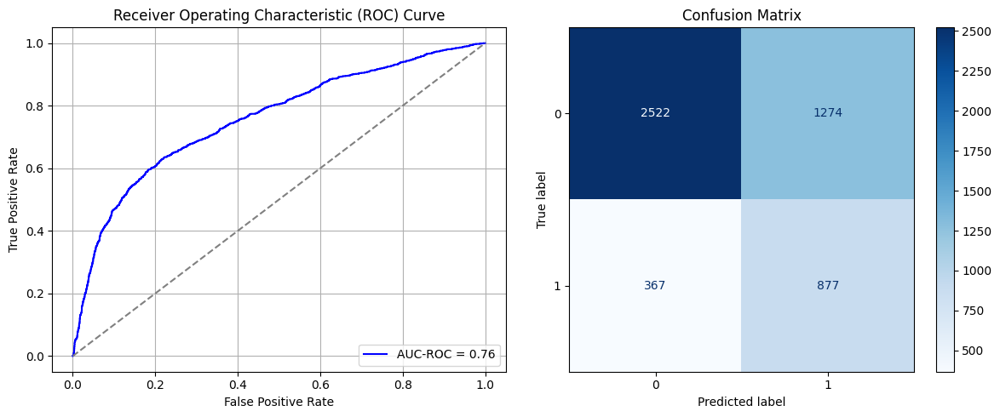

Best threshold based on F1-score: 0.9986095428466797
False Negative Rate: 0.295016077170418
Time elapsed (performance): 1.1031001660003312
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6730 - loss: 0.6391 - val_AUC: 0.7406 - val_loss: 0.5888
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7479 - loss: 0.5829 - val_AUC: 0.7577 - val_loss: 0.5773
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7537 - loss: 0.5797 - val_AUC: 0.7648 - val_loss: 0.5752
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7613 - loss: 0.5752 - val_AUC: 0.7686 - val_loss: 0.5709
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7647 - loss: 0.5708 - val_AUC: 0.7773 - val_loss: 0.5664
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7750 - loss: 0.5656 - val_AUC: 0.7827 - val_loss: 0.5595
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7821 - loss: 0.5569 - val_AUC: 0.7824 - val_loss: 0.5653
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7820 - loss: 0.5589 - val_AUC: 0.7859 - val_loss: 0.5555
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7812 -

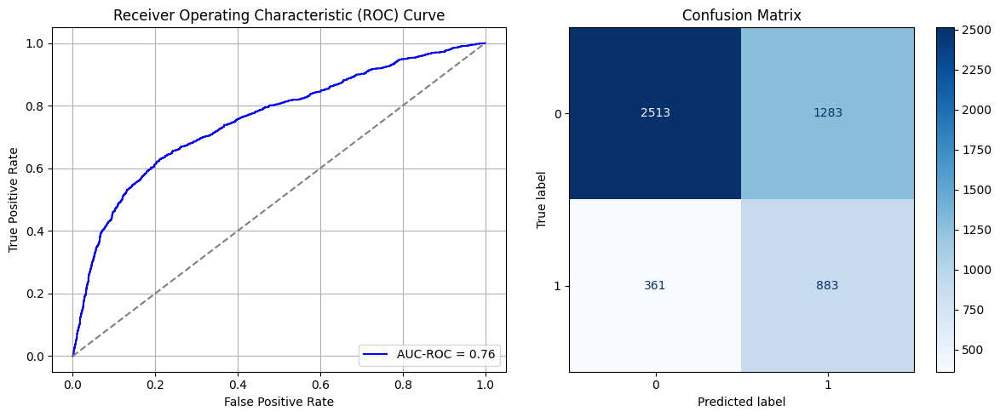

Best threshold based on F1-score: 0.9948232173919678
False Negative Rate: 0.29019292604501606
Time elapsed (performance): 0.728427792999355
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6807 - loss: 0.6340 - val_AUC: 0.7524 - val_loss: 0.5831
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7460 - loss: 0.5841 - val_AUC: 0.7640 - val_loss: 0.5741
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7622 - loss: 0.5715 - val_AUC: 0.7687 - val_loss: 0.5737
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7646 - loss: 0.5711 - val_AUC: 0.7785 - val_loss: 0.5630
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7682 - loss: 0.5697 - val_AUC: 0.7815 - val_loss: 0.5604
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7761 - loss: 0.5616 - val_AUC: 0.7855 - val_loss: 0.5575
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7765 - loss: 0.5648 - val_AUC: 0.7817 - val_loss: 0.5631
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7807 - loss: 0.5573 - val_AUC: 0.7867 - val_loss: 0.5665
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7817 -

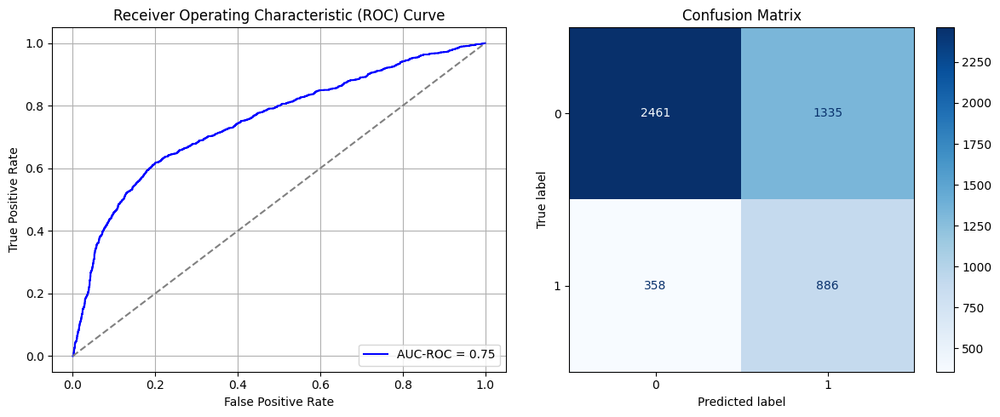

Best threshold based on F1-score: 0.5899767875671387
False Negative Rate: 0.2877813504823151
Time elapsed (performance): 0.7253636590003225
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6830 - loss: 0.6363 - val_AUC: 0.7391 - val_loss: 0.5909
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7434 - loss: 0.5886 - val_AUC: 0.7532 - val_loss: 0.5815
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7535 - loss: 0.5798 - val_AUC: 0.7645 - val_loss: 0.5745
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7628 - loss: 0.5740 - val_AUC: 0.7681 - val_loss: 0.5702
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7739 - loss: 0.5640 - val_AUC: 0.7750 - val_loss: 0.5660
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7693 - loss: 0.5686 - val_AUC: 0.7768 - val_loss: 0.5639
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7772 - loss: 0.5613 - val_AUC: 0.7793 - val_loss: 0.5603
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7743 - loss: 0.5626 - val_AUC: 0.7768 - val_loss: 0.5637
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7812 -

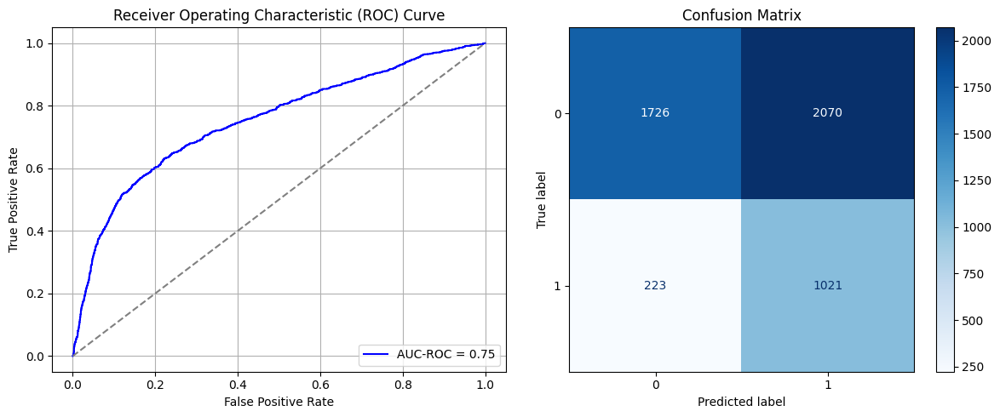

Best threshold based on F1-score: 0.995033860206604
False Negative Rate: 0.17926045016077172
Time elapsed (performance): 0.6948166649999621
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6762 - loss: 0.6411 - val_AUC: 0.7418 - val_loss: 0.5905
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7452 - loss: 0.5868 - val_AUC: 0.7538 - val_loss: 0.5819
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7510 - loss: 0.5790 - val_AUC: 0.7634 - val_loss: 0.5816
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7547 - loss: 0.5784 - val_AUC: 0.7688 - val_loss: 0.5713
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7690 - loss: 0.5693 - val_AUC: 0.7736 - val_loss: 0.5767
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7723 - loss: 0.5663 - val_AUC: 0.7784 - val_loss: 0.5623
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7727 - loss: 0.5663 - val_AUC: 0.7802 - val_loss: 0.5624
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7769 - loss: 0.5606 - val_AUC: 0.7832 - val_loss: 0.5576
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7823 -

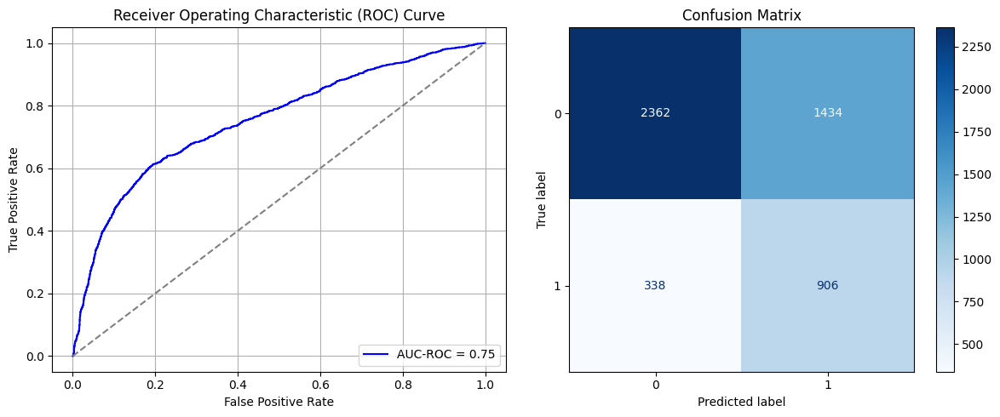

Best threshold based on F1-score: 0.639630138874054
False Negative Rate: 0.2717041800643087
Time elapsed (performance): 1.0144715119995453
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6739 - loss: 0.6387 - val_AUC: 0.7452 - val_loss: 0.5987
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7407 - loss: 0.5923 - val_AUC: 0.7555 - val_loss: 0.5811
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7548 - loss: 0.5825 - val_AUC: 0.7615 - val_loss: 0.5820
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7583 - loss: 0.5788 - val_AUC: 0.7721 - val_loss: 0.5702
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7654 - loss: 0.5703 - val_AUC: 0.7696 - val_loss: 0.5702
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7748 - loss: 0.5617 - val_AUC: 0.7806 - val_loss: 0.5626
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7751 - loss: 0.5631 - val_AUC: 0.7842 - val_loss: 0.5588
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7790 - loss: 0.5607 - val_AUC: 0.7823 - val_loss: 0.5593
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7833 -

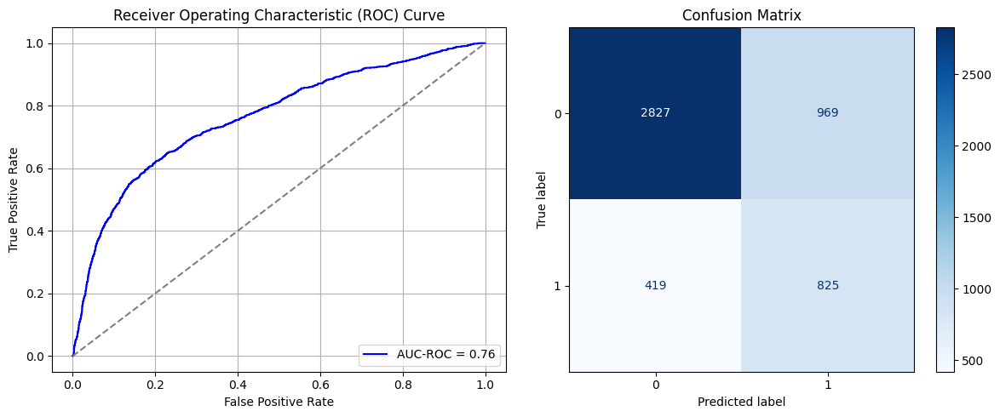

Best threshold based on F1-score: 0.9968070983886719
False Negative Rate: 0.33681672025723475
Time elapsed (performance): 0.7137664299998505
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6651 - loss: 0.6439 - val_AUC: 0.7504 - val_loss: 0.5849
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7439 - loss: 0.5879 - val_AUC: 0.7629 - val_loss: 0.5753
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7540 - loss: 0.5798 - val_AUC: 0.7708 - val_loss: 0.5676
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7689 - loss: 0.5682 - val_AUC: 0.7756 - val_loss: 0.5638
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7688 - loss: 0.5701 - val_AUC: 0.7779 - val_loss: 0.5693
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7736 - loss: 0.5634 - val_AUC: 0.7815 - val_loss: 0.5589
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7731 - loss: 0.5643 - val_AUC: 0.7826 - val_loss: 0.5600
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - AUC: 0.7765 - loss: 0.5609 - val_AUC: 0.7836 - val_loss: 0.5592
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7738 -

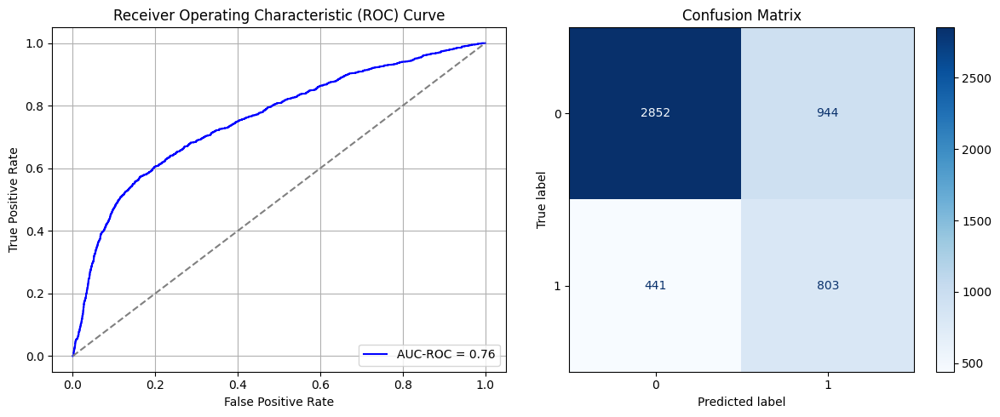

Best threshold based on F1-score: 0.9663506746292114
False Negative Rate: 0.3545016077170418
Time elapsed (performance): 0.6752956030004498
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6698 - loss: 0.6395 - val_AUC: 0.7408 - val_loss: 0.5921
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7425 - loss: 0.5854 - val_AUC: 0.7515 - val_loss: 0.5817
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7518 - loss: 0.5807 - val_AUC: 0.7546 - val_loss: 0.5803
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7617 - loss: 0.5720 - val_AUC: 0.7631 - val_loss: 0.5741
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7672 - loss: 0.5695 - val_AUC: 0.7631 - val_loss: 0.5732
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7652 - loss: 0.5704 - val_AUC: 0.7670 - val_loss: 0.5716
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7682 - loss: 0.5700 - val_AUC: 0.7735 - val_loss: 0.5660
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7810 - loss: 0.5569 - val_AUC: 0.7756 - val_loss: 0.5647
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7804 -

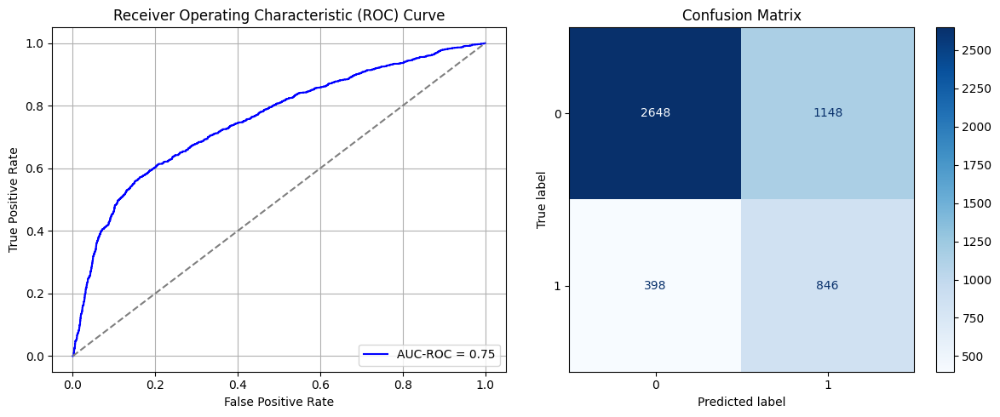

Best threshold based on F1-score: 0.992160439491272
False Negative Rate: 0.319935691318328
Time elapsed (performance): 0.7366624239994053
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6867 - loss: 0.6373 - val_AUC: 0.7442 - val_loss: 0.5879
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.7427 - loss: 0.5876 - val_AUC: 0.7579 - val_loss: 0.5797
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7630 - loss: 0.5733 - val_AUC: 0.7654 - val_loss: 0.5770
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7653 - loss: 0.5713 - val_AUC: 0.7736 - val_loss: 0.5681
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7719 - loss: 0.5667 - val_AUC: 0.7794 - val_loss: 0.5627
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7767 - loss: 0.5613 - val_AUC: 0.7825 - val_loss: 0.5598
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7793 - loss: 0.5584 - val_AUC: 0.7827 - val_loss: 0.5606
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7838 - loss: 0.5545 - val_AUC: 0.7836 - val_loss: 0.5583
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7827 -

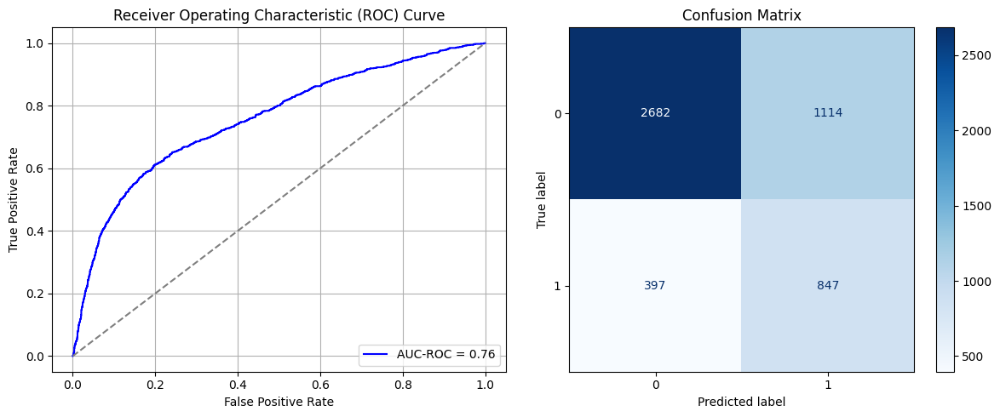

Best threshold based on F1-score: 0.9963125586509705
False Negative Rate: 0.31913183279742763
Time elapsed (performance): 0.733167627999137
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6829 - loss: 0.6339 - val_AUC: 0.7404 - val_loss: 0.5923
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7475 - loss: 0.5884 - val_AUC: 0.7537 - val_loss: 0.5832
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7553 - loss: 0.5811 - val_AUC: 0.7636 - val_loss: 0.5742
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7658 - loss: 0.5708 - val_AUC: 0.7709 - val_loss: 0.5698
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7721 - loss: 0.5684 - val_AUC: 0.7749 - val_loss: 0.5710
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7790 - loss: 0.5609 - val_AUC: 0.7794 - val_loss: 0.5635
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7839 - loss: 0.5567 - val_AUC: 0.7807 - val_loss: 0.5618
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7836 - loss: 0.5562 - val_AUC: 0.7827 - val_loss: 0.5581
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7870 -

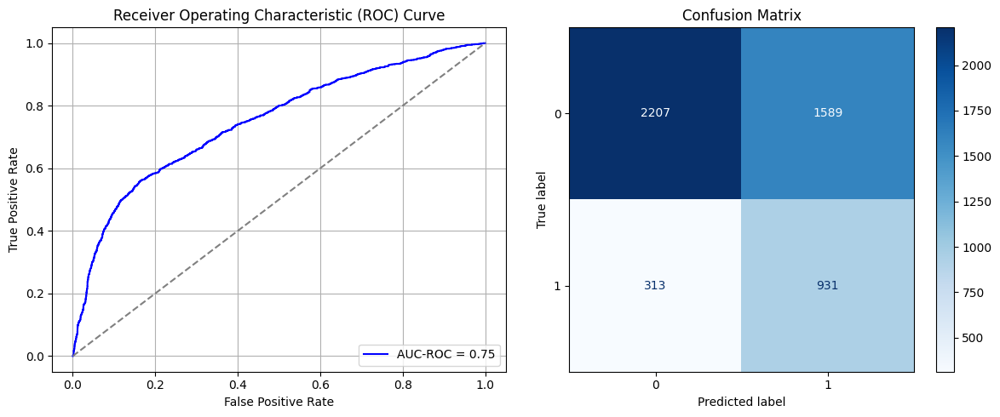

Best threshold based on F1-score: 0.6475285291671753
False Negative Rate: 0.2516077170418006
Time elapsed (performance): 0.7534802530008164
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6906 - loss: 0.6322 - val_AUC: 0.7603 - val_loss: 0.5821
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7472 - loss: 0.5849 - val_AUC: 0.7668 - val_loss: 0.5739
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7573 - loss: 0.5776 - val_AUC: 0.7717 - val_loss: 0.5737
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7609 - loss: 0.5762 - val_AUC: 0.7815 - val_loss: 0.5639
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7696 - loss: 0.5678 - val_AUC: 0.7827 - val_loss: 0.5633
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7710 - loss: 0.5680 - val_AUC: 0.7881 - val_loss: 0.5583
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7742 - loss: 0.5655 - val_AUC: 0.7894 - val_loss: 0.5539
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7753 - loss: 0.5629 - val_AUC: 0.7911 - val_loss: 0.5546
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - AUC: 0.7783 -

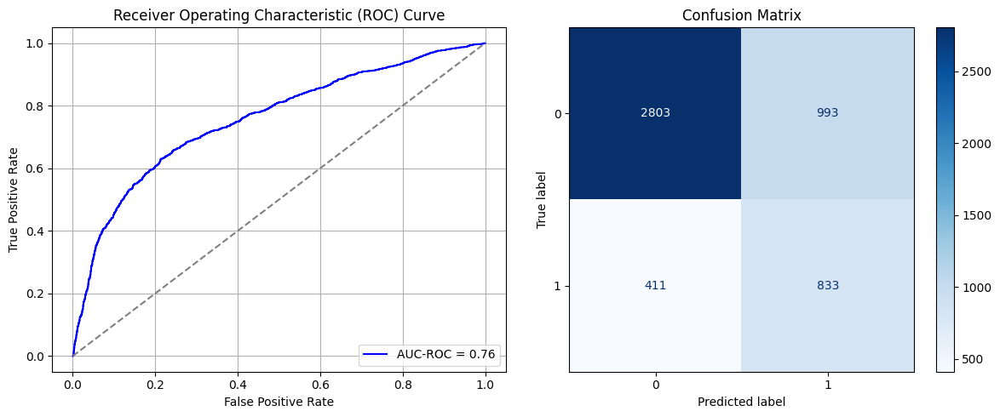

Best threshold based on F1-score: 0.5324926972389221
False Negative Rate: 0.33038585209003213
Time elapsed (performance): 0.6633695250002347
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6792 - loss: 0.6391 - val_AUC: 0.7387 - val_loss: 0.5942
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7461 - loss: 0.5847 - val_AUC: 0.7492 - val_loss: 0.5873
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7554 - loss: 0.5804 - val_AUC: 0.7576 - val_loss: 0.5801
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7643 - loss: 0.5705 - val_AUC: 0.7639 - val_loss: 0.5774
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7698 - loss: 0.5670 - val_AUC: 0.7689 - val_loss: 0.5725
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7736 - loss: 0.5656 - val_AUC: 0.7693 - val_loss: 0.5710
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7786 - loss: 0.5611 - val_AUC: 0.7701 - val_loss: 0.5702
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7809 - loss: 0.5570 - val_AUC: 0.7727 - val_loss: 0.5685
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7823 -

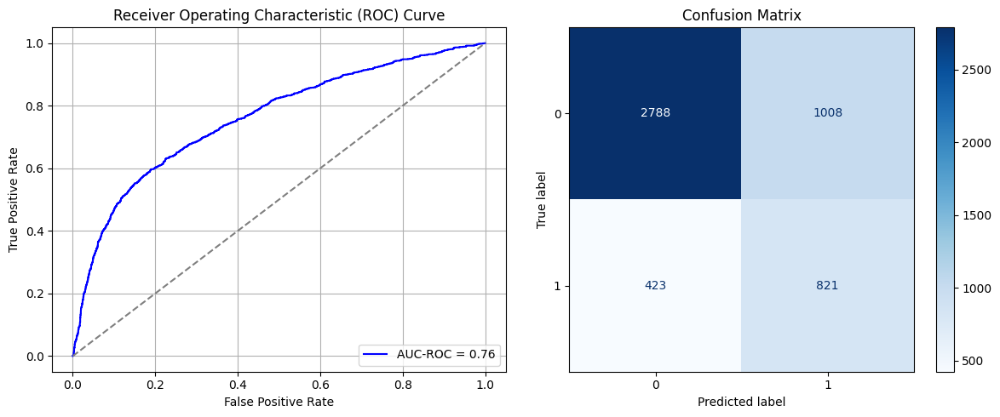

Best threshold based on F1-score: 0.9978706240653992
False Negative Rate: 0.340032154340836
Time elapsed (performance): 0.7114766730001065
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6858 - loss: 0.6364 - val_AUC: 0.7430 - val_loss: 0.5888
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7550 - loss: 0.5808 - val_AUC: 0.7535 - val_loss: 0.5808
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7510 - loss: 0.5834 - val_AUC: 0.7628 - val_loss: 0.5733
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7645 - loss: 0.5697 - val_AUC: 0.7674 - val_loss: 0.5715
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7692 - loss: 0.5707 - val_AUC: 0.7732 - val_loss: 0.5690
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7709 - loss: 0.5673 - val_AUC: 0.7796 - val_loss: 0.5647
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7786 - loss: 0.5611 - val_AUC: 0.7802 - val_loss: 0.5651
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7726 - loss: 0.5661 - val_AUC: 0.7825 - val_loss: 0.5600
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7783 -

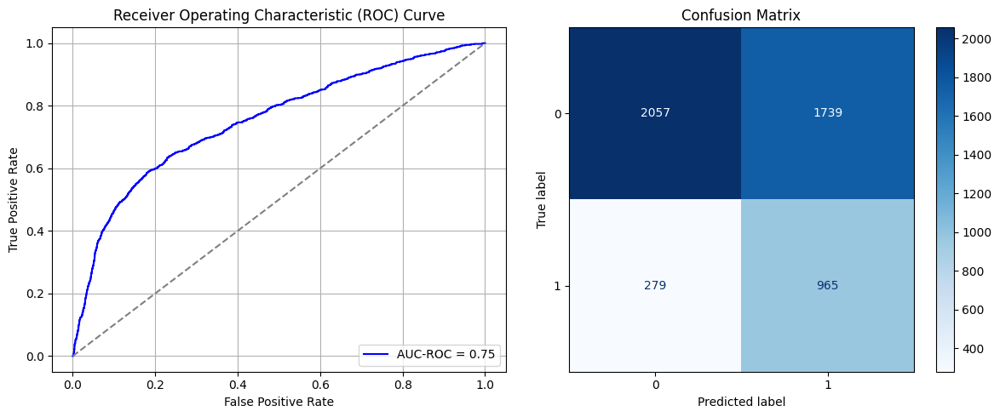

Best threshold based on F1-score: 0.6530386805534363
False Negative Rate: 0.22427652733118972
Time elapsed (performance): 1.2189500120002776
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6989 - loss: 0.6283 - val_AUC: 0.7362 - val_loss: 0.6008
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7500 - loss: 0.5839 - val_AUC: 0.7525 - val_loss: 0.5849
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7574 - loss: 0.5772 - val_AUC: 0.7643 - val_loss: 0.5766
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7666 - loss: 0.5705 - val_AUC: 0.7710 - val_loss: 0.5720
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7772 - loss: 0.5620 - val_AUC: 0.7741 - val_loss: 0.5677
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7778 - loss: 0.5602 - val_AUC: 0.7774 - val_loss: 0.5658
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7802 - loss: 0.5587 - val_AUC: 0.7793 - val_loss: 0.5638
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7871 - loss: 0.5510 - val_AUC: 0.7799 - val_loss: 0.5718
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7885 -

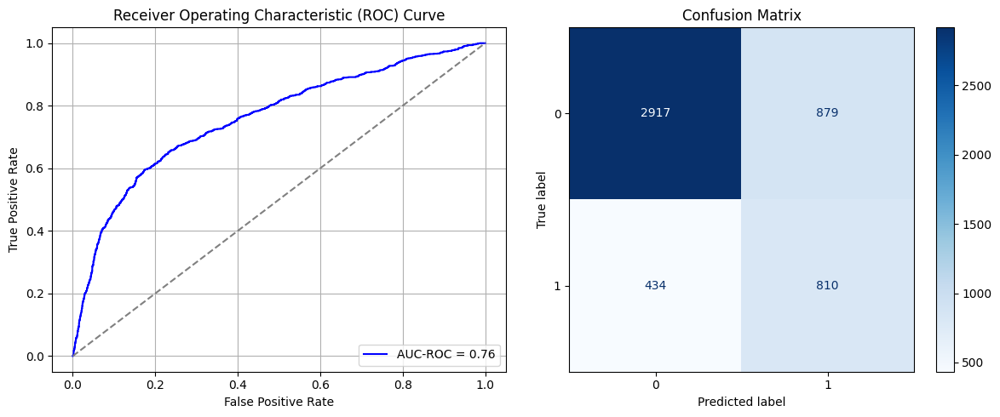

Best threshold based on F1-score: 0.9891031384468079
False Negative Rate: 0.34887459807073956
Time elapsed (performance): 0.7232449670000278
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6806 - loss: 0.6352 - val_AUC: 0.7448 - val_loss: 0.5949
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7465 - loss: 0.5868 - val_AUC: 0.7535 - val_loss: 0.5799
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7533 - loss: 0.5809 - val_AUC: 0.7599 - val_loss: 0.5785
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7626 - loss: 0.5718 - val_AUC: 0.7671 - val_loss: 0.5717
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7703 - loss: 0.5664 - val_AUC: 0.7737 - val_loss: 0.5683
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7763 - loss: 0.5633 - val_AUC: 0.7762 - val_loss: 0.5631
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7782 - loss: 0.5611 - val_AUC: 0.7793 - val_loss: 0.5631
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7800 - loss: 0.5600 - val_AUC: 0.7811 - val_loss: 0.5608
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7880 -

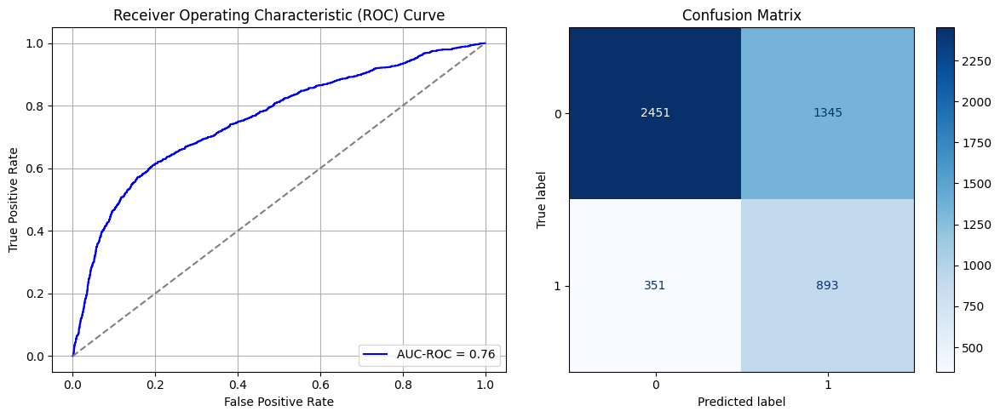

Best threshold based on F1-score: 0.9926877021789551
False Negative Rate: 0.2821543408360129
Time elapsed (performance): 0.7212615089993051
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6799 - loss: 0.6362 - val_AUC: 0.7460 - val_loss: 0.5882
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7486 - loss: 0.5847 - val_AUC: 0.7564 - val_loss: 0.5789
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7588 - loss: 0.5765 - val_AUC: 0.7670 - val_loss: 0.5710
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7617 - loss: 0.5761 - val_AUC: 0.7724 - val_loss: 0.5681
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7703 - loss: 0.5663 - val_AUC: 0.7746 - val_loss: 0.5660
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7838 - loss: 0.5545 - val_AUC: 0.7778 - val_loss: 0.5616
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7793 - loss: 0.5592 - val_AUC: 0.7808 - val_loss: 0.5605
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7812 - loss: 0.5576 - val_AUC: 0.7827 - val_loss: 0.5588
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7781 -

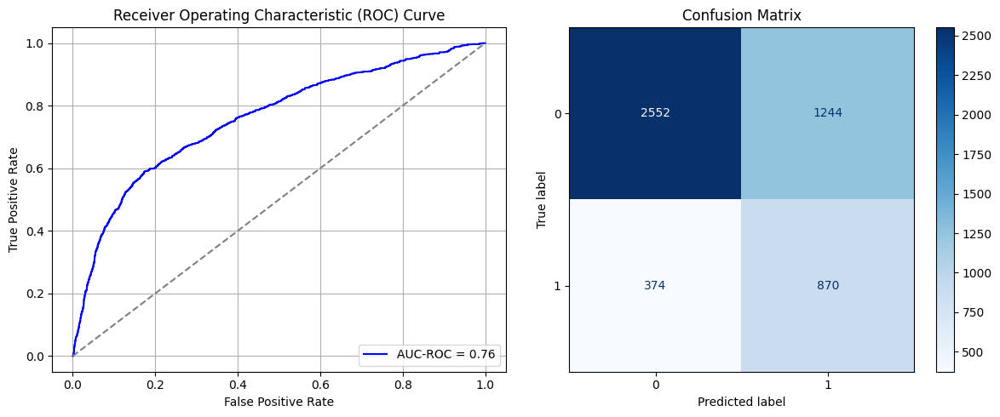

Best threshold based on F1-score: 0.6125498414039612
False Negative Rate: 0.30064308681672025
Time elapsed (performance): 0.9900816529998338
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7005 - loss: 0.6252 - val_AUC: 0.7392 - val_loss: 0.5920
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7517 - loss: 0.5819 - val_AUC: 0.7515 - val_loss: 0.5827
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7609 - loss: 0.5746 - val_AUC: 0.7593 - val_loss: 0.5780
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7683 - loss: 0.5705 - val_AUC: 0.7692 - val_loss: 0.5712
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7779 - loss: 0.5598 - val_AUC: 0.7667 - val_loss: 0.5740
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7831 - loss: 0.5559 - val_AUC: 0.7772 - val_loss: 0.5703
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7774 - loss: 0.5610 - val_AUC: 0.7756 - val_loss: 0.5647
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7812 - loss: 0.5574 - val_AUC: 0.7770 - val_loss: 0.5667
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7811 -

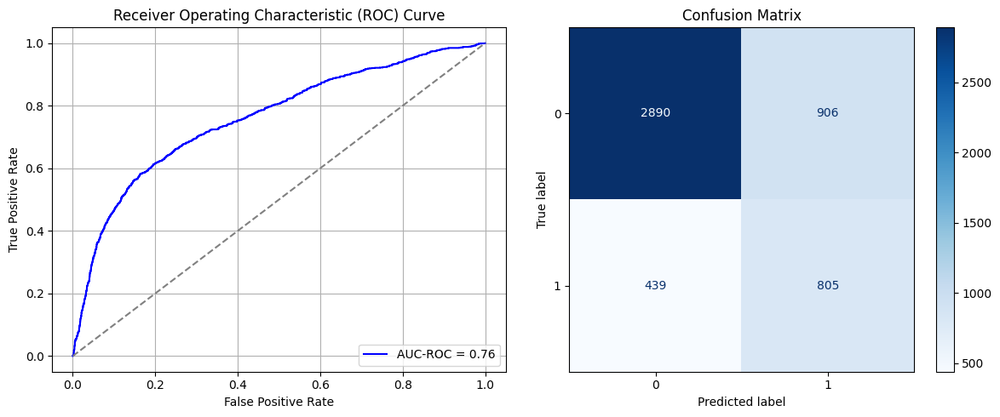

Best threshold based on F1-score: 0.9920350909233093
False Negative Rate: 0.3528938906752412
Time elapsed (performance): 0.7145957900002031
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


770/770 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - AUC: 0.6979 - loss: 0.6314 - val_AUC: 0.7526 - val_loss: 0.5853
Epoch 2/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7505 - loss: 0.5818 - val_AUC: 0.7641 - val_loss: 0.5756
Epoch 3/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7611 - loss: 0.5745 - val_AUC: 0.7674 - val_loss: 0.5713
Epoch 4/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7682 - loss: 0.5694 - val_AUC: 0.7798 - val_loss: 0.5664
Epoch 5/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7766 - loss: 0.5616 - val_AUC: 0.7826 - val_loss: 0.5592
Epoch 6/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7796 - loss: 0.5590 - val_AUC: 0.7839 - val_loss: 0.5629
Epoch 7/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7832 - loss: 0.5549 - val_AUC: 0.7858 - val_loss: 0.5567
Epoch 8/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7913 - loss: 0.5482 - val_AUC: 0.7882 - val_loss: 0.5559
Epoch 9/10
770/770 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7899 -

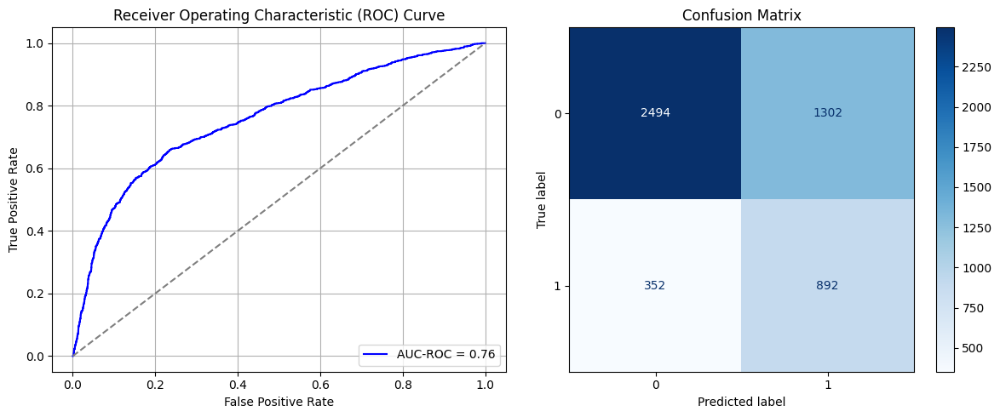

Best threshold based on F1-score: 0.6637271642684937
False Negative Rate: 0.2829581993569132
Time elapsed (performance): 0.7536137330007477


In [78]:
times = 20

Training_time = []
FPR = []
TPR = []
FNR = []
TNR = []
TL_time = []


for i in range(times):
    data_S_min_ros = data_S_minority.sample(n=oversample_size - undersample_size, replace=True)
    data_S_SRS_ROS = pd.concat([data_S_majority, data_S_min_ros, data_S_minority])
    X_S_SRS_ROS = data_S_SRS_ROS.iloc[:, :-1]
    y_S_SRS_ROS = data_S_SRS_ROS.iloc[:, -1]
    X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS_ROS, y_S_SRS_ROS, test_size=0.20, random_state=0)
    model_SRS_ROS = create_dnn_model(X_S_train.shape[1])
    result_SRS_ROS = train_and_evaluate(model_SRS_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
    result_TL_SRS_ROS = Transductive_TL(model_SRS_ROS, X_T_full, y_T_full, "Target")

    Training_time.append(result_SRS_ROS)
    FPR.append(result_TL_SRS_ROS[0])
    TNR.append(result_TL_SRS_ROS[1])
    FNR.append(result_TL_SRS_ROS[2])
    TPR.append(result_TL_SRS_ROS[3])
    TL_time.append(result_TL_SRS_ROS[4])

ParamFit = pd.DataFrame([Training_time, FPR, TNR, FNR, TPR, TL_time]).T
ParamFit.columns=['Source time', 'FPR', 'TNR', 'FNR', 'TPR', 'Target time']
# print(ParamFit)

In [79]:
print(ParamFit)
ParamFit.to_csv('SRS_ROS2.csv')

    Source time       FPR       TNR       FNR       TPR  Target time
0     25.831047  0.460485  0.539515  0.213023  0.786977     0.729450
1     28.796721  0.492360  0.507640  0.196141  0.803859     0.733170
2     27.702551  0.335616  0.664384  0.295016  0.704984     1.103100
3     30.095896  0.337987  0.662013  0.290193  0.709807     0.728428
4     34.562519  0.351686  0.648314  0.287781  0.712219     0.725364
5     25.482042  0.545311  0.454689  0.179260  0.820740     0.694817
6     30.824175  0.377766  0.622234  0.271704  0.728296     1.014472
7     27.926667  0.255269  0.744731  0.336817  0.663183     0.713766
8     30.042462  0.248683  0.751317  0.354502  0.645498     0.675296
9     32.219278  0.302424  0.697576  0.319936  0.680064     0.736662
10    31.529276  0.293467  0.706533  0.319132  0.680868     0.733168
11    30.111847  0.418599  0.581401  0.251608  0.748392     0.753480
12    30.927282  0.261591  0.738409  0.330386  0.669614     0.663370
13    26.669619  0.265543  0.73445

## Systematic Resampling:

In this case, we examine the possibility of performing Random Oversampling on the minority class using systematic sampling. For this purpose, taking a sampling interval of $k$, we would compile a total of $k*\frac{N_0-N_1}{N_1}$ systematic samples from the minority class in order to balance the dataset. We sample the starting point from 1 to $k$ *with replacement*, since a highly imbalanced dataset will require sampling with replacement in order to achieve a balanced dataset.

In particular, taking $k=10$ yields a number of samples of $k*\frac{N_0-N_1}{N_1}= 25.87 \approx 26$, so we take $k=10$.

In [81]:
data_S
data_S_majority = data_S[data_S['Y'].isin([0])]
data_S_minority = data_S[data_S['Y'].isin([1])]

undersample_size = data_S_minority['Y'].size
oversample_size = data_S_majority['Y'].size

print(undersample_size)
print(oversample_size)

5366
19249


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.6858 - loss: 0.6339 - val_AUC: 0.7500 - val_loss: 0.5844
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.7428 - loss: 0.5891 - val_AUC: 0.7596 - val_loss: 0.5770
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7563 - loss: 0.5777 - val_AUC: 0.7646 - val_loss: 0.5760
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7644 - loss: 0.5719 - val_AUC: 0.7685 - val_loss: 0.5708
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7657 - loss: 0.5717 - val_AUC: 0.7695 - val_loss: 0.5689
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7691 - loss: 0.5704 - val_AUC: 0.7766 - val_loss: 0.5641
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7728 - loss: 0.5648 - val_AUC: 0.7789 - val_loss: 0.5633
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7767 - loss: 0.5629 - val_AUC: 0.7792 - val_loss: 0.5646
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AU

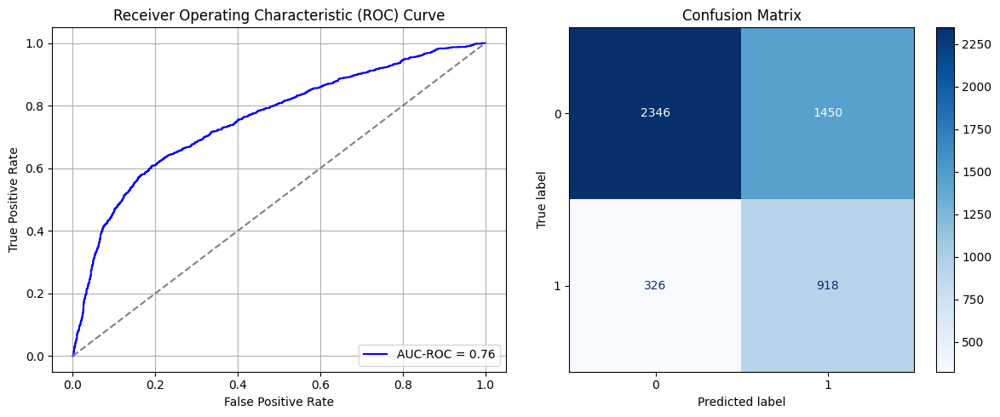

Best threshold based on F1-score: 0.9941210746765137
False Negative Rate: 0.2620578778135048
Time elapsed (performance): 1.1377553590009484
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6745 - loss: 0.6392 - val_AUC: 0.7467 - val_loss: 0.5857
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7420 - loss: 0.5904 - val_AUC: 0.7591 - val_loss: 0.5770
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7556 - loss: 0.5794 - val_AUC: 0.7667 - val_loss: 0.5704
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7596 - loss: 0.5768 - val_AUC: 0.7682 - val_loss: 0.5675
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7677 - loss: 0.5708 - val_AUC: 0.7773 - val_loss: 0.5649
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7657 - loss: 0.5718 - val_AUC: 0.7809 - val_loss: 0.5602
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7776 - loss: 0.5633 - val_AUC: 0.7776 - val_loss: 0.5633
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7760 - loss: 0.5616 - val_AUC: 0.7826 - val_loss: 0.5568
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7787 -

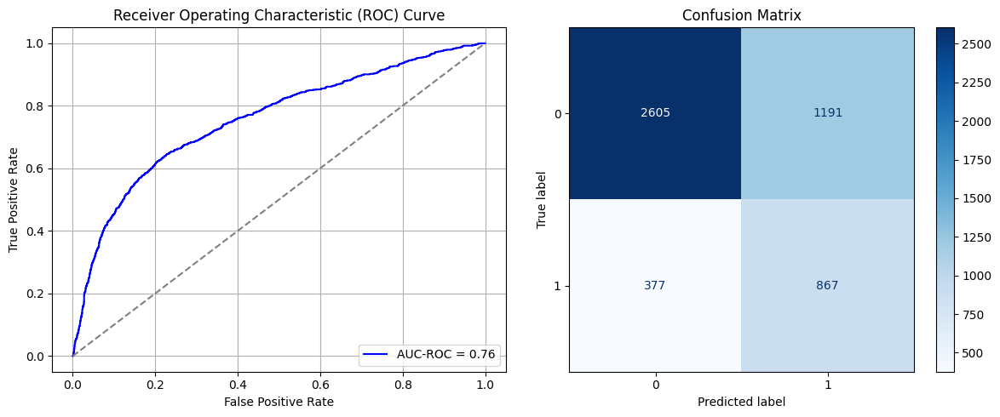

Best threshold based on F1-score: 0.989610493183136
False Negative Rate: 0.30305466237942125
Time elapsed (performance): 0.7272942700001295
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6706 - loss: 0.6421 - val_AUC: 0.7419 - val_loss: 0.5949
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7426 - loss: 0.5885 - val_AUC: 0.7546 - val_loss: 0.5808
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7560 - loss: 0.5792 - val_AUC: 0.7629 - val_loss: 0.5743
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7680 - loss: 0.5711 - val_AUC: 0.7660 - val_loss: 0.5734
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7659 - loss: 0.5719 - val_AUC: 0.7697 - val_loss: 0.5755
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7758 - loss: 0.5634 - val_AUC: 0.7728 - val_loss: 0.5713
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7751 - loss: 0.5637 - val_AUC: 0.7769 - val_loss: 0.5631
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7802 - loss: 0.5593 - val_AUC: 0.7777 - val_loss: 0.5712
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7809 -

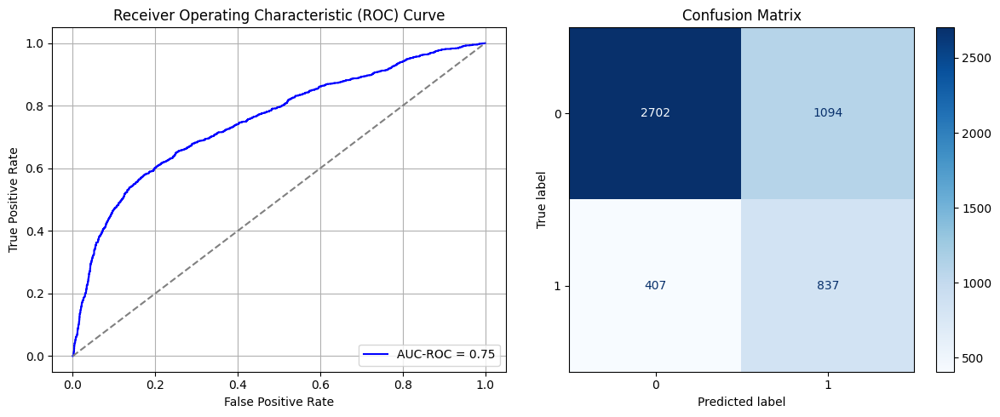

Best threshold based on F1-score: 0.9950986504554749
False Negative Rate: 0.3271704180064309
Time elapsed (performance): 0.7038585500013141
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6922 - loss: 0.6308 - val_AUC: 0.7527 - val_loss: 0.5822
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7453 - loss: 0.5887 - val_AUC: 0.7604 - val_loss: 0.5752
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7590 - loss: 0.5755 - val_AUC: 0.7711 - val_loss: 0.5686
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7647 - loss: 0.5746 - val_AUC: 0.7758 - val_loss: 0.5650
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7732 - loss: 0.5660 - val_AUC: 0.7784 - val_loss: 0.5614
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7800 - loss: 0.5593 - val_AUC: 0.7823 - val_loss: 0.5605
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7813 - loss: 0.5587 - val_AUC: 0.7839 - val_loss: 0.5620
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7818 - loss: 0.5582 - val_AUC: 0.7834 - val_loss: 0.5567
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7851 -

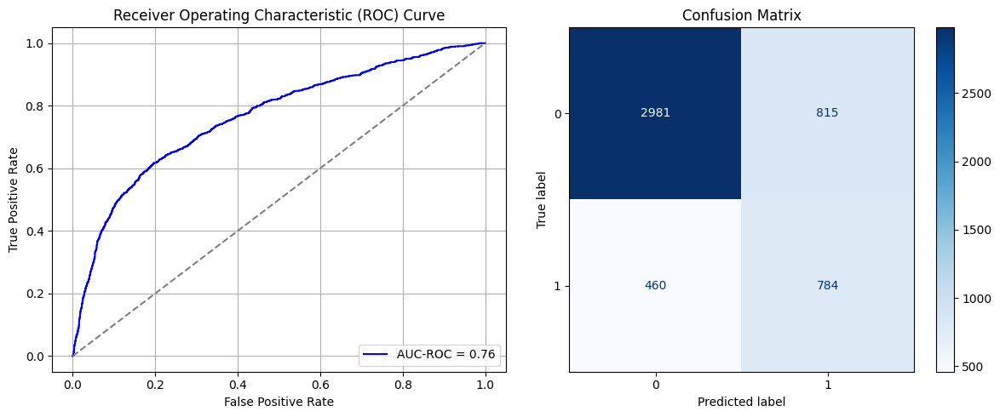

Best threshold based on F1-score: 0.9907203912734985
False Negative Rate: 0.36977491961414793
Time elapsed (performance): 0.7651954070006468
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6804 - loss: 0.6365 - val_AUC: 0.7471 - val_loss: 0.5880
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7435 - loss: 0.5893 - val_AUC: 0.7577 - val_loss: 0.5779
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7606 - loss: 0.5766 - val_AUC: 0.7637 - val_loss: 0.5769
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7669 - loss: 0.5696 - val_AUC: 0.7692 - val_loss: 0.5697
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7686 - loss: 0.5702 - val_AUC: 0.7805 - val_loss: 0.5653
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7770 - loss: 0.5639 - val_AUC: 0.7811 - val_loss: 0.5620
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7764 - loss: 0.5632 - val_AUC: 0.7798 - val_loss: 0.5604
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7820 - loss: 0.5576 - val_AUC: 0.7830 - val_loss: 0.5593
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7894 -

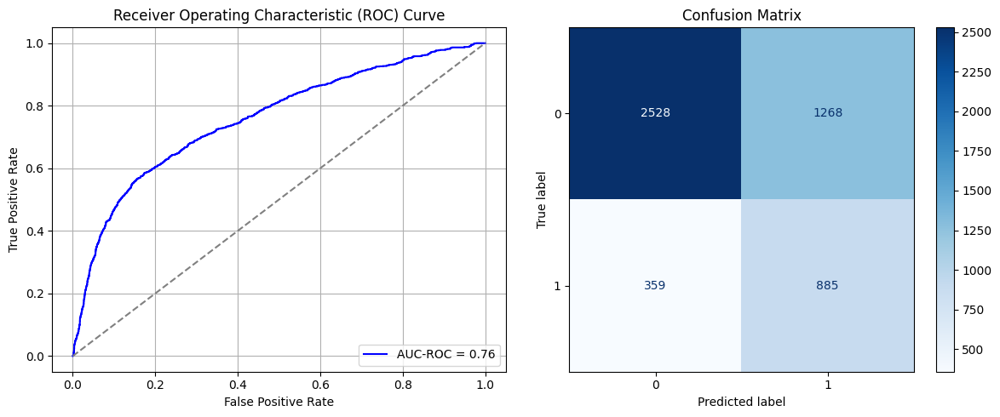

Best threshold based on F1-score: 0.994140625
False Negative Rate: 0.28858520900321544
Time elapsed (performance): 0.8024072719999822
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6762 - loss: 0.6374 - val_AUC: 0.7437 - val_loss: 0.5877
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7440 - loss: 0.5901 - val_AUC: 0.7566 - val_loss: 0.5777
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7593 - loss: 0.5766 - val_AUC: 0.7644 - val_loss: 0.5730
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7619 - loss: 0.5725 - val_AUC: 0.7658 - val_loss: 0.5701
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7670 - loss: 0.5715 - val_AUC: 0.7697 - val_loss: 0.5685
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7725 - loss: 0.5667 - val_AUC: 0.7742 - val_loss: 0.5633
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7802 - loss: 0.5572 - val_AUC: 0.7772 - val_loss: 0.5611
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7820 - loss: 0.5571 - val_AUC: 0.7805 - val_loss: 0.5614
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7812 -

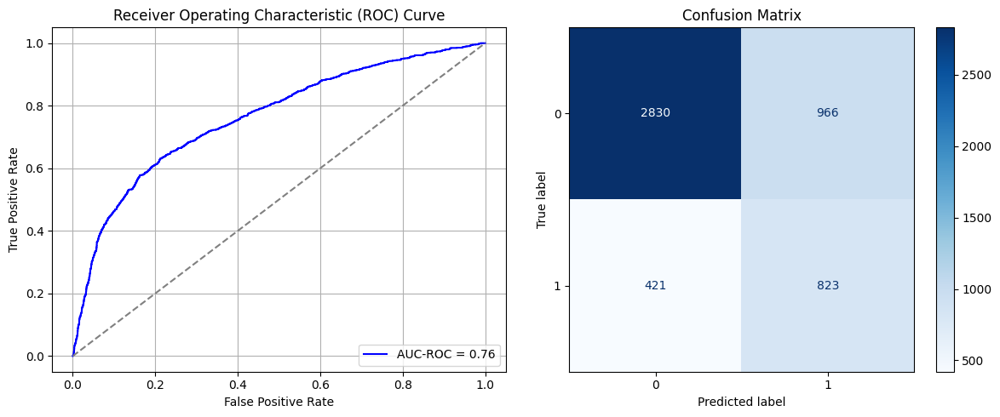

Best threshold based on F1-score: 0.990446150302887
False Negative Rate: 0.3384244372990354
Time elapsed (performance): 0.6908148170005006
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6800 - loss: 0.6381 - val_AUC: 0.7541 - val_loss: 0.5814
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7426 - loss: 0.5891 - val_AUC: 0.7616 - val_loss: 0.5741
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7464 - loss: 0.5848 - val_AUC: 0.7706 - val_loss: 0.5672
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7611 - loss: 0.5766 - val_AUC: 0.7778 - val_loss: 0.5634
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7721 - loss: 0.5650 - val_AUC: 0.7785 - val_loss: 0.5628
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7726 - loss: 0.5656 - val_AUC: 0.7808 - val_loss: 0.5591
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7725 - loss: 0.5663 - val_AUC: 0.7835 - val_loss: 0.5572
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7803 - loss: 0.5573 - val_AUC: 0.7886 - val_loss: 0.5534
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7819 -

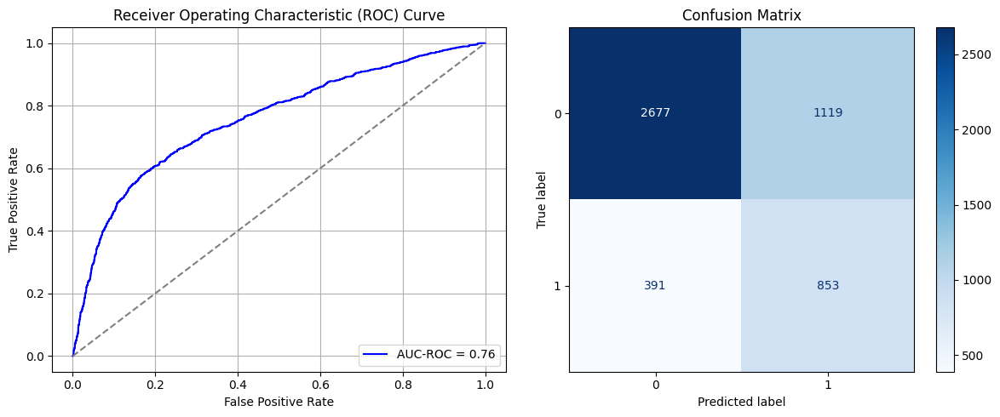

Best threshold based on F1-score: 0.9817020297050476
False Negative Rate: 0.31430868167202575
Time elapsed (performance): 1.2293489780004165
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6836 - loss: 0.6385 - val_AUC: 0.7453 - val_loss: 0.5922
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7367 - loss: 0.5924 - val_AUC: 0.7558 - val_loss: 0.5812
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7542 - loss: 0.5778 - val_AUC: 0.7662 - val_loss: 0.5739
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7640 - loss: 0.5725 - val_AUC: 0.7692 - val_loss: 0.5752
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7717 - loss: 0.5662 - val_AUC: 0.7751 - val_loss: 0.5648
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7693 - loss: 0.5697 - val_AUC: 0.7759 - val_loss: 0.5633
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7729 - loss: 0.5658 - val_AUC: 0.7796 - val_loss: 0.5682
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7801 - loss: 0.5594 - val_AUC: 0.7808 - val_loss: 0.5598
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7800 -

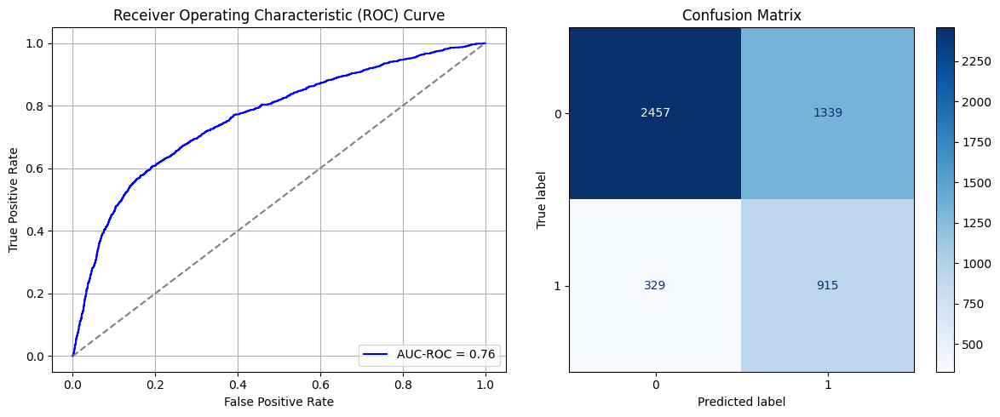

Best threshold based on F1-score: 0.9899521470069885
False Negative Rate: 0.2644694533762058
Time elapsed (performance): 0.7207429300015065
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6775 - loss: 0.6396 - val_AUC: 0.7408 - val_loss: 0.5914
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7509 - loss: 0.5848 - val_AUC: 0.7579 - val_loss: 0.5811
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7552 - loss: 0.5810 - val_AUC: 0.7632 - val_loss: 0.5753
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7662 - loss: 0.5725 - val_AUC: 0.7706 - val_loss: 0.5697
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7689 - loss: 0.5693 - val_AUC: 0.7738 - val_loss: 0.5679
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7714 - loss: 0.5672 - val_AUC: 0.7749 - val_loss: 0.5690
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7767 - loss: 0.5634 - val_AUC: 0.7769 - val_loss: 0.5669
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7783 - loss: 0.5616 - val_AUC: 0.7786 - val_loss: 0.5760
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7783 -

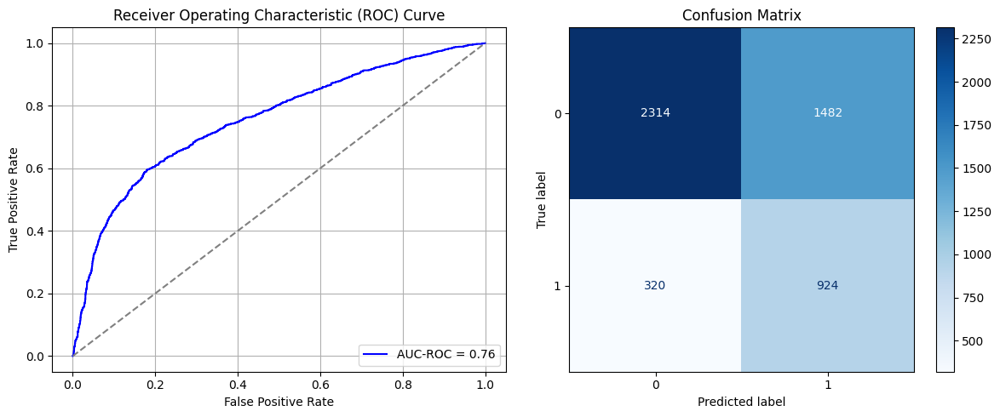

Best threshold based on F1-score: 0.993657648563385
False Negative Rate: 0.2572347266881029
Time elapsed (performance): 0.7446171070005221
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.6869 - loss: 0.6351 - val_AUC: 0.7489 - val_loss: 0.5892
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7465 - loss: 0.5861 - val_AUC: 0.7585 - val_loss: 0.5765
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7563 - loss: 0.5764 - val_AUC: 0.7685 - val_loss: 0.5692
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7648 - loss: 0.5697 - val_AUC: 0.7729 - val_loss: 0.5639
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7705 - loss: 0.5658 - val_AUC: 0.7762 - val_loss: 0.5650
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7740 - loss: 0.5633 - val_AUC: 0.7791 - val_loss: 0.5613
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7768 - loss: 0.5604 - val_AUC: 0.7825 - val_loss: 0.5571
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7759 - loss: 0.5624 - val_AUC: 0.7855 - val_loss: 0.5552
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7834 -

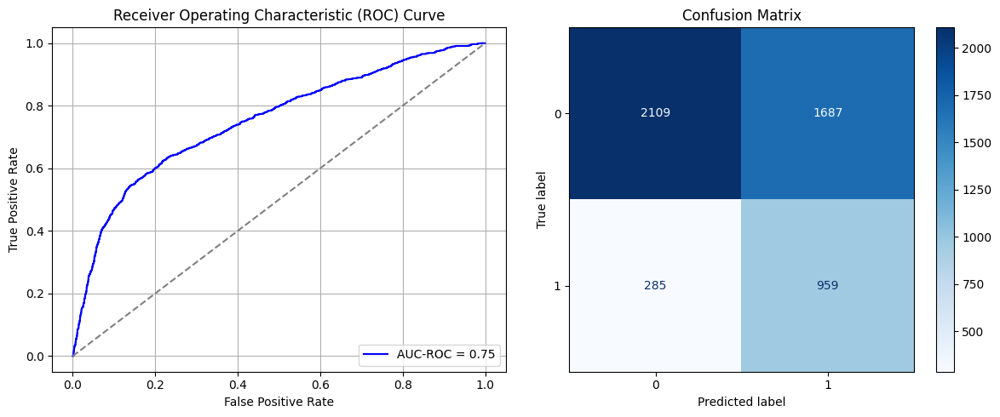

Best threshold based on F1-score: 0.9841462969779968
False Negative Rate: 0.22909967845659163
Time elapsed (performance): 0.7434840719997737
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6872 - loss: 0.6385 - val_AUC: 0.7499 - val_loss: 0.5823
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7426 - loss: 0.5889 - val_AUC: 0.7572 - val_loss: 0.5756
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7498 - loss: 0.5819 - val_AUC: 0.7631 - val_loss: 0.5723
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7601 - loss: 0.5745 - val_AUC: 0.7714 - val_loss: 0.5676
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7617 - loss: 0.5731 - val_AUC: 0.7786 - val_loss: 0.5648
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7720 - loss: 0.5669 - val_AUC: 0.7785 - val_loss: 0.5624
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7726 - loss: 0.5644 - val_AUC: 0.7819 - val_loss: 0.5594
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7780 - loss: 0.5609 - val_AUC: 0.7762 - val_loss: 0.5811
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7766 -

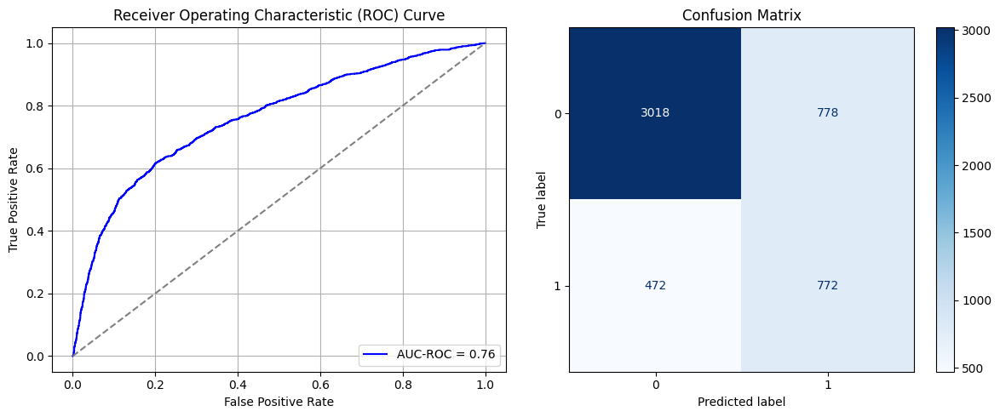

Best threshold based on F1-score: 0.9883688688278198
False Negative Rate: 0.37942122186495175
Time elapsed (performance): 0.7061159700006101
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6668 - loss: 0.6378 - val_AUC: 0.7504 - val_loss: 0.5848
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7462 - loss: 0.5834 - val_AUC: 0.7620 - val_loss: 0.5731
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7577 - loss: 0.5757 - val_AUC: 0.7697 - val_loss: 0.5700
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7615 - loss: 0.5752 - val_AUC: 0.7722 - val_loss: 0.5742
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7725 - loss: 0.5667 - val_AUC: 0.7720 - val_loss: 0.5665
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7744 - loss: 0.5624 - val_AUC: 0.7741 - val_loss: 0.5674
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7747 - loss: 0.5620 - val_AUC: 0.7834 - val_loss: 0.5601
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7854 - loss: 0.5539 - val_AUC: 0.7854 - val_loss: 0.5570
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7862 -

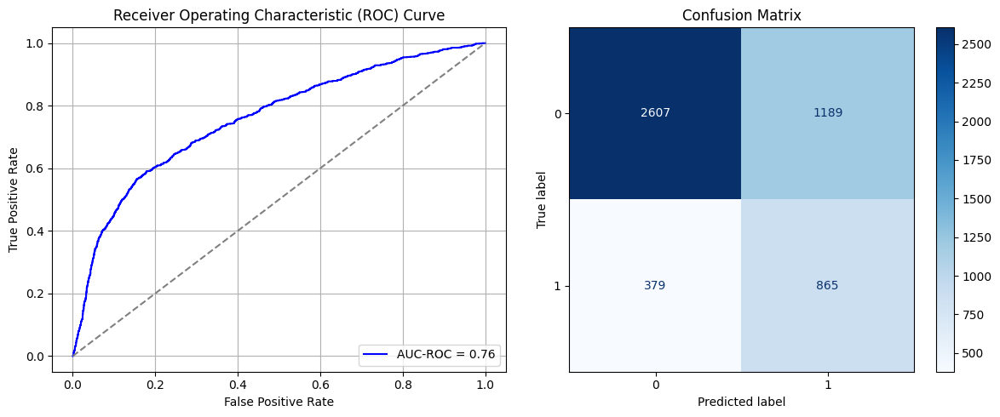

Best threshold based on F1-score: 0.9809699654579163
False Negative Rate: 0.3046623794212219
Time elapsed (performance): 0.6986143710000761
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6886 - loss: 0.6325 - val_AUC: 0.7388 - val_loss: 0.5896
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7461 - loss: 0.5853 - val_AUC: 0.7475 - val_loss: 0.5844
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7481 - loss: 0.5841 - val_AUC: 0.7541 - val_loss: 0.5801
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7617 - loss: 0.5740 - val_AUC: 0.7602 - val_loss: 0.5744
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7642 - loss: 0.5710 - val_AUC: 0.7626 - val_loss: 0.5732
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7699 - loss: 0.5695 - val_AUC: 0.7673 - val_loss: 0.5731
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7733 - loss: 0.5653 - val_AUC: 0.7699 - val_loss: 0.5667
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7840 - loss: 0.5541 - val_AUC: 0.7698 - val_loss: 0.5665
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7769 -

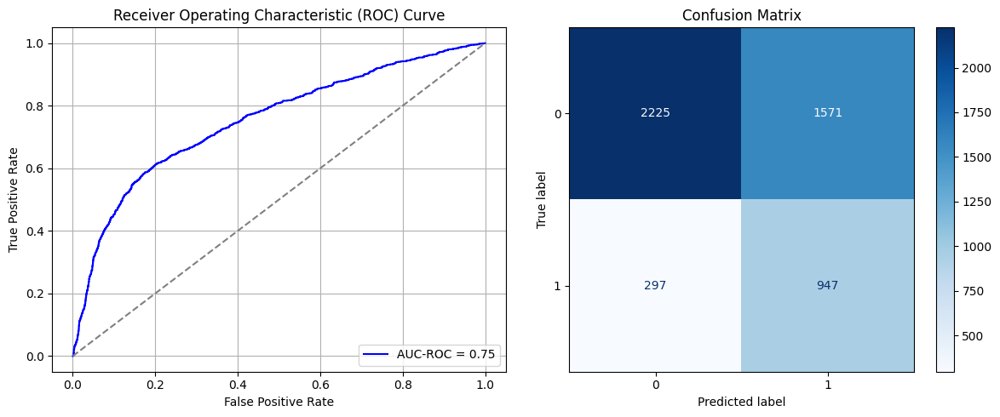

Best threshold based on F1-score: 0.6466304659843445
False Negative Rate: 0.2387459807073955
Time elapsed (performance): 0.7481836200004182
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.6849 - loss: 0.6356 - val_AUC: 0.7461 - val_loss: 0.5863
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7445 - loss: 0.5865 - val_AUC: 0.7565 - val_loss: 0.5799
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7555 - loss: 0.5791 - val_AUC: 0.7615 - val_loss: 0.5733
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7598 - loss: 0.5766 - val_AUC: 0.7702 - val_loss: 0.5688
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7687 - loss: 0.5680 - val_AUC: 0.7715 - val_loss: 0.5667
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7729 - loss: 0.5657 - val_AUC: 0.7761 - val_loss: 0.5676
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7744 - loss: 0.5640 - val_AUC: 0.7768 - val_loss: 0.5623
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7809 - loss: 0.5586 - val_AUC: 0.7780 - val_loss: 0.5664
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7755 -

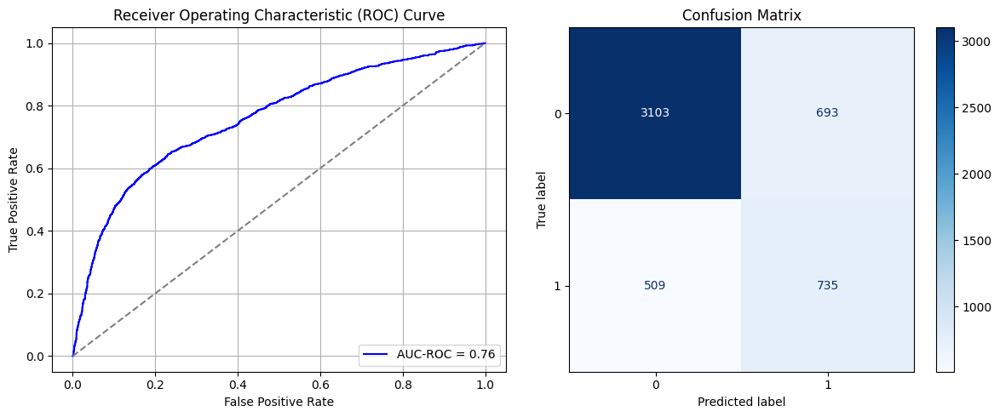

Best threshold based on F1-score: 0.9843795895576477
False Negative Rate: 0.4091639871382637
Time elapsed (performance): 0.7038674420000461
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6867 - loss: 0.6339 - val_AUC: 0.7439 - val_loss: 0.5980
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7396 - loss: 0.5931 - val_AUC: 0.7615 - val_loss: 0.5750
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7581 - loss: 0.5759 - val_AUC: 0.7657 - val_loss: 0.5701
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7632 - loss: 0.5714 - val_AUC: 0.7766 - val_loss: 0.5649
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7658 - loss: 0.5710 - val_AUC: 0.7792 - val_loss: 0.5593
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7772 - loss: 0.5605 - val_AUC: 0.7825 - val_loss: 0.5594
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7771 - loss: 0.5611 - val_AUC: 0.7826 - val_loss: 0.5588
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7798 - loss: 0.5582 - val_AUC: 0.7849 - val_loss: 0.5576
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7771 -

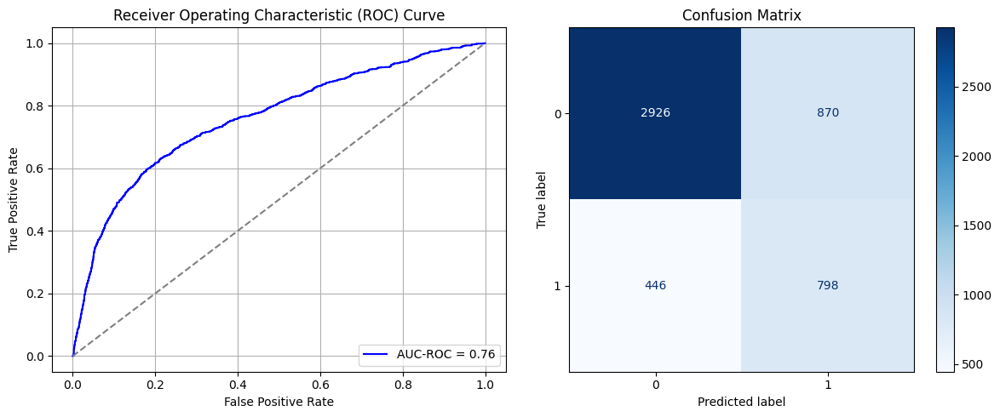

Best threshold based on F1-score: 0.9919065237045288
False Negative Rate: 0.35852090032154343
Time elapsed (performance): 0.7187698190009542
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.6768 - loss: 0.6390 - val_AUC: 0.7485 - val_loss: 0.5908
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7407 - loss: 0.5898 - val_AUC: 0.7572 - val_loss: 0.5765
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7552 - loss: 0.5778 - val_AUC: 0.7597 - val_loss: 0.5830
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7631 - loss: 0.5743 - val_AUC: 0.7681 - val_loss: 0.5670
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7641 - loss: 0.5721 - val_AUC: 0.7723 - val_loss: 0.5645
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7710 - loss: 0.5676 - val_AUC: 0.7747 - val_loss: 0.5626
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7727 - loss: 0.5664 - val_AUC: 0.7782 - val_loss: 0.5601
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7761 - loss: 0.5624 - val_AUC: 0.7812 - val_loss: 0.5605
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7788 -

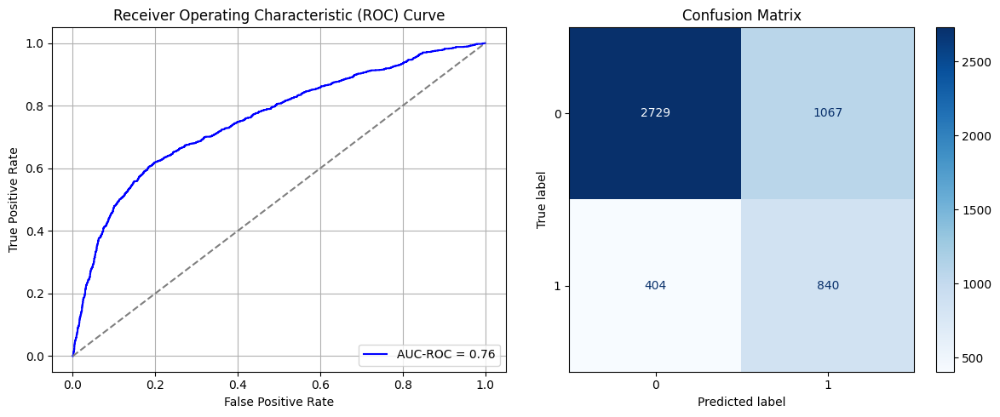

Best threshold based on F1-score: 0.5757309198379517
False Negative Rate: 0.3247588424437299
Time elapsed (performance): 0.6914934129999892
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6889 - loss: 0.6363 - val_AUC: 0.7557 - val_loss: 0.5796
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7495 - loss: 0.5840 - val_AUC: 0.7647 - val_loss: 0.5721
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7509 - loss: 0.5813 - val_AUC: 0.7665 - val_loss: 0.5714
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7658 - loss: 0.5695 - val_AUC: 0.7744 - val_loss: 0.5639
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7673 - loss: 0.5688 - val_AUC: 0.7798 - val_loss: 0.5625
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7731 - loss: 0.5654 - val_AUC: 0.7863 - val_loss: 0.5546
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7775 - loss: 0.5621 - val_AUC: 0.7866 - val_loss: 0.5550
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7804 - loss: 0.5597 - val_AUC: 0.7869 - val_loss: 0.5564
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7808 -

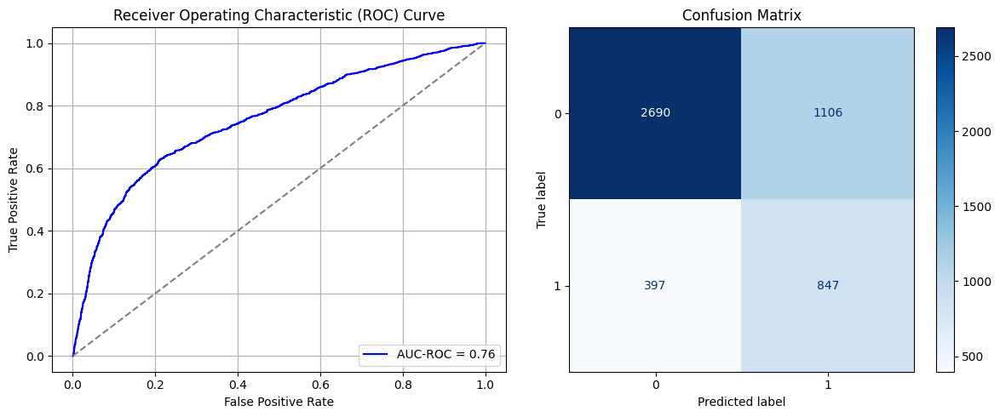

Best threshold based on F1-score: 0.9893494248390198
False Negative Rate: 0.31913183279742763
Time elapsed (performance): 0.7221024199989188
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6793 - loss: 0.6380 - val_AUC: 0.7502 - val_loss: 0.5840
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7473 - loss: 0.5838 - val_AUC: 0.7609 - val_loss: 0.5758
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7551 - loss: 0.5807 - val_AUC: 0.7645 - val_loss: 0.5737
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7618 - loss: 0.5759 - val_AUC: 0.7725 - val_loss: 0.5677
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7658 - loss: 0.5714 - val_AUC: 0.7754 - val_loss: 0.5691
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7691 - loss: 0.5707 - val_AUC: 0.7803 - val_loss: 0.5619
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7757 - loss: 0.5651 - val_AUC: 0.7806 - val_loss: 0.5613
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7756 - loss: 0.5643 - val_AUC: 0.7836 - val_loss: 0.5592
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7759 -

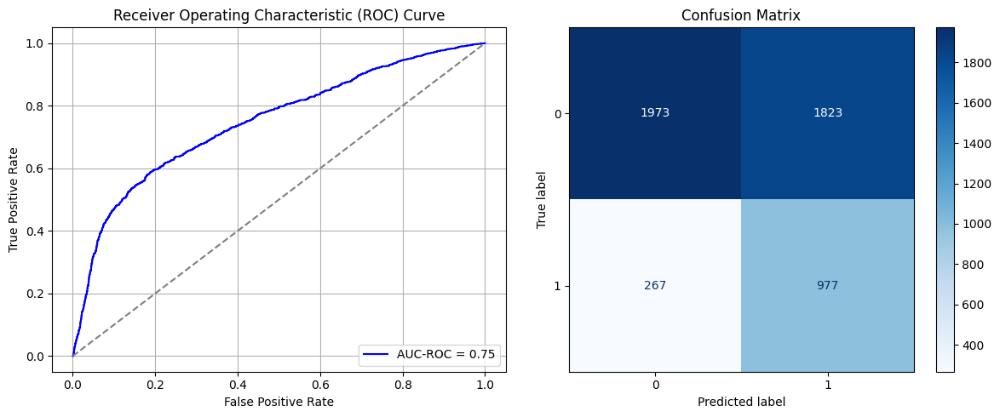

Best threshold based on F1-score: 0.6325339078903198
False Negative Rate: 0.21463022508038584
Time elapsed (performance): 1.2390904720014078
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6743 - loss: 0.6398 - val_AUC: 0.7397 - val_loss: 0.5952
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7391 - loss: 0.5912 - val_AUC: 0.7507 - val_loss: 0.5868
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7569 - loss: 0.5770 - val_AUC: 0.7601 - val_loss: 0.5773
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7607 - loss: 0.5748 - val_AUC: 0.7699 - val_loss: 0.5698
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7684 - loss: 0.5677 - val_AUC: 0.7751 - val_loss: 0.5679
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7699 - loss: 0.5663 - val_AUC: 0.7793 - val_loss: 0.5632
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7759 - loss: 0.5616 - val_AUC: 0.7831 - val_loss: 0.5593
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7756 - loss: 0.5625 - val_AUC: 0.7821 - val_loss: 0.5585
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7759 -

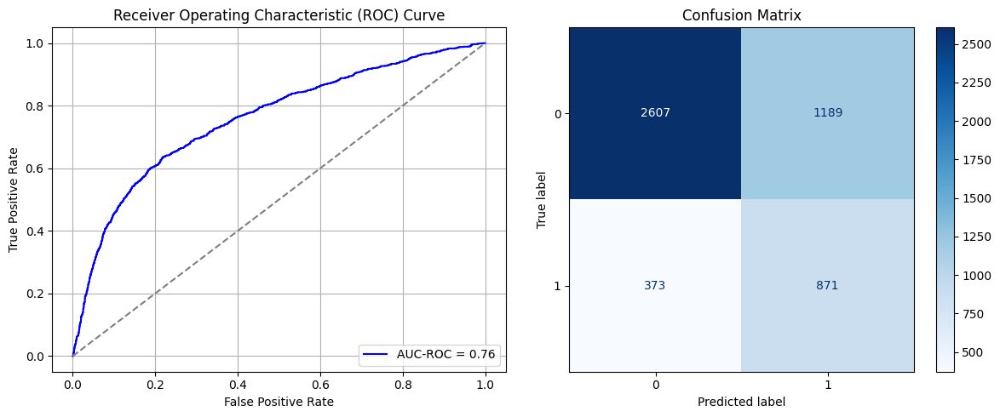

Best threshold based on F1-score: 0.9634963870048523
False Negative Rate: 0.29983922829581994
Time elapsed (performance): 0.7256720770001266
Epoch 1/10


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


761/761 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6643 - loss: 0.6397 - val_AUC: 0.7426 - val_loss: 0.5898
Epoch 2/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7417 - loss: 0.5888 - val_AUC: 0.7515 - val_loss: 0.5802
Epoch 3/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7512 - loss: 0.5828 - val_AUC: 0.7620 - val_loss: 0.5727
Epoch 4/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7602 - loss: 0.5742 - val_AUC: 0.7667 - val_loss: 0.5673
Epoch 5/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7676 - loss: 0.5698 - val_AUC: 0.7739 - val_loss: 0.5636
Epoch 6/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7708 - loss: 0.5675 - val_AUC: 0.7763 - val_loss: 0.5622
Epoch 7/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7782 - loss: 0.5595 - val_AUC: 0.7785 - val_loss: 0.5626
Epoch 8/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7783 - loss: 0.5606 - val_AUC: 0.7792 - val_loss: 0.5591
Epoch 9/10
761/761 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7810 -

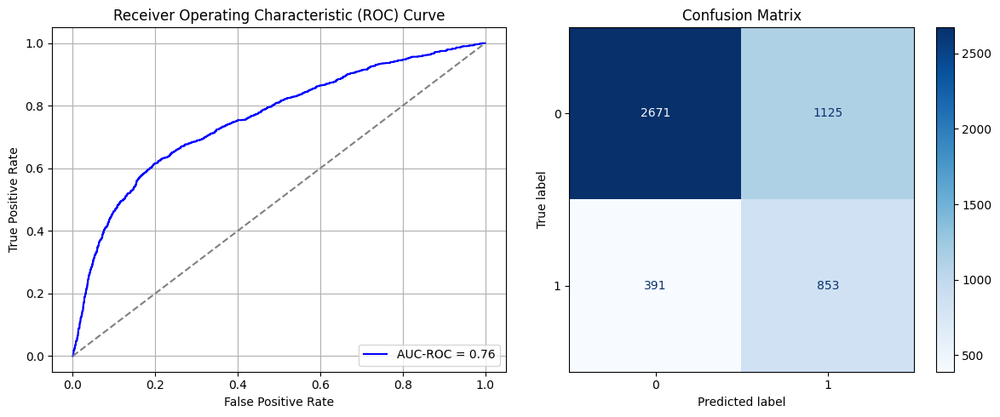

Best threshold based on F1-score: 0.9854089617729187
False Negative Rate: 0.31430868167202575
Time elapsed (performance): 1.021014752001065


<ipython-input-54-64b595990d04>:54: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


In [83]:
times = 20

Training_time = []
FPR = []
TPR = []
FNR = []
TNR = []
TL_time = []

k = 10
Nsamples = k*(oversample_size-undersample_size)/undersample_size



for i in range(times):
    start = np.random.choice(int(k), int(Nsamples), replace=True)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/k)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    data_S_min_ros = pd.DataFrame()
    data_S_min_ros = data_S_minority.iloc[Row]
    data_S_Sy_ROS = pd.concat([data_S_majority, data_S_min_ros, data_S_minority])
    X_S_Sy_ROS = data_S_Sy_ROS.iloc[:, :-1]
    y_S_Sy_ROS = data_S_Sy_ROS.iloc[:, -1]
    X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy_ROS, y_S_Sy_ROS, test_size=0.20, random_state=0)
    model_Sy_ROS = create_dnn_model(X_S_train.shape[1])
    result_Sy_ROS = train_and_evaluate(model_Sy_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
    result_TL_Sy_ROS = Transductive_TL(model_Sy_ROS, X_T_full, y_T_full, "Target")

    Training_time.append(result_Sy_ROS)
    FPR.append(result_TL_Sy_ROS[0])
    TNR.append(result_TL_Sy_ROS[1])
    FNR.append(result_TL_Sy_ROS[2])
    TPR.append(result_TL_Sy_ROS[3])
    TL_time.append(result_TL_Sy_ROS[4])

ParamFit = pd.DataFrame([Training_time, FPR, TNR, FNR, TPR, TL_time]).T
ParamFit.columns=['Source time', 'FPR', 'TNR', 'FNR', 'TPR', 'Target time']
# print(ParamFit)

In [84]:
print(ParamFit)
ParamFit.to_csv('Sy_ROS2.csv')

    Source time       FPR       TNR       FNR       TPR  Target time
0     33.431997  0.381981  0.618019  0.262058  0.737942     1.137755
1     30.589877  0.313751  0.686249  0.303055  0.696945     0.727294
2     32.668209  0.288198  0.711802  0.327170  0.672830     0.703859
3     26.552969  0.214700  0.785300  0.369775  0.630225     0.765195
4     32.556232  0.334036  0.665964  0.288585  0.711415     0.802407
5     29.180931  0.254478  0.745522  0.338424  0.661576     0.690815
6     29.946917  0.294784  0.705216  0.314309  0.685691     1.229349
7     30.977421  0.352740  0.647260  0.264469  0.735531     0.720743
8     29.833386  0.390411  0.609589  0.257235  0.742765     0.744617
9     32.719423  0.444415  0.555585  0.229100  0.770900     0.743484
10    29.065274  0.204953  0.795047  0.379421  0.620579     0.706116
11    31.978599  0.313224  0.686776  0.304662  0.695338     0.698614
12    32.088692  0.413857  0.586143  0.238746  0.761254     0.748184
13    30.592271  0.182561  0.81743